In [1]:
import numpy as np
import pandas as pd
import pygeostat as gs
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
import subprocess as sp
%pylab inline --no-import-all
from subprocess import check_output
import tensorflow as tf
from tensorflow.python import debug as tf_debug
import os
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans
from sklearn import preprocessing
import scipy.spatial as scs
import scipy as sc
import math
from scipy.spatial import distance
from sklearn.metrics import mean_squared_error
import time
from sklearn.metrics import r2_score
from random import randrange

Populating the interactive namespace from numpy and matplotlib


C:\ProgramData\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
plt_extent = 'Sensitivity_3'

In [3]:
griddef = gs.GridDef(gridfl='griddef.txt')
griddef

Pygeostat GridDef:
50 5.0 10.0 
50 5.0 10.0 
25 5.0 10.0

In [4]:
varmodelpar = '''                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
varmodel.out                 -file for modeled variogram points output
2                            -number of directions to model points along
 135   0.0  1000   0.5      -  azm, dip, npoints, point separation
 45   0.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.01                   -nst, nugget effect
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        250    150    75    -a_hmax, a_hmin, a_vert (ranges)
0   100000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
varcalc.out                  -    experimental output file 1
2   1   4                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
varmodelfit.var              -  file to save fit variogram model
'''
varmodel= gs.Program(program='varmodel',parfile='varmodel.par')
varmodel.run(parstr=varmodelpar.format())
varmodelfl = gs.DataFile(flname='varmodel.out',
                       readfl=True)
print(varmodelfl.data.head())

Calling:  ['varmodel', 'varmodel.par']

varmodel version: 1.1.1

  output points file: varmodel.out
  number of directions to model points along:            2
  azm, dip, npoints, pointsep:    135.000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:    45.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-002  1.000000000000000E-002
  fit model?            0      100000
  number of variogram files:            1
  variogram file: varcalc.out
  using variograms            1           4
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output file: varmodelfit.var
  Modeling points

varmodel completed successfully

   Variogram Index  Lag Distance  Number of Pairs  Variogram Value  \


In [5]:
varmodelfl = gs.DataFile(flname='varmodel.out',
                       readfl=True)
print(varmodelfl.data.head())

   Variogram Index  Lag Distance  Number of Pairs  Variogram Value  \
0              1.0           0.5              1.0         0.010012   
1              1.0           1.0              1.0         0.010047   
2              1.0           1.5              1.0         0.010107   
3              1.0           2.0              1.0         0.010190   
4              1.0           2.5              1.0         0.010297   

   Variogram Number  Calculation Azimuth  Calculation Dip  
0               1.0                135.0              0.0  
1               1.0                135.0              0.0  
2               1.0                135.0              0.0  
3               1.0                135.0              0.0  
4               1.0                135.0              0.0  


In [6]:
varg = ("1    0.01                   -nst, nugget effect\n\
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)\n\
        250    150    75    -a_hmax, a_hmin, a_vert (ranges)")

print(varg)

1    0.01                   -nst, nugget effect
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        250    150    75    -a_hmax, a_hmin, a_vert (ranges)


In [7]:
sgsimpar = '''                  Parameters for SGSIM
                  ********************

START OF PARAMETERS:
cluster.dat           -file with data
1  2  3  4  0  0              -  columns for X,Y,Z,vr,wt,sec.var.
-1.0       1.0e21             -  trimming limits
0                             -transform the data (0=no, 1=yes)
sgsim.trn                     -  file for output trans table
0                             -  consider ref. dist (0=no, 1=yes)
histsmth.out                  -  file with ref. dist distribution
1  2                          -  columns for vr and wt
0.0    15.0                   -  zmin,zmax(tail extrapolation)
1       0.0                   -  lower tail option, parameter
1      15.0                   -  upper tail option, parameter
1                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output
sgsim.out                     -file for simulation output
1                             -number of realizations to generate
{grid}
69069                         -random number seed
0     8                       -min and max original data for sim
48                            -number of simulated nodes to use
1                             -assign data to nodes (0=no, 1=yes)
1     3                       -multiple grid search (0=no, 1=yes),num
0                             -maximum data per octant (0=not used)
250  250.0  150.0              -maximum search radii (hmax,hmin,vert)
 0.0   0.0   0.0              -angles for search ellipsoid
51    51    11                -size of covariance lookup table
0     0.60   1.0              -ktype: 0=SK,1=OK,2=LVM,3=EXDR,4=COLC
../data/ydata.dat             -  file with LVM, EXDR, or COLC variable
4                             -  column for secondary variable
{varg}

'''
sgsim= gs.Program(program='sgsim',parfile='sgsim.par')
sgsim.run(parstr=sgsimpar.format(varg = varg,
                                 grid = griddef
                                ))
sgsimfl = gs.DataFile(flname='sgsim.out', griddef = griddef,
                       readfl=True)
print(sgsimfl.data.head())

Calling:  ['sgsim', 'sgsim.par']

 SGSIM Version: 4.000

  data file = cluster.dat                             
  input columns =            1           2           3           4           0
           0
  trimming limits =   -1.000000      1.0000000E+21
  transformation flag =            0
  transformation file = sgsim.trn                               
  consider smoothed distribution (1=yes) =            0
  file with smoothed distribution = histsmth.out                            
  columns =            1           2
  data limits (tails) =   0.0000000E+00   15.00000    
  lower tail =            1  0.0000000E+00
  upper tail =            1   15.00000    
  debugging level =            1
  debugging file = sgsim.dbg                               
  output file sgsim.out                               
  number of realizations =            1
  X grid specification =           50   5.000000       10.00000    
  Y grid specification =           50   5.000000       10.00000    
  Z grid

In [12]:
lognpar = """              Convert to logn
             *********************************

START OF PARAMETERS:
{datafl}                           - data file
1   {std}                                 - mean and standard deviation you want
logn/logn_{fold}.out                          - output file with lognormal data
"""

In [14]:
logn = gs.Program('logn')
for fold in range (1,11):
    logn.run(parstr=lognpar.format(datafl = sgsimfl,
                                  std = 0.2 + (fold-1)*0.2,
                                  fold = fold))

Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim.out                               
  mean and stdev you want =    1.00000000000000       0.200000000000000     
  file for output = logn/logn_1.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim.out                               
  mean and stdev you want =    1.00000000000000       0.400000000000000     
  file for output = logn/logn_2.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version:          1.1000

  data file = sgsim.out                               
  mean and stdev you want =    1.00000000000000       0.600000000000000     
  file for output = logn/logn_3.out                         

Finished converting    62500 values
 ERROR in parameter file
Calling:  ['logn', 'temp']

 LOGNORM Version: 

In [20]:
addcoordpar = '''                  Parameters for ADDCOORD
                  ***********************

START OF PARAMETERS:
{datafl}                         -file with data
logn/addcoord_{fold}.out                      -file for output
1                                 -realization number
{grid}
3 3 6                            -decimals for x, y, z (-1=exclude)
'''

addcoord= gs.Program(program='addcoord',parfile='addcoord.par')
for fold in range (1,11):
    logn = gs.DataFile('logn/logn_{}.out'.format(fold),griddef=griddef)
    addcoord.run(parstr=addcoordpar.format(datafl=logn.flname
                                    ,grid = griddef,
                                    fold = fold       
                                    ))

Calling:  ['addcoord', 'addcoord.par']

 ADDCOORD VERSION: 4.1.0

 Data File = logn/logn_1.out                         
 Output File = logn/addcoord_1.out                     
 Realization number =            1
 X grid size =           50   5.00000000000000        10.0000000000000     
 Y grid size =           50   5.00000000000000        10.0000000000000     
 Z grid size =           25   5.00000000000000        10.0000000000000     
 decimals =            3           3           6
 
 Format: (f07.03,x,f07.03,x,f10.06,x,a)      

 ADDCOORD: 4.1.0 Finished

Calling:  ['addcoord', 'addcoord.par']

 ADDCOORD VERSION: 4.1.0

 Data File = logn/logn_2.out                         
 Output File = logn/addcoord_2.out                     
 Realization number =            1
 X grid size =           50   5.00000000000000        10.0000000000000     
 Y grid size =           50   5.00000000000000        10.0000000000000     
 Z grid size =           25   5.00000000000000        10.0000000000000   

In [23]:
gsamplepar = '''       Parameters for gsample V2.000
     *********************************
       
START OF PARAMETERS:
1                            - Number of files to sample
{datafl}            - File with first grid
1  {varcol1}                        - Number of variables and columns
1                            - Realization to sample
{griddef}
0                            - Sampling spacing option (0=regular, 1=random)
75  75                      -  If 0, spacing in X, Y
30  30                     -  If 0, collar of the first sample, X and Y (inside sampling grid)
100  69069                    -  If 1, number of drill holes and seed number
0  90                        - Azimuth and dip
10                            - Sample spacing downhole
1                          - Starting drill hole ID for new drills
2                            - Number of decimal places (coordinates precision, up to 6)
5   495                       - Sampling grid: xmin, xmax
5   495                       -                ymin, ymax
5   245                       -                zmin, zmax
dhs_{fold}.out        - Output file with new drill holes
0                            - Output keyout file? (0=no, 1=yes)
0                            -  If keyout (0=input grid inside sampling grid, 1=input blocks with assays)
keyout.out         - Keyout file
'''
for fold in range (1,11):
    sgsimfl = gs.DataFile('logn/addcoord_{}.out'.format(fold),griddef=griddef)
    gsample= gs.Program(program='gsample',parfile='gsample.par')
    gsample.run(parstr=gsamplepar.format(datafl=sgsimfl.flname,
                                           varcol1=sgsimfl.gscol('value'),
                                           griddef=griddef,
                                           fold=fold,
                                           ))

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
logn/addcoord_1.out
Variable columns                =   4
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    75.0    
Spacing in Y                  

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
logn/addcoord_5.out
Variable columns                =   4
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    75.0    
Spacing in Y                  

Calling:  ['gsample', 'gsample.par']

GSAMPLE Version: 1.000

PARAMETER FILE                  = gsample.par                                                                                                                                                                                                                                                     
-----------------------------------------------------------------------------

INPUT PARAMETERS 

Number of grids to sample       =   1
Total number of variables       =   1
 
Data file  1                    = 
logn/addcoord_9.out
Variable columns                =   4
 
Sample realization number       =   1
 
Input grid 
Input grid in X                 =   50        5.00   10.00
Input grid in Y                 =   50        5.00   10.00
Input grid in Z                 =   25        5.00   10.00
 
Sample option                   =   0
 
Consider regular spacing 

 
Spacing in X                    =    75.0    
Spacing in Y                  

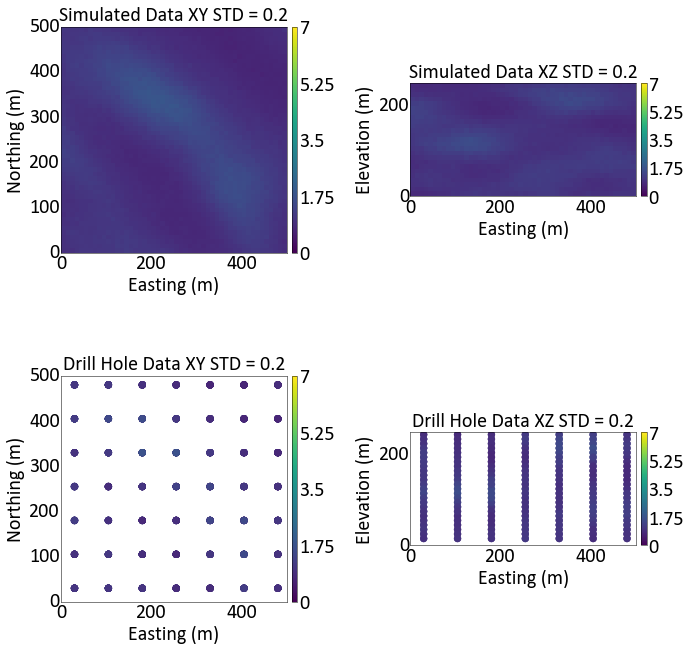

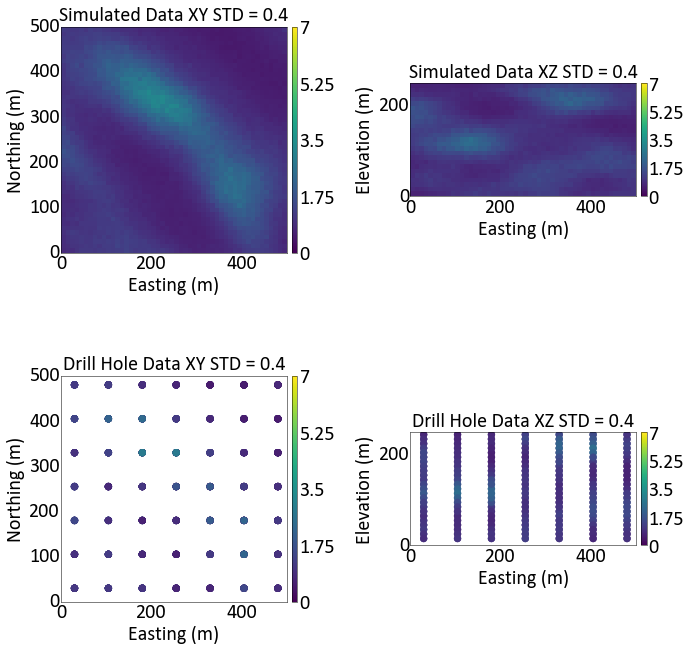

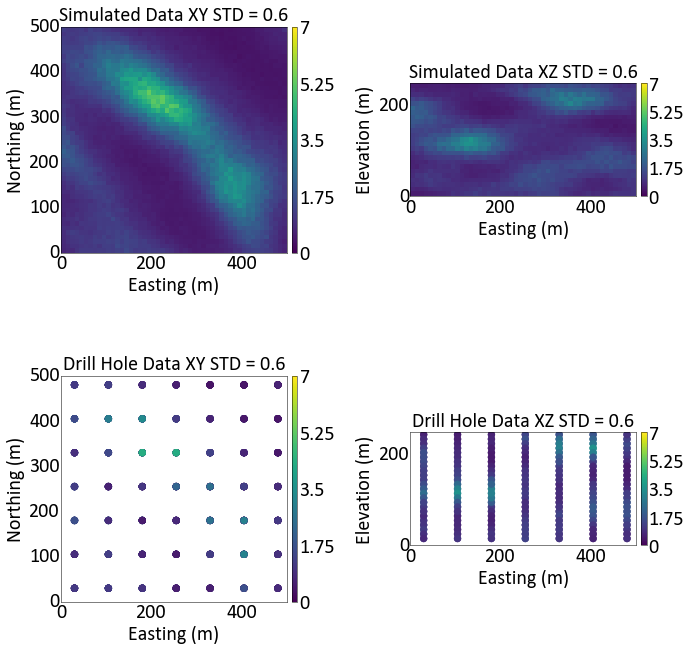

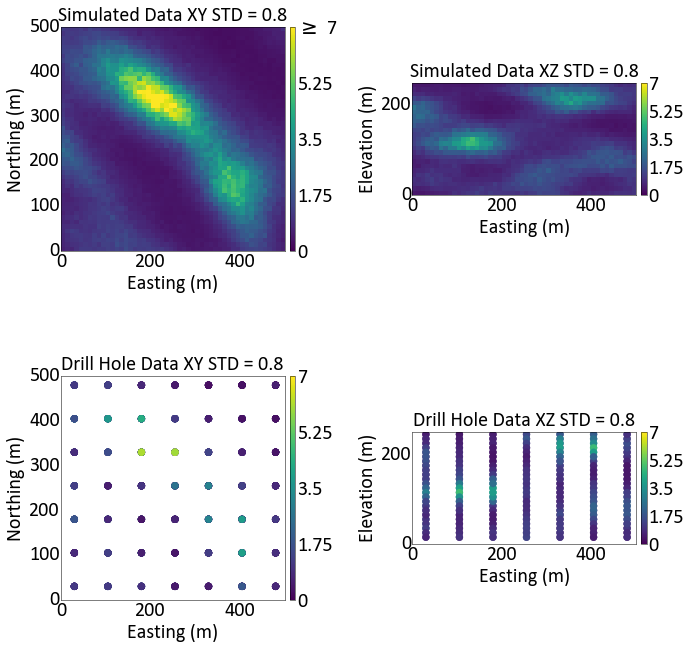

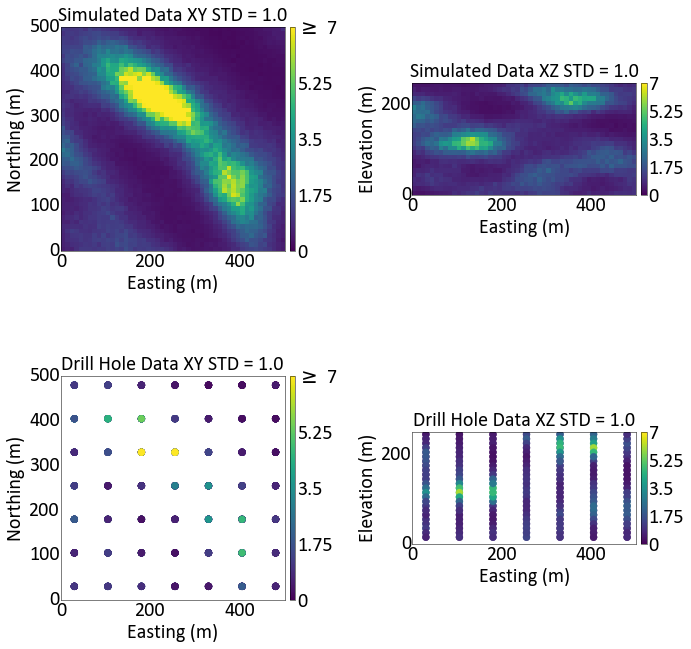

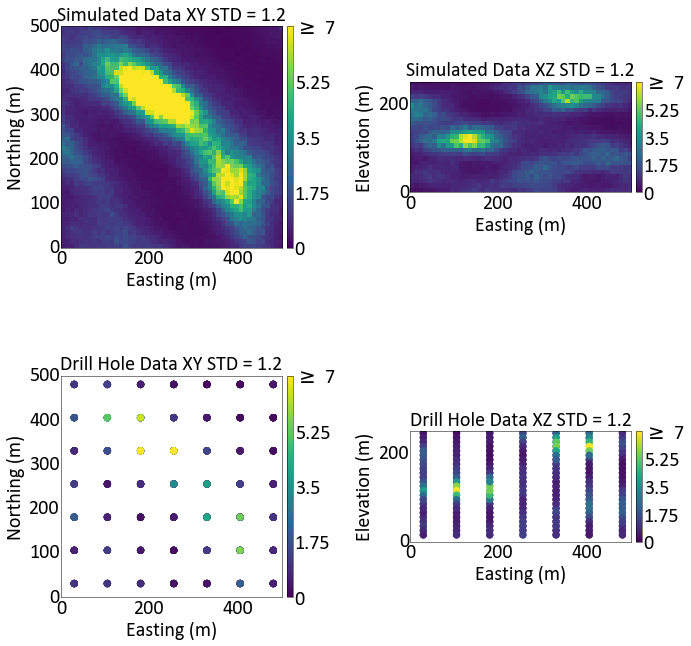

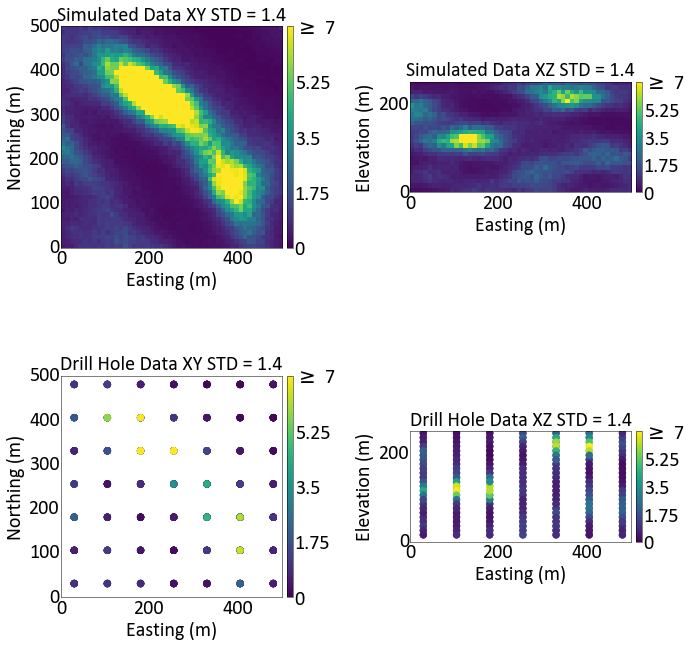

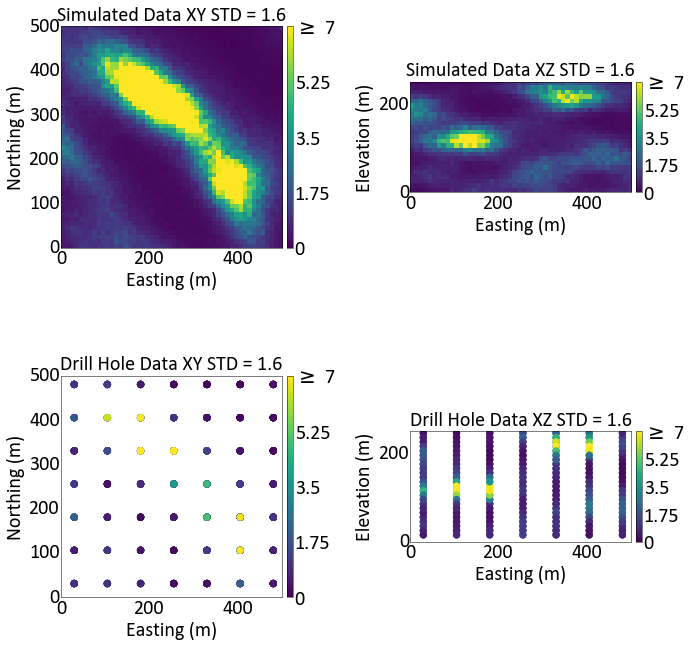

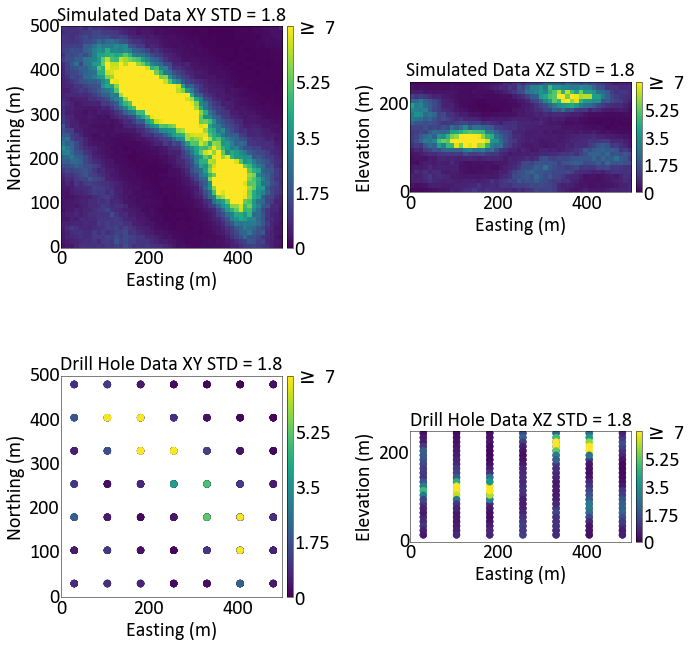

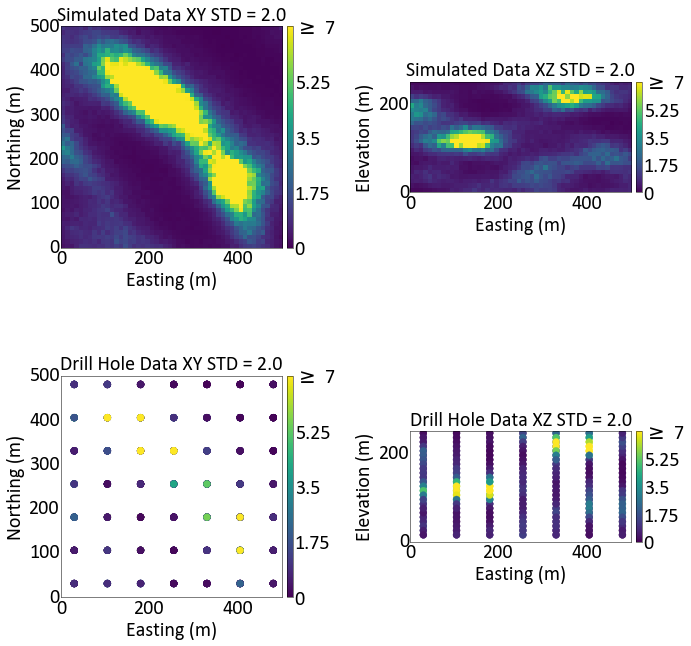

In [101]:
vlim = (0,7)
gs.set_style('pt20')

for fold in range (1,11):
    f, axes = plt.subplots(2, 2, figsize=(10, 10)) 
    dataflpoints = gs.DataFile(flname='dhs_{}.out'.format(fold), x='X',y='Y',z='Z', griddef = griddef,
                           readfl=True)
    sgsimfl = gs.DataFile('logn/addcoord_{}.out'.format(fold),griddef=griddef)
    std = (0.2 + (fold-1)*0.2)
    std = float("{0:.1f}".format(std))
    gs.pixelplt(sgsimfl,var='value',sliceno= 20, ax = axes[0,0],title = ('Simulated Data XY STD = {}').format(std),vlim=vlim)
    gs.pixelplt(sgsimfl,var='value',orient='xz',sliceno= 20, ax = axes[0,1],title = ('Simulated Data XZ STD = {}').format(std),vlim=vlim)
    gs.locmap(dataflpoints,var = 'value',orient='xy', ax = axes[1,0],sliceno= 15,title = ('Drill Hole Data XY STD = {}').format(std),vlim=vlim)
    gs.locmap(dataflpoints,var = 'value',orient='xz', ax = axes[1,1],sliceno= 15,title = ('Drill Hole Data XZ STD = {}').format(std),vlim=vlim)

    plt.tight_layout()
    plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Data_Drill_{}_{}.png'.format(fold,plt_extent),vlim=vlim)


In [27]:
if 'session' in locals() and session is not None:
    print('Close interactive session')
    session.close()
    tf.InteractiveSession.close(sess)
    sess.close()

0.6436
1.8154
1
Working on Node 20 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp4csebr8h', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020496316C50>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
Instructions for updating:
Queue-based input pipelines have 

Epoch: 800/5000 err = 0.008841282594949007
Cost_test : 0.008904086
R^2:0.6293974757194519
Epoch: 900/5000 err = 0.008602563198655844
Cost_test : 0.008123718
R^2:0.6442432284355164
Epoch: 1000/5000 err = 0.0076574629172682755
Cost_test : 0.007215843
R^2:0.6686649084091186
Epoch: 1100/5000 err = 0.005852871015667916
Cost_test : 0.006674633
R^2:0.7732783079147338
Epoch: 1200/5000 err = 0.006141990702599287
Cost_test : 0.0064194323
R^2:0.742662525177002
Epoch: 1300/5000 err = 0.0067909713834524155
Cost_test : 0.0062283496
R^2:0.7455374479293823
Epoch: 1400/5000 err = 0.004995430260896683
Cost_test : 0.0059448276
R^2:0.7943991899490356
Epoch: 1500/5000 err = 0.004924657288938761
Cost_test : 0.0055701574
R^2:0.7988801836967468
Epoch: 1600/5000 err = 0.004432362411171198
Cost_test : 0.005239593
R^2:0.8175927996635437
Epoch: 1700/5000 err = 0.0037584619596600535
Cost_test : 0.0053259465
R^2:0.8492993831634522
Epoch: 1800/5000 err = 0.003484101127833128
Cost_test : 0.0046614264
R^2:0.8660962820

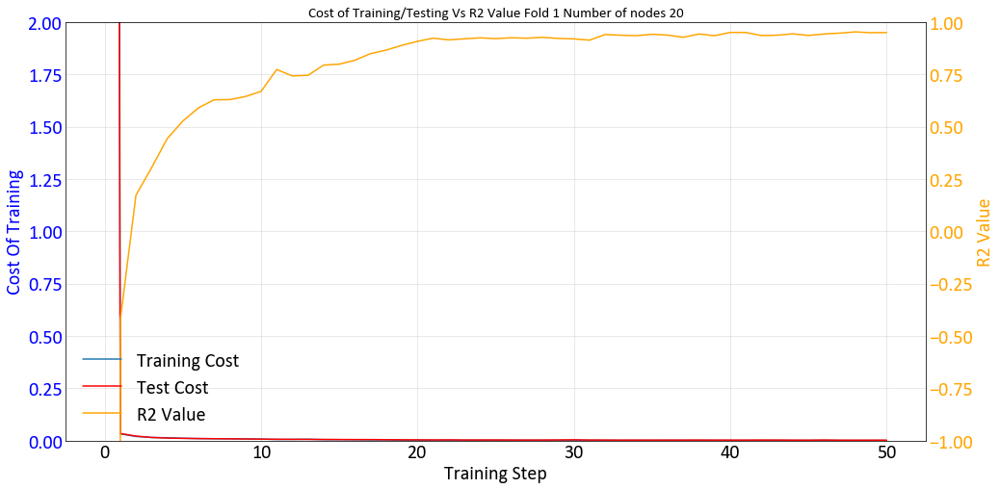

Working on Node 25 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp136ls7os', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205032C7C88>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.00469923997297883
Cost_test : 0.006483549
R^2:0.7931347250938416
Epoch: 1200/5000 err = 0.004797559371218085
Cost_test : 0.0061235176
R^2:0.7935532569885253
Epoch: 1300/5000 err = 0.004546778881922365
Cost_test : 0.0058560898
R^2:0.8185622096061705
Epoch: 1400/5000 err = 0.0034096837509423493
Cost_test : 0.005685081
R^2:0.8561386346817018
Epoch: 1500/5000 err = 0.003272987296804786
Cost_test : 0.0056423983
R^2:0.8442630767822266
Epoch: 1600/5000 err = 0.0034611549228429793
Cost_test : 0.005137264
R^2:0.8622333288192748
Epoch: 1700/5000 err = 0.0026043211109936237
Cost_test : 0.0047194418
R^2:0.8991607189178468
Epoch: 1800/5000 err = 0.002551682945340872
Cost_test : 0.003980075
R^2:0.8973737478256225
Epoch: 1900/5000 err = 0.0023429042892530562
Cost_test : 0.004335715
R^2:0.9035827398300171
Epoch: 2000/5000 err = 0.0019870276562869546
Cost_test : 0.00355698
R^2:0.9200208187103271
Epoch: 2100/5000 err = 0.001891983160749078
Cost_test : 0.0034095598
R^2:0.92396712

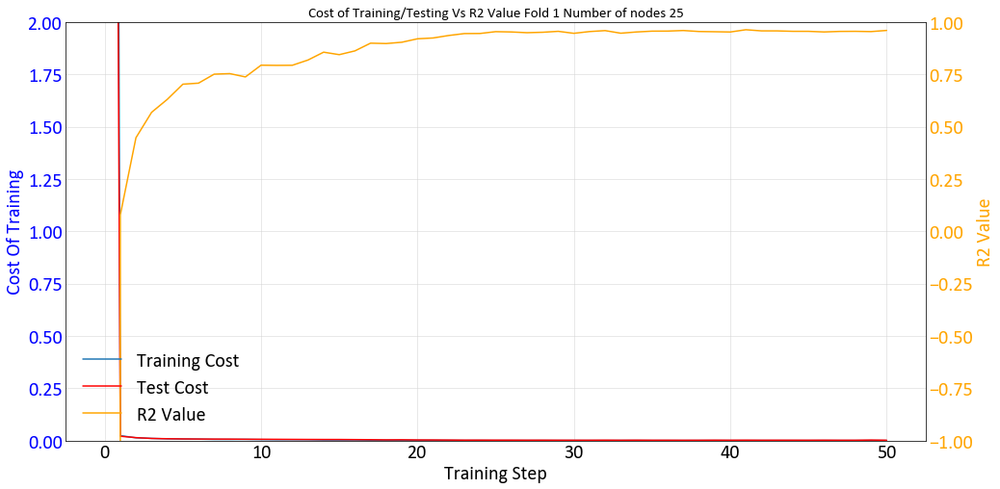

Working on Node 30 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpb7koo0wo', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050E0A9F98>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

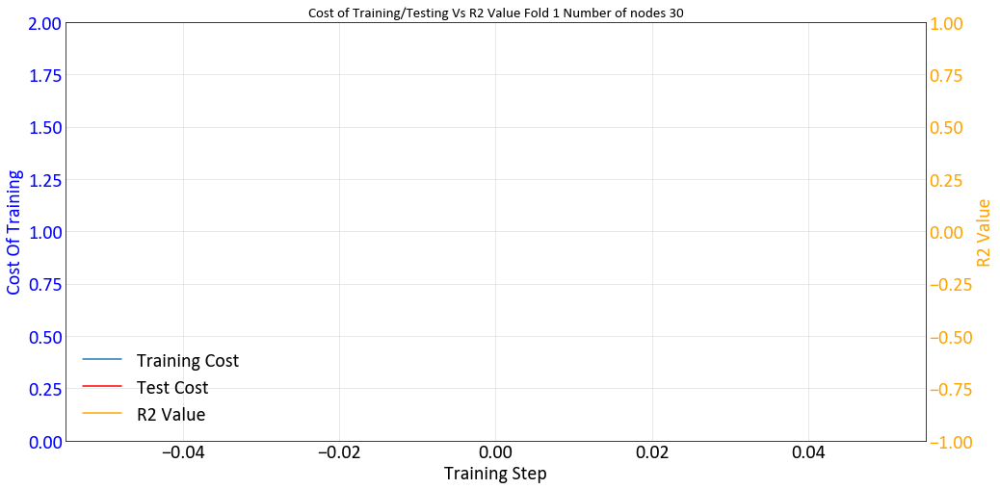

Working on Node 35 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp_lhxtj5y', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050E2139E8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.005896047409623861
Cost_test : 0.007089067
R^2:0.7453021287918091
Epoch: 1200/5000 err = 0.005295121669769287
Cost_test : 0.006883065
R^2:0.7842941284179688
Epoch: 1300/5000 err = 0.004507430363446474
Cost_test : 0.006636471
R^2:0.8172113060951234
Epoch: 1400/5000 err = 0.004157927259802819
Cost_test : 0.006321674
R^2:0.8233270049095154
Epoch: 1500/5000 err = 0.0037504523992538453
Cost_test : 0.005702452
R^2:0.8276958703994751
Epoch: 1600/5000 err = 0.003396288305521011
Cost_test : 0.00512898
R^2:0.8660902976989746
Epoch: 1700/5000 err = 0.0030221918132156134
Cost_test : 0.004836028
R^2:0.8738219141960143
Epoch: 1800/5000 err = 0.002541117649525404
Cost_test : 0.004312148
R^2:0.9091062664985655
Epoch: 1900/5000 err = 0.0022499158047139646
Cost_test : 0.0038009903
R^2:0.8951050400733948
Epoch: 2000/5000 err = 0.0019531002966687084
Cost_test : 0.003439834
R^2:0.9234775424003602
Epoch: 2100/5000 err = 0.0016388646792620419
Cost_test : 0.003725776
R^2:0.93436806201

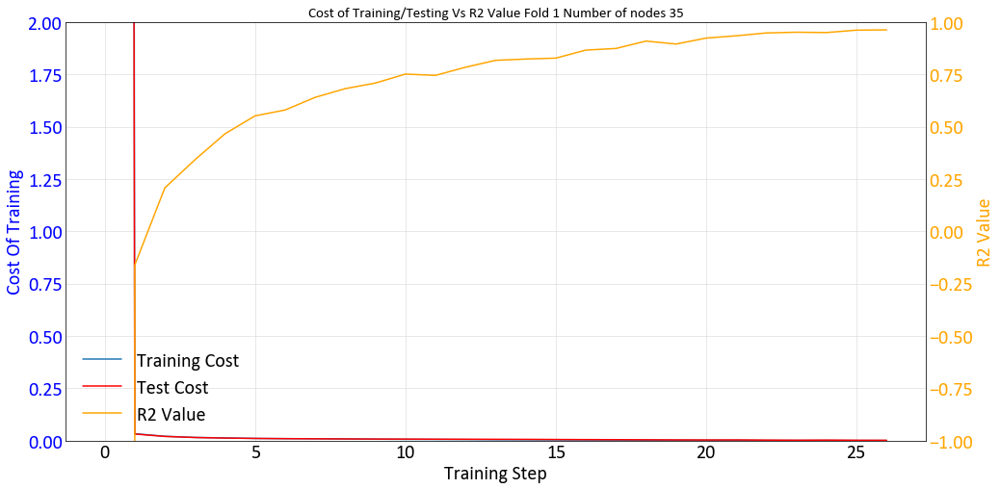

Working on Node 50 fold 1 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpy9q_mhbk', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020512186208>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0025894640479236838
Cost_test : 0.0045766984
R^2:0.8939162850379945
Epoch: 1200/5000 err = 0.0021775375818833707
Cost_test : 0.0044694664
R^2:0.9079487800598145
Epoch: 1300/5000 err = 0.0020516481949016453
Cost_test : 0.003454898
R^2:0.9223613262176513
Epoch: 1400/5000 err = 0.0015514877391979097
Cost_test : 0.0031194878
R^2:0.941766333580017
Epoch: 1500/5000 err = 0.0012831013184040783
Cost_test : 0.0029503885
R^2:0.948431348800659
Epoch: 1600/5000 err = 0.001152004231698811
Cost_test : 0.002681229
R^2:0.9560117721557617
Epoch: 1700/5000 err = 0.001163769676350057
Cost_test : 0.0029901585
R^2:0.9521384358406066
Epoch: 1800/5000 err = 0.0009499361971393228
Cost_test : 0.002604718
R^2:0.9620814204216004
Epoch: 1900/5000 err = 0.0009448969271034001
Cost_test : 0.0025026323
R^2:0.9596068024635316
Epoch: 2000/5000 err = 0.0009636873030103744
Cost_test : 0.0027001677
R^2:0.9634767174720764
End of learning process
Final epoch = 2039/5000 
Final error = 0.000810770085

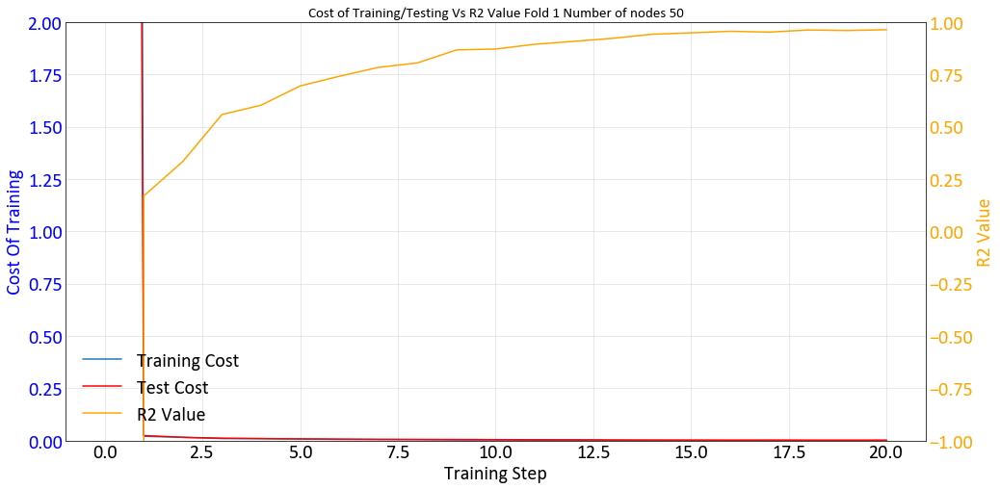

0.4093
3.0771
2
Working on Node 20 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp6e1dx958', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020514A2FAC8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calli

Epoch: 1100/5000 err = 0.00617531593888998
Cost_test : 0.007658207
R^2:0.7288107633590698
Epoch: 1200/5000 err = 0.005506602581590414
Cost_test : 0.007300466
R^2:0.7385744571685791
Epoch: 1300/5000 err = 0.005267271678894758
Cost_test : 0.0067481305
R^2:0.7491578817367555
Epoch: 1400/5000 err = 0.004805771168321371
Cost_test : 0.0063281907
R^2:0.7888012409210204
Epoch: 1500/5000 err = 0.003898483933880925
Cost_test : 0.006144888
R^2:0.7987999081611633
Epoch: 1600/5000 err = 0.003131654066964984
Cost_test : 0.005694073
R^2:0.8396975755691528
Epoch: 1700/5000 err = 0.002889301301911473
Cost_test : 0.0050616344
R^2:0.8715504169464111
Epoch: 1800/5000 err = 0.002471901848912239
Cost_test : 0.0047682878
R^2:0.8760320544242859
Epoch: 1900/5000 err = 0.0022436651866883043
Cost_test : 0.004424269
R^2:0.8921719431877138
Epoch: 2000/5000 err = 0.002123337518423796
Cost_test : 0.004205304
R^2:0.9024567961692809
Epoch: 2100/5000 err = 0.0020449711475521324
Cost_test : 0.0037154227
R^2:0.9132613778

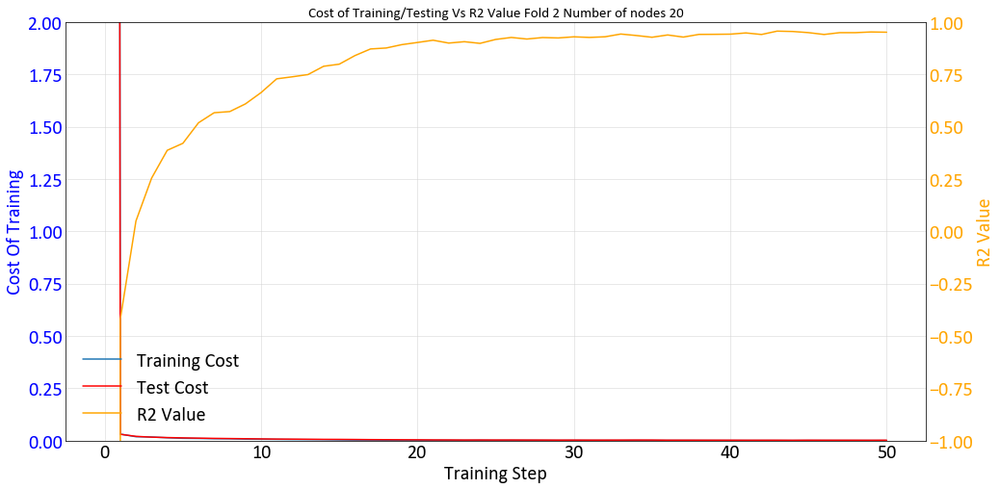

Working on Node 25 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpwx7qzo4h', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050D03B438>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.005572926066815853
Cost_test : 0.006763969
R^2:0.7357347130775451
Epoch: 1200/5000 err = 0.0046145936474204065
Cost_test : 0.006367124
R^2:0.7645310759544374
Epoch: 1300/5000 err = 0.003804106544703245
Cost_test : 0.005567366
R^2:0.7985890984535218
Epoch: 1400/5000 err = 0.0033822054509073498
Cost_test : 0.005119264
R^2:0.8201567053794862
Epoch: 1500/5000 err = 0.002997798472642898
Cost_test : 0.0049956567
R^2:0.8443079352378845
Epoch: 1600/5000 err = 0.0029193822760134936
Cost_test : 0.004668957
R^2:0.855485165119171
Epoch: 1700/5000 err = 0.0025978568941354752
Cost_test : 0.0044313236
R^2:0.8769397497177123
Epoch: 1800/5000 err = 0.0022208591923117637
Cost_test : 0.0042468547
R^2:0.8879081606864929
Epoch: 1900/5000 err = 0.0019148894818499685
Cost_test : 0.0037454576
R^2:0.9026793718338012
Epoch: 2000/5000 err = 0.0017291099298745393
Cost_test : 0.0036031816
R^2:0.9210193991661071
Epoch: 2100/5000 err = 0.0016327815828844905
Cost_test : 0.0033829235
R^2:0.922

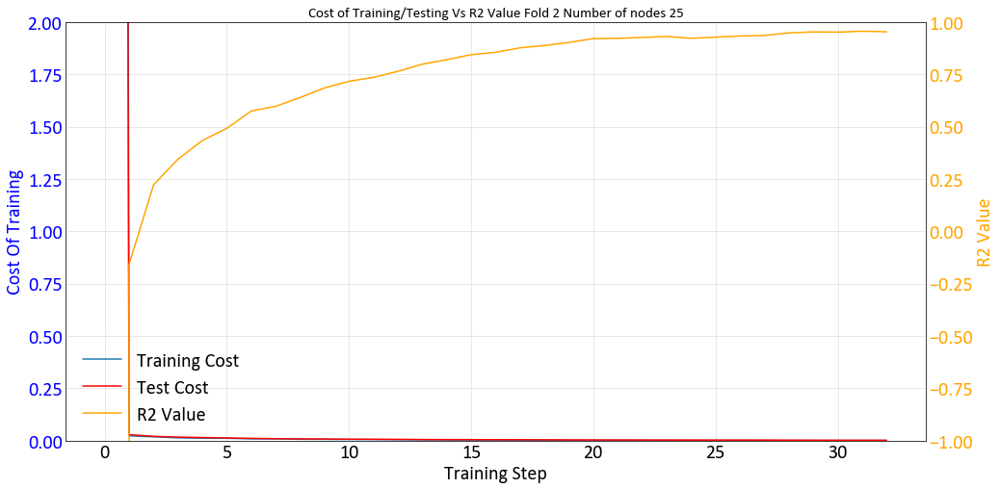

Working on Node 30 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp19rfxv9v', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049D2E8D68>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0056917078793048866
Cost_test : 0.0071866396
R^2:0.7498204469680787
Epoch: 1200/5000 err = 0.004170340532436967
Cost_test : 0.006948431
R^2:0.7727231025695801
Epoch: 1300/5000 err = 0.004578588530421257
Cost_test : 0.006066008
R^2:0.8269673228263855
Epoch: 1400/5000 err = 0.003326947055757046
Cost_test : 0.005463767
R^2:0.8261143326759339
Epoch: 1500/5000 err = 0.002977607073262334
Cost_test : 0.005367328
R^2:0.8419891834259035
Epoch: 1600/5000 err = 0.0024433359503746033
Cost_test : 0.004771832
R^2:0.8733098983764649
Epoch: 1700/5000 err = 0.0026635601650923492
Cost_test : 0.004660051
R^2:0.8801231741905212
Epoch: 1800/5000 err = 0.002277627377770841
Cost_test : 0.004393612
R^2:0.8959835052490235
Epoch: 1900/5000 err = 0.0017589751165360211
Cost_test : 0.004489306
R^2:0.9085664868354797
Epoch: 2000/5000 err = 0.0016650362638756635
Cost_test : 0.0036072817
R^2:0.9124849200248719
Epoch: 2100/5000 err = 0.0015610943315550686
Cost_test : 0.003793717
R^2:0.92522488

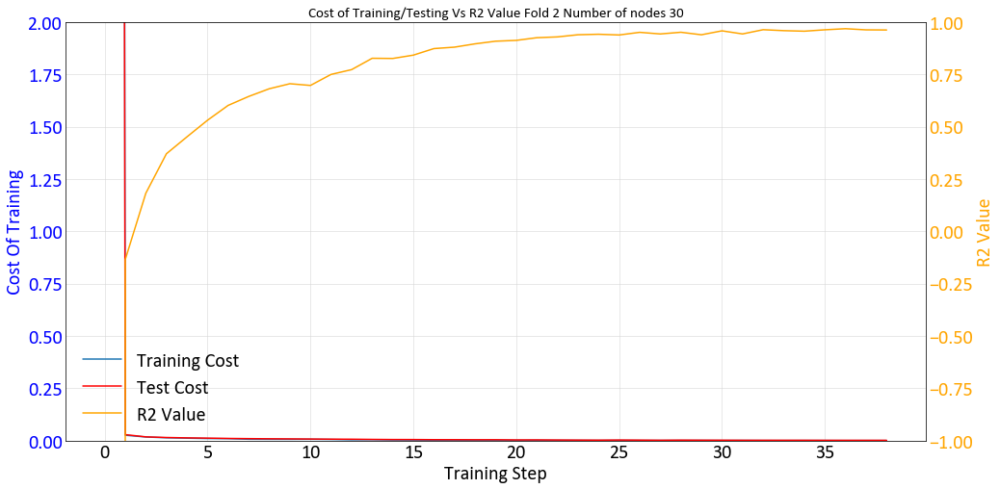

Working on Node 35 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp95kkaxys', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000204EF279588>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004326103534549475
Cost_test : 0.0061543467
R^2:0.8246317744255066
Epoch: 1200/5000 err = 0.003116685384884477
Cost_test : 0.005605557
R^2:0.8431297779083253
Epoch: 1300/5000 err = 0.0029863061383366583
Cost_test : 0.0049404255
R^2:0.8619178771972656
Epoch: 1400/5000 err = 0.0023250562138855454
Cost_test : 0.004499542
R^2:0.886244821548462
Epoch: 1500/5000 err = 0.001966664055362344
Cost_test : 0.00382503
R^2:0.9093090534210206
Epoch: 1600/5000 err = 0.0016170225339010359
Cost_test : 0.003705643
R^2:0.922214686870575
Epoch: 1700/5000 err = 0.0013931791065260768
Cost_test : 0.0033122846
R^2:0.932889986038208
Epoch: 1800/5000 err = 0.0012392797274515031
Cost_test : 0.0031844438
R^2:0.9401016235351562
Epoch: 1900/5000 err = 0.00120008063968271
Cost_test : 0.0029380221
R^2:0.9375740170478821
Epoch: 2000/5000 err = 0.0010384788271039726
Cost_test : 0.0026038943
R^2:0.9478655934333802
Epoch: 2100/5000 err = 0.0013015292119234801
Cost_test : 0.002712104
R^2:0.93796794

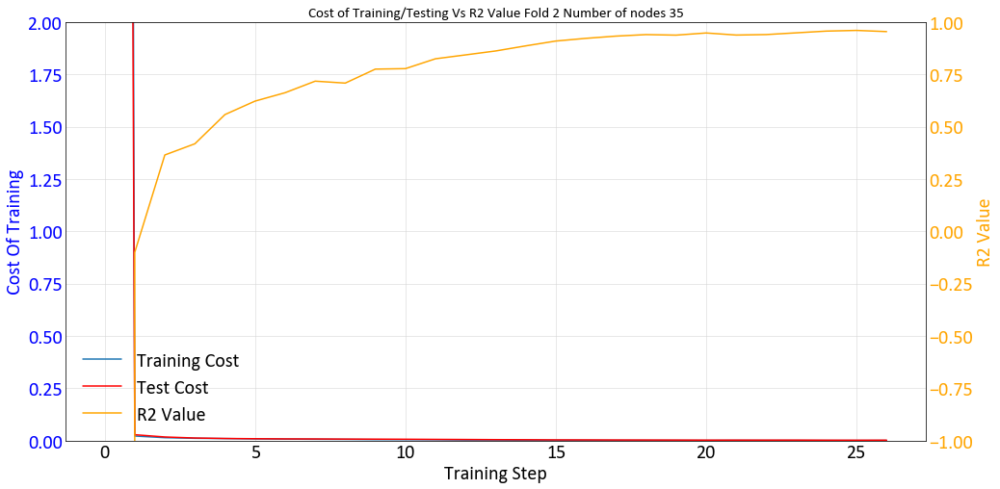

Working on Node 50 fold 2 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpbxm5oolc', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002051204B9B0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0032101551070809363
Cost_test : 0.0058794427
R^2:0.8411765813827514
Epoch: 1200/5000 err = 0.0028206420131027697
Cost_test : 0.0053155073
R^2:0.8726294636726379
Epoch: 1300/5000 err = 0.0025561303831636902
Cost_test : 0.0049927756
R^2:0.8834124922752381
Epoch: 1400/5000 err = 0.0019222555449232462
Cost_test : 0.00446708
R^2:0.9092441916465759
Epoch: 1500/5000 err = 0.0017255035229027274
Cost_test : 0.0041740877
R^2:0.9210019469261169
Epoch: 1600/5000 err = 0.0014961877372115851
Cost_test : 0.003865149
R^2:0.9307005167007446
Epoch: 1700/5000 err = 0.0011755125597119331
Cost_test : 0.0032267086
R^2:0.935379147529602
Epoch: 1800/5000 err = 0.0010242605931125581
Cost_test : 0.0028809512
R^2:0.9494957208633423
Epoch: 1900/5000 err = 0.0009232179261744022
Cost_test : 0.002578484
R^2:0.9502109885215759
Epoch: 2000/5000 err = 0.000747657660394907
Cost_test : 0.0023150737
R^2:0.960956585407257
Epoch: 2100/5000 err = 0.0008492692140862346
Cost_test : 0.0025743206
R^2:0.9

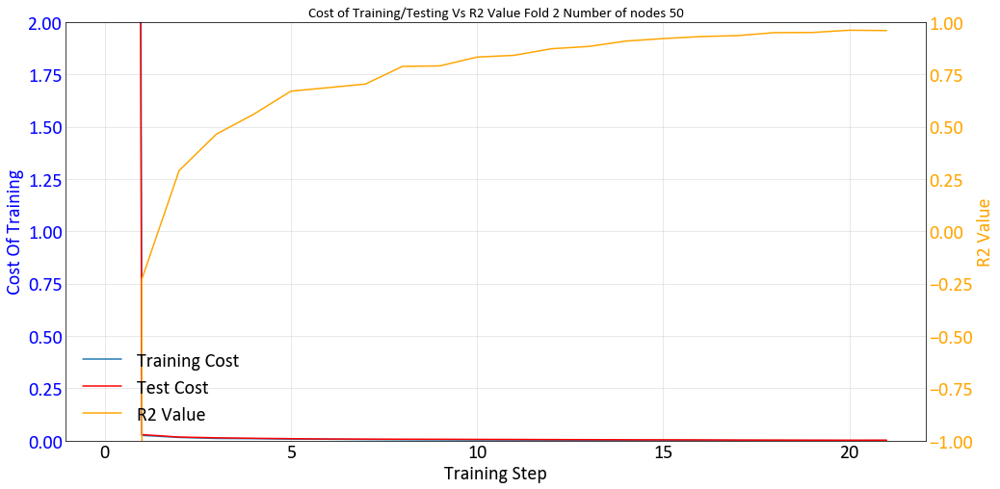

0.2637
4.8108
3
Working on Node 20 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpm19n2qpq', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000204EF6AFB00>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calli

Epoch: 1100/5000 err = 0.004879793711006641
Cost_test : 0.0076560373
R^2:0.6447432875633241
Epoch: 1200/5000 err = 0.004542800132185221
Cost_test : 0.007521986
R^2:0.6632673144340515
Epoch: 1300/5000 err = 0.004567351285368204
Cost_test : 0.006795601
R^2:0.7292836904525757
Epoch: 1400/5000 err = 0.004508388508111238
Cost_test : 0.007036086
R^2:0.7096691846847534
Epoch: 1500/5000 err = 0.00435618944466114
Cost_test : 0.006780928
R^2:0.7591481685638428
Epoch: 1600/5000 err = 0.004209268698468805
Cost_test : 0.0062189405
R^2:0.7688456296920776
Epoch: 1700/5000 err = 0.003556881565600633
Cost_test : 0.006227096
R^2:0.7779534220695496
Epoch: 1800/5000 err = 0.003039390686899423
Cost_test : 0.005378809
R^2:0.8004055380821228
Epoch: 1900/5000 err = 0.002993722818791866
Cost_test : 0.0044527133
R^2:0.8279160976409913
Epoch: 2000/5000 err = 0.0019687145249918103
Cost_test : 0.0039477996
R^2:0.8683115363121032
Epoch: 2100/5000 err = 0.001987600000575185
Cost_test : 0.0032110873
R^2:0.87069271802

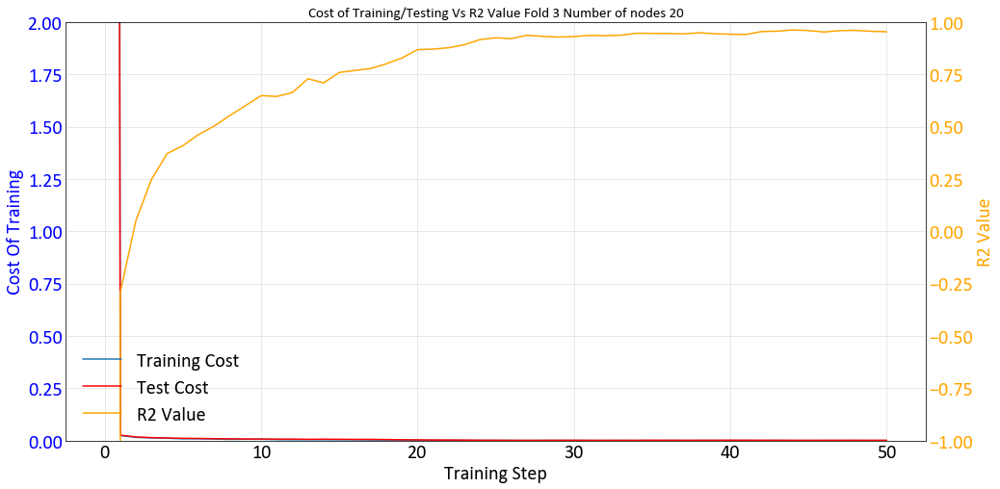

Working on Node 25 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpieto0pd8', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050CB38DA0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004562205541878939
Cost_test : 0.005979328
R^2:0.7475133419036866
Epoch: 1200/5000 err = 0.004075381904840469
Cost_test : 0.005656388
R^2:0.7751678824424744
Epoch: 1300/5000 err = 0.003361287107691169
Cost_test : 0.00527779
R^2:0.7972482681274414
Epoch: 1400/5000 err = 0.0026108349673449995
Cost_test : 0.005296962
R^2:0.8383219718933105
Epoch: 1500/5000 err = 0.002550322562456131
Cost_test : 0.004751082
R^2:0.8334780573844909
Epoch: 1600/5000 err = 0.0024469569325447083
Cost_test : 0.004502512
R^2:0.8718002796173095
Epoch: 1700/5000 err = 0.0021979654906317593
Cost_test : 0.004588961
R^2:0.8738373994827271
Epoch: 1800/5000 err = 0.0019191335886716845
Cost_test : 0.0040209
R^2:0.887905764579773
Epoch: 1900/5000 err = 0.001794581231661141
Cost_test : 0.0038448002
R^2:0.9051256060600281
Epoch: 2000/5000 err = 0.0018217694014310837
Cost_test : 0.0031141846
R^2:0.8987700700759886
Epoch: 2100/5000 err = 0.001446830341592431
Cost_test : 0.002930838
R^2:0.9171241998672

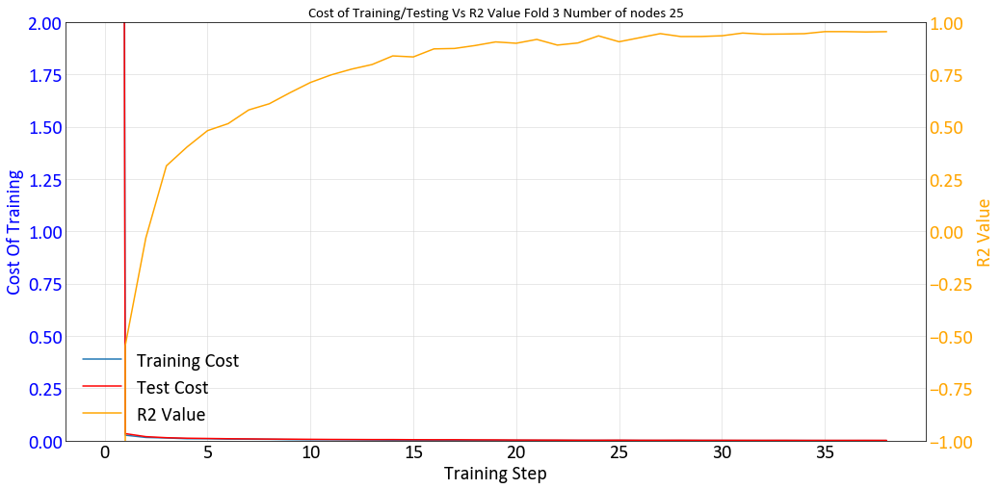

Working on Node 30 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp63lbkjis', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050D1257F0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004506836086511612
Cost_test : 0.006210602
R^2:0.7367574453353882
Epoch: 1200/5000 err = 0.0037128494121134283
Cost_test : 0.005875351
R^2:0.7521308898925781
Epoch: 1300/5000 err = 0.0032603496219962835
Cost_test : 0.0053383205
R^2:0.7831622004508971
Epoch: 1400/5000 err = 0.003398652235046029
Cost_test : 0.0048863585
R^2:0.7946513295173645
Epoch: 1500/5000 err = 0.0028569546062499284
Cost_test : 0.004262207
R^2:0.8386903882026673
Epoch: 1600/5000 err = 0.0025334048084914686
Cost_test : 0.004198653
R^2:0.8533762693405151
Epoch: 1700/5000 err = 0.002015671553090215
Cost_test : 0.0040154234
R^2:0.8722819089889526
Epoch: 1800/5000 err = 0.001777403778396547
Cost_test : 0.0034399163
R^2:0.8712594270706177
Epoch: 1900/5000 err = 0.0018513929564505816
Cost_test : 0.0036591769
R^2:0.9048974514007568
Epoch: 2000/5000 err = 0.0018409377429634334
Cost_test : 0.003650363
R^2:0.9083856344223022
Epoch: 2100/5000 err = 0.001491555105894804
Cost_test : 0.0038201106
R^2:0.9199

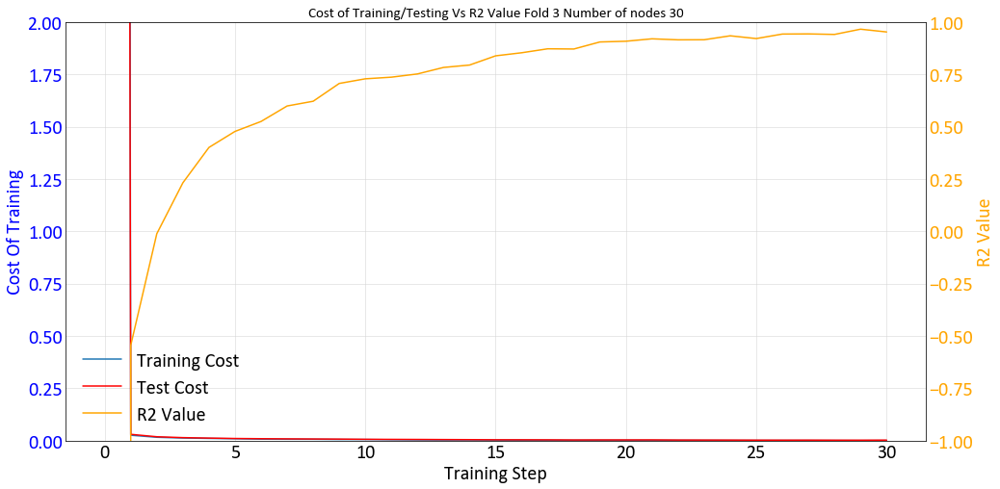

Working on Node 35 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpbnoorj7q', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049BD56748>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0020645017037168147
Cost_test : 0.0050934777
R^2:0.8504444360733032
Epoch: 1200/5000 err = 0.002223090431652963
Cost_test : 0.0052705803
R^2:0.8613184094429017
Epoch: 1300/5000 err = 0.0020223054336383937
Cost_test : 0.0047929827
R^2:0.8859632611274719
Epoch: 1400/5000 err = 0.0019475432112812995
Cost_test : 0.0046048476
R^2:0.8902711629867553
Epoch: 1500/5000 err = 0.001576952124014497
Cost_test : 0.0045701596
R^2:0.9099273920059203
Epoch: 1600/5000 err = 0.001266742672305554
Cost_test : 0.003992254
R^2:0.9191368103027344
Epoch: 1700/5000 err = 0.0011419696151278914
Cost_test : 0.0034214475
R^2:0.9314820766448976
Epoch: 1800/5000 err = 0.0014839445939287543
Cost_test : 0.003870575
R^2:0.8955102086067199
Epoch: 1900/5000 err = 0.0010149789159186184
Cost_test : 0.0027271514
R^2:0.9396201968193054
Epoch: 2000/5000 err = 0.000970136420801282
Cost_test : 0.0025019553
R^2:0.9396089315414429
Epoch: 2100/5000 err = 0.0008896499173715711
Cost_test : 0.0021003566
R^2:0.

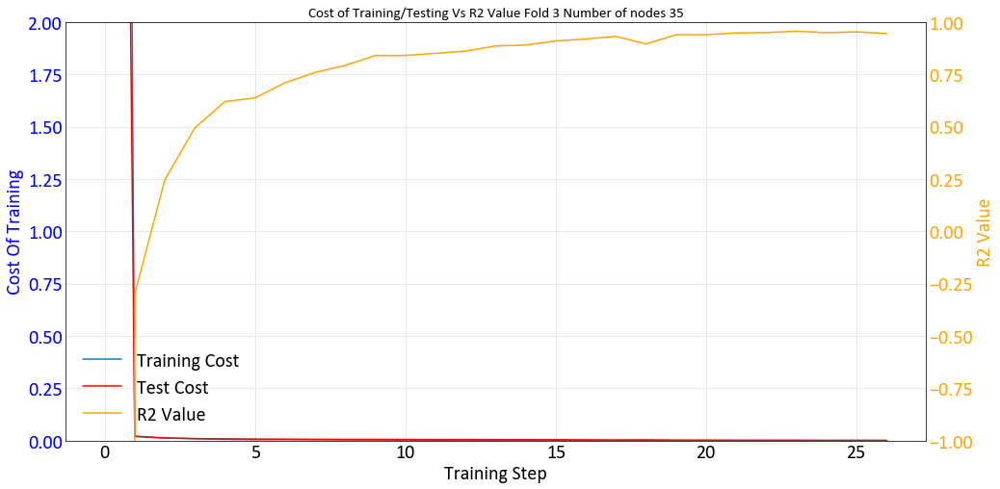

Working on Node 50 fold 3 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpt2kh4c92', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049BD2B3C8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.00396324866451323
Cost_test : 0.0064678653
R^2:0.7794269323348999
Epoch: 1200/5000 err = 0.004203243553638458
Cost_test : 0.0060751513
R^2:0.744282364845276
Epoch: 1300/5000 err = 0.0032011501025408506
Cost_test : 0.0059372177
R^2:0.746737265586853
Epoch: 1400/5000 err = 0.0033131048548966646
Cost_test : 0.005349893
R^2:0.7907856464385987
Epoch: 1500/5000 err = 0.0032059310935437678
Cost_test : 0.004657815
R^2:0.8310107469558716
Epoch: 1600/5000 err = 0.002736122952774167
Cost_test : 0.0039774794
R^2:0.8446182966232301
Epoch: 1700/5000 err = 0.0019594400422647596
Cost_test : 0.003791035
R^2:0.8675305128097535
Epoch: 1800/5000 err = 0.0015543475048616527
Cost_test : 0.0037566456
R^2:0.9032138109207153
Epoch: 1900/5000 err = 0.0012958828127011656
Cost_test : 0.0037150634
R^2:0.9129949331283569
Epoch: 2000/5000 err = 0.0012736157048493623
Cost_test : 0.003152092
R^2:0.9199855566024782
Epoch: 2100/5000 err = 0.0011303118313662707
Cost_test : 0.0024172217
R^2:0.9365

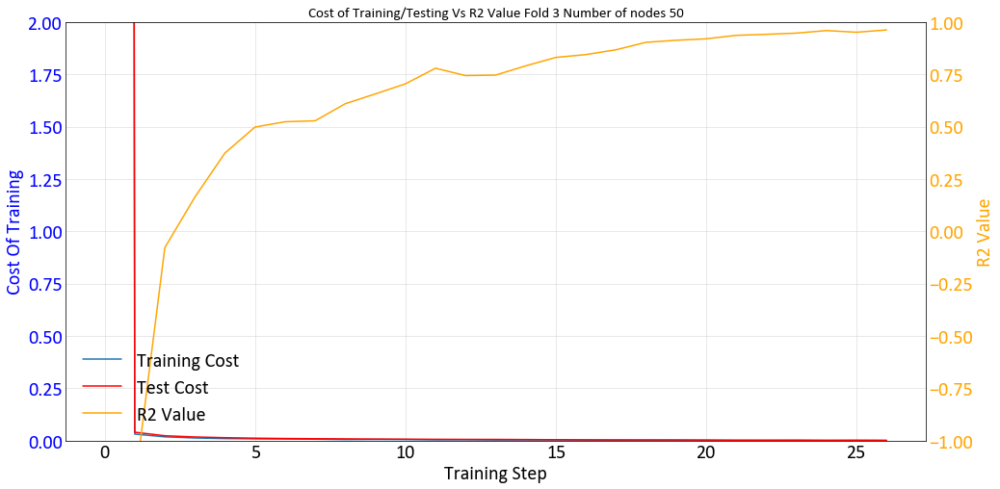

0.175
6.9598
4
Working on Node 20 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpjj1v24hh', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020512098550>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done callin

Epoch: 1100/5000 err = 0.0046137355268001555
Cost_test : 0.0048679668
R^2:0.6786552548408509
Epoch: 1200/5000 err = 0.00508665619418025
Cost_test : 0.004989048
R^2:0.6494219899177551
Epoch: 1300/5000 err = 0.004445013916119933
Cost_test : 0.0051380745
R^2:0.7163109064102173
Epoch: 1400/5000 err = 0.0041538899764418605
Cost_test : 0.0047616754
R^2:0.7020013213157654
Epoch: 1500/5000 err = 0.003975042141973972
Cost_test : 0.004899419
R^2:0.7328051090240479
Epoch: 1600/5000 err = 0.0037238599732518194
Cost_test : 0.0051020547
R^2:0.7463742613792419
Epoch: 1700/5000 err = 0.0038944072555750606
Cost_test : 0.004843144
R^2:0.746514868736267
Epoch: 1800/5000 err = 0.0033224154729396107
Cost_test : 0.004569962
R^2:0.7406869649887085
Epoch: 1900/5000 err = 0.003478077985346317
Cost_test : 0.0045067365
R^2:0.776032555103302
Epoch: 2000/5000 err = 0.003066198015585542
Cost_test : 0.00415383
R^2:0.8152063727378847
Epoch: 2100/5000 err = 0.0027998099569231274
Cost_test : 0.003562378
R^2:0.836396491

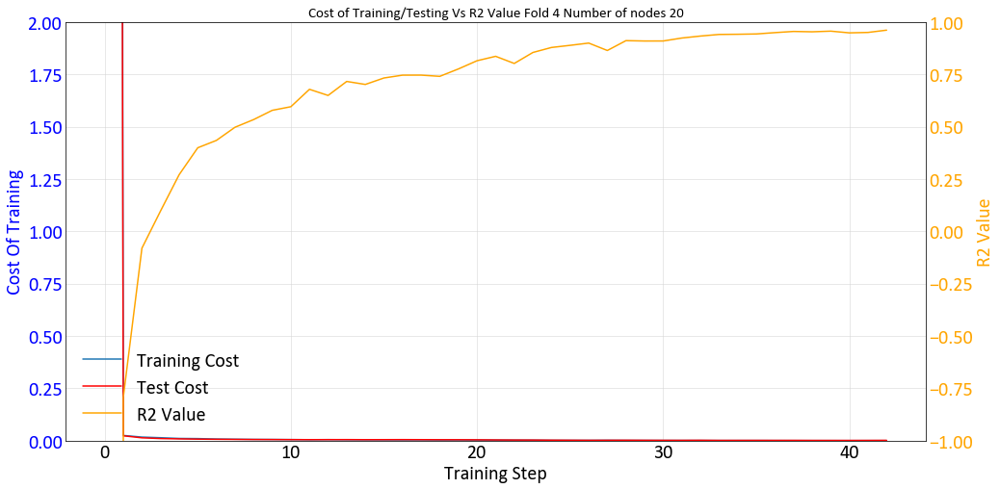

Working on Node 25 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpfqkz3gnn', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050CD20208>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.005145482160151005
Cost_test : 0.0047614085
R^2:0.6784681558609009
Epoch: 1200/5000 err = 0.004260049527511001
Cost_test : 0.004671036
R^2:0.7337176084518432
Epoch: 1300/5000 err = 0.0036970247980207204
Cost_test : 0.0045719845
R^2:0.7613691926002502
Epoch: 1400/5000 err = 0.0032816937193274496
Cost_test : 0.004376236
R^2:0.7380622148513795
Epoch: 1500/5000 err = 0.0031977260950952764
Cost_test : 0.0043948772
R^2:0.7967709898948669
Epoch: 1600/5000 err = 0.0028987905476242303
Cost_test : 0.004308096
R^2:0.8196693658828736
Epoch: 1700/5000 err = 0.0025085358880460266
Cost_test : 0.003552829
R^2:0.8267310976982117
Epoch: 1800/5000 err = 0.002203969983384013
Cost_test : 0.0030799175
R^2:0.8669294595718384
Epoch: 1900/5000 err = 0.0015979908173903822
Cost_test : 0.0027110786
R^2:0.8743834257125855
Epoch: 2000/5000 err = 0.0013400392374023796
Cost_test : 0.0024406135
R^2:0.9010125637054444
Epoch: 2100/5000 err = 0.0013454385567456483
Cost_test : 0.0022215764
R^2:0.9

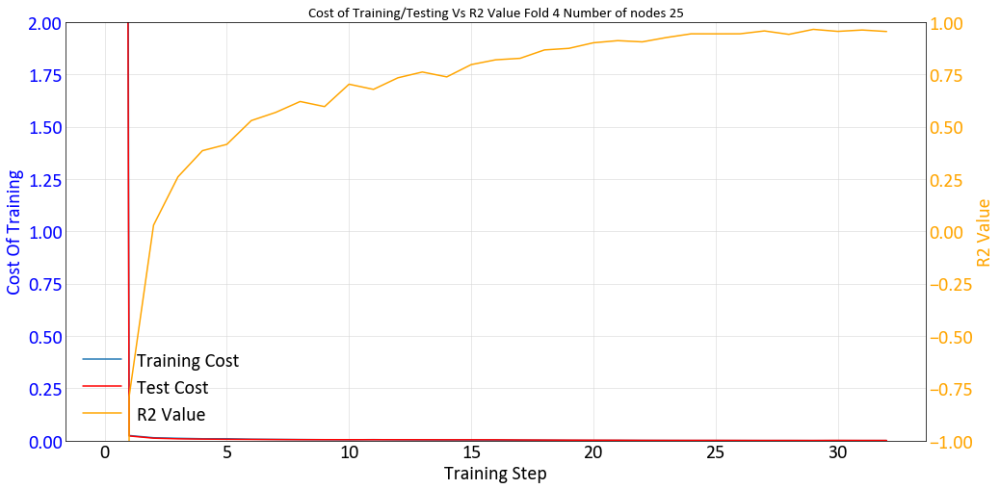

Working on Node 30 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpfizmq5ta', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020512132C50>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.003216752177104354
Cost_test : 0.0047257557
R^2:0.7797852635383606
Epoch: 1200/5000 err = 0.0029362503439188
Cost_test : 0.003814157
R^2:0.8170459747314454
Epoch: 1300/5000 err = 0.0023917851271107794
Cost_test : 0.0034268822
R^2:0.8429712295532227
Epoch: 1400/5000 err = 0.00227546701207757
Cost_test : 0.0033025616
R^2:0.8630621790885926
Epoch: 1500/5000 err = 0.001714008883573115
Cost_test : 0.0027029496
R^2:0.8640337944030761
Epoch: 1600/5000 err = 0.001418686052784324
Cost_test : 0.0026775915
R^2:0.9056187272071838
Epoch: 1700/5000 err = 0.0011332175112329424
Cost_test : 0.0018486108
R^2:0.9210088729858399
Epoch: 1800/5000 err = 0.001098620833363384
Cost_test : 0.0018188442
R^2:0.9242016077041626
Epoch: 1900/5000 err = 0.0009677403373643755
Cost_test : 0.0017446283
R^2:0.9350913763046265
Epoch: 2000/5000 err = 0.0007705729338340461
Cost_test : 0.0015483616
R^2:0.9351221799850462
Epoch: 2100/5000 err = 0.0009229935240000486
Cost_test : 0.0019346878
R^2:0.9403

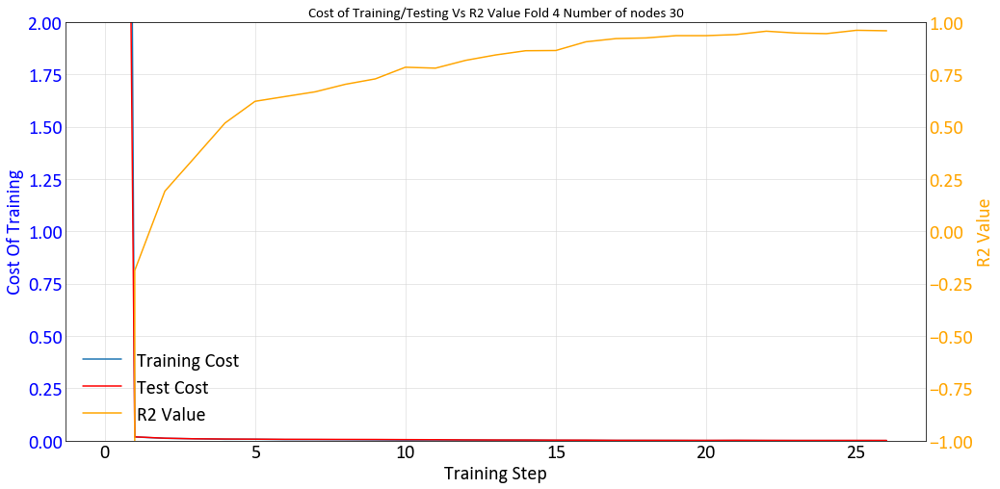

Working on Node 35 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp6nuzv4__', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020502137E10>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0041652293875813476
Cost_test : 0.0052048503
R^2:0.7150020480155945
Epoch: 1200/5000 err = 0.003490353981032968
Cost_test : 0.0047327876
R^2:0.7600930213928222
Epoch: 1300/5000 err = 0.003930739779025316
Cost_test : 0.0050602495
R^2:0.7330726385116577
Epoch: 1400/5000 err = 0.0031085428316146137
Cost_test : 0.0050231027
R^2:0.783628499507904
Epoch: 1500/5000 err = 0.002717420319095254
Cost_test : 0.0046697604
R^2:0.8196697115898132
Epoch: 1600/5000 err = 0.0023201404139399527
Cost_test : 0.004529408
R^2:0.8329648971557617
Epoch: 1700/5000 err = 0.0022321386961266397
Cost_test : 0.003716093
R^2:0.8705223798751831
Epoch: 1800/5000 err = 0.0016066135140135884
Cost_test : 0.0028038973
R^2:0.8940088868141175
Epoch: 1900/5000 err = 0.0011625235434621572
Cost_test : 0.0021429355
R^2:0.9090641140937805
Epoch: 2000/5000 err = 0.0009811201947741211
Cost_test : 0.0020253272
R^2:0.9275609374046325
Epoch: 2100/5000 err = 0.0009240748244337737
Cost_test : 0.0017557062
R^2:0.

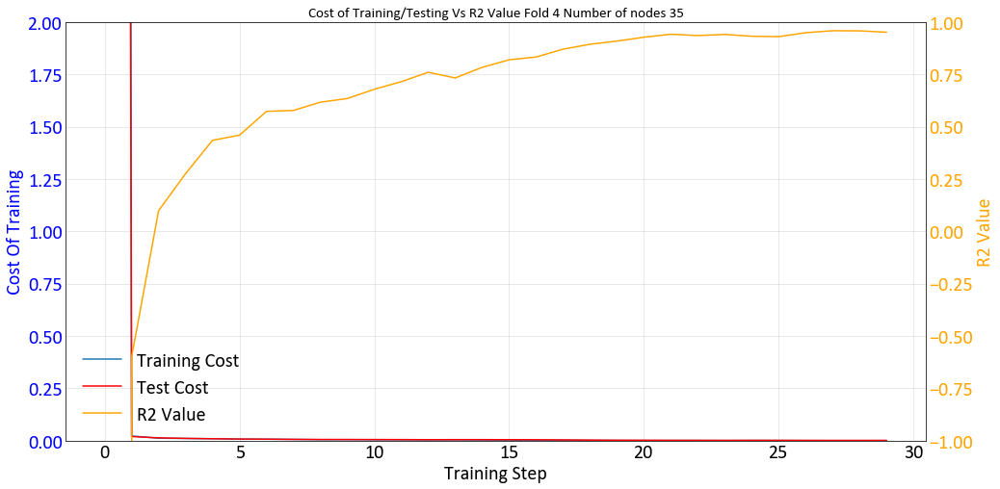

Working on Node 50 fold 4 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp_3g_vqa2', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050CF81B70>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0026319831144064666
Cost_test : 0.003958072
R^2:0.8143251061439514
Epoch: 1200/5000 err = 0.0018328045029193164
Cost_test : 0.0037053372
R^2:0.8648078799247741
Epoch: 1300/5000 err = 0.001880758232437074
Cost_test : 0.003293443
R^2:0.889633846282959
Epoch: 1400/5000 err = 0.0018071098951622842
Cost_test : 0.0028101443
R^2:0.893580174446106
Epoch: 1500/5000 err = 0.001458584261126816
Cost_test : 0.002623453
R^2:0.9099888324737548
Epoch: 1600/5000 err = 0.0011009168927557766
Cost_test : 0.002345068
R^2:0.9242520570755005
Epoch: 1700/5000 err = 0.0011120813200250269
Cost_test : 0.0022534363
R^2:0.9231957197189331
Epoch: 1800/5000 err = 0.0010904905386269093
Cost_test : 0.0019611102
R^2:0.9321364045143127
Epoch: 1900/5000 err = 0.0009808924631215632
Cost_test : 0.0017894077
R^2:0.934142029285431
Epoch: 2000/5000 err = 0.0007045787177048623
Cost_test : 0.0015943191
R^2:0.9556247115135192
Epoch: 2100/5000 err = 0.0006372834322974086
Cost_test : 0.0014594446
R^2:0.948

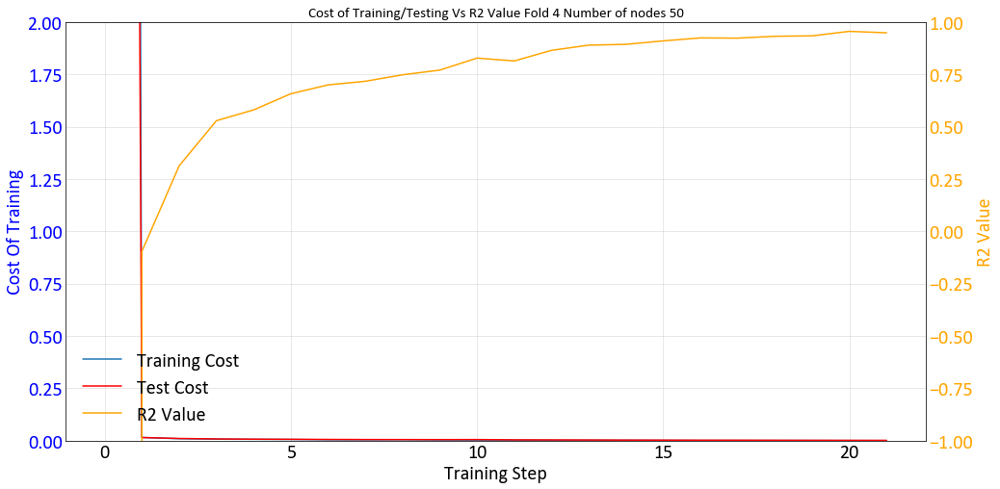

0.1204
9.4195
5
Working on Node 20 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpg86x8vdp', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049D588E80>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calli

Epoch: 1100/5000 err = 0.004392462596297265
Cost_test : 0.008249642
R^2:0.5847316145896911
Epoch: 1200/5000 err = 0.004759132955223322
Cost_test : 0.00798285
R^2:0.5802466154098511
Epoch: 1300/5000 err = 0.004250399814918637
Cost_test : 0.0073734242
R^2:0.5950756311416626
Epoch: 1400/5000 err = 0.004395432630553841
Cost_test : 0.007188588
R^2:0.6291738152503967
Epoch: 1500/5000 err = 0.004286746215075255
Cost_test : 0.0063946927
R^2:0.657837986946106
Epoch: 1600/5000 err = 0.003803407377563417
Cost_test : 0.006022632
R^2:0.660570478439331
Epoch: 1700/5000 err = 0.0023785245604813097
Cost_test : 0.005847283
R^2:0.7011223196983337
Epoch: 1800/5000 err = 0.003134204400703311
Cost_test : 0.005261639
R^2:0.7284418106079102
Epoch: 1900/5000 err = 0.0027587185613811016
Cost_test : 0.0046647144
R^2:0.7438264608383178
Epoch: 2000/5000 err = 0.002706962777301669
Cost_test : 0.0042310026
R^2:0.6961126923561097
Epoch: 2100/5000 err = 0.002339041535742581
Cost_test : 0.0041162246
R^2:0.788013577461

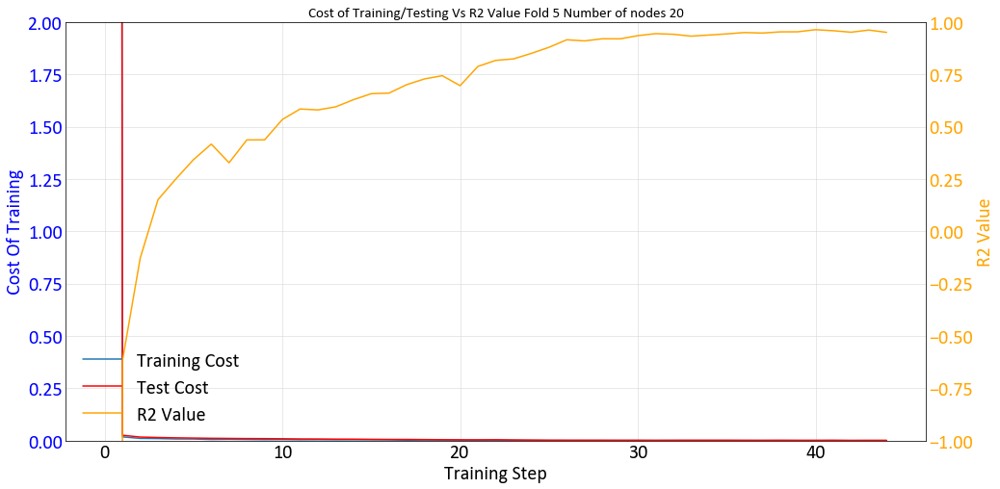

Working on Node 25 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp9cr68i_6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205121669B0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.003304258920252323
Cost_test : 0.006182474
R^2:0.6985428690910338
Epoch: 1200/5000 err = 0.0035425000358372924
Cost_test : 0.005675981
R^2:0.7324334144592285
Epoch: 1300/5000 err = 0.003045297972857952
Cost_test : 0.0051868972
R^2:0.737200927734375
Epoch: 1400/5000 err = 0.002632579626515508
Cost_test : 0.0052079684
R^2:0.7425100207328796
Epoch: 1500/5000 err = 0.002168818865902722
Cost_test : 0.0049836948
R^2:0.7969987869262696
Epoch: 1600/5000 err = 0.0017447824822738765
Cost_test : 0.004209665
R^2:0.8468947649002077
Epoch: 1700/5000 err = 0.0014352792641147971
Cost_test : 0.0037213415
R^2:0.861682116985321
Epoch: 1800/5000 err = 0.0013171902042813598
Cost_test : 0.0038937635
R^2:0.8754649877548217
Epoch: 1900/5000 err = 0.0012653976911678909
Cost_test : 0.0034718195
R^2:0.9015177369117736
Epoch: 2000/5000 err = 0.001266961696092039
Cost_test : 0.0034907723
R^2:0.8836257934570313
Epoch: 2100/5000 err = 0.0011232805554755032
Cost_test : 0.0032860124
R^2:0.8952

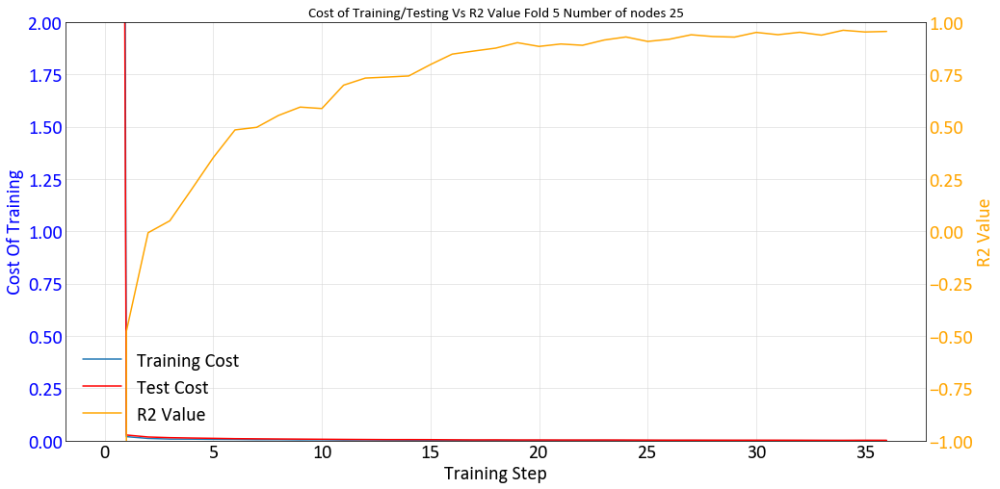

Working on Node 30 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpz15w7naj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049ECDE320>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0037395815365016466
Cost_test : 0.006773864
R^2:0.6496468305587769
Epoch: 1200/5000 err = 0.0029625702183693646
Cost_test : 0.0060561374
R^2:0.7202234983444213
Epoch: 1300/5000 err = 0.0029360796324908733
Cost_test : 0.0057297703
R^2:0.7187289595603943
Epoch: 1400/5000 err = 0.0026557082310318947
Cost_test : 0.0053343987
R^2:0.7605552315711975
Epoch: 1500/5000 err = 0.0022321627009660003
Cost_test : 0.005084024
R^2:0.7700724482536316
Epoch: 1600/5000 err = 0.0019356435164809226
Cost_test : 0.0049374113
R^2:0.8039798974990846
Epoch: 1700/5000 err = 0.0016047966200858355
Cost_test : 0.004296152
R^2:0.8437857508659364
Epoch: 1800/5000 err = 0.0013350771740078926
Cost_test : 0.0034359861
R^2:0.8623438835144042
Epoch: 1900/5000 err = 0.0011647847597487271
Cost_test : 0.0034744688
R^2:0.8915613174438477
Epoch: 2000/5000 err = 0.0008585623232647776
Cost_test : 0.0033690715
R^2:0.8865163087844848
Epoch: 2100/5000 err = 0.0008635464822873474
Cost_test : 0.0028234965
R^2

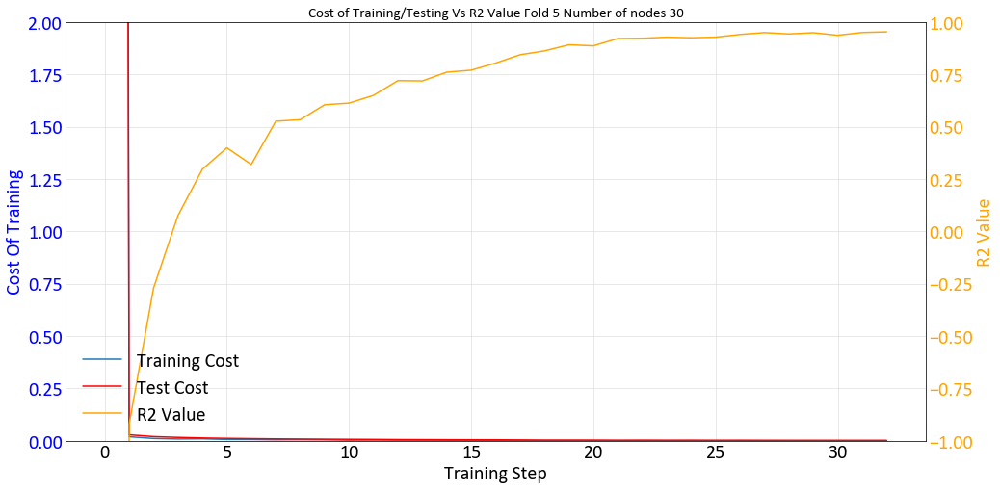

Working on Node 35 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpq_lttcqm', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000204EF5E3DA0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.003401218121871352
Cost_test : 0.0073018842
R^2:0.6364029526710511
Epoch: 1200/5000 err = 0.003544549597427249
Cost_test : 0.006711103
R^2:0.6230506181716919
Epoch: 1300/5000 err = 0.003236696356907487
Cost_test : 0.006278236
R^2:0.619552719593048
Epoch: 1400/5000 err = 0.003313719853758812
Cost_test : 0.006080365
R^2:0.684902787208557
Epoch: 1500/5000 err = 0.0029589682817459106
Cost_test : 0.0054826844
R^2:0.6811572074890138
Epoch: 1600/5000 err = 0.00249194938223809
Cost_test : 0.0048526684
R^2:0.733746612071991
Epoch: 1700/5000 err = 0.002123920409940183
Cost_test : 0.004540399
R^2:0.82034113407135
Epoch: 1800/5000 err = 0.0017552328296005725
Cost_test : 0.004103307
R^2:0.8500465869903564
Epoch: 1900/5000 err = 0.0015643704682588577
Cost_test : 0.003657961
R^2:0.8487330913543701
Epoch: 2000/5000 err = 0.0013295844197273256
Cost_test : 0.0034379275
R^2:0.8790410041809082
Epoch: 2100/5000 err = 0.0010759346070699394
Cost_test : 0.0030460302
R^2:0.887261557579

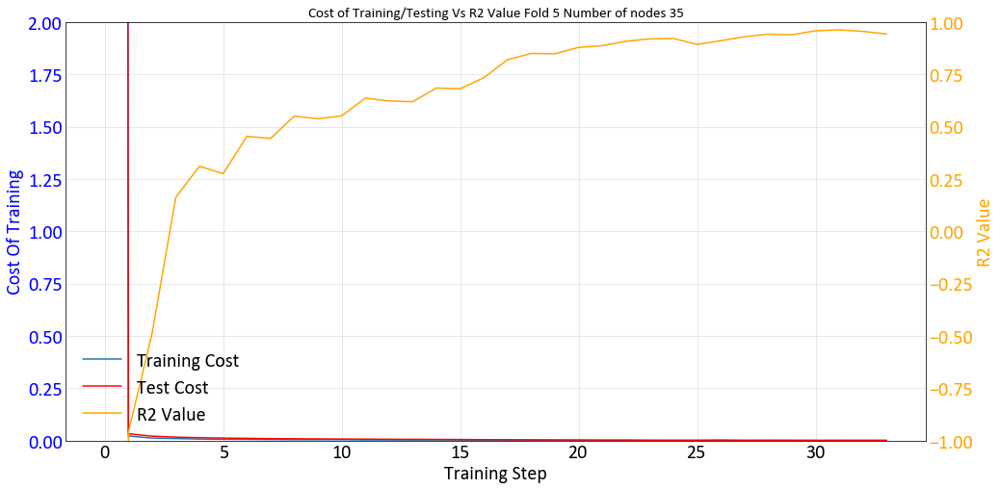

Working on Node 50 fold 5 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpn35mklt1', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050D091B00>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0028856317978352307
Cost_test : 0.0065307627
R^2:0.6654649138450623
Epoch: 1200/5000 err = 0.0035976207815110687
Cost_test : 0.0062785503
R^2:0.7182887196540834
Epoch: 1300/5000 err = 0.002735955151729286
Cost_test : 0.005766712
R^2:0.7485095858573914
Epoch: 1400/5000 err = 0.0025612096302211284
Cost_test : 0.005475839
R^2:0.7475684881210327
Epoch: 1500/5000 err = 0.002562203025445342
Cost_test : 0.0049508326
R^2:0.7921032071113586
Epoch: 1600/5000 err = 0.0017436713678762317
Cost_test : 0.0054848543
R^2:0.7931256413459777
Epoch: 1700/5000 err = 0.001859935442917049
Cost_test : 0.004492285
R^2:0.8472611665725709
Epoch: 1800/5000 err = 0.00161795427557081
Cost_test : 0.0042579784
R^2:0.8283553123474121
Epoch: 1900/5000 err = 0.0012116934172809123
Cost_test : 0.0037314484
R^2:0.8877331733703613
Epoch: 2000/5000 err = 0.0010427118395455182
Cost_test : 0.0035917559
R^2:0.904616153240204
Epoch: 2100/5000 err = 0.0008176060742698609
Cost_test : 0.00306733
R^2:0.90393

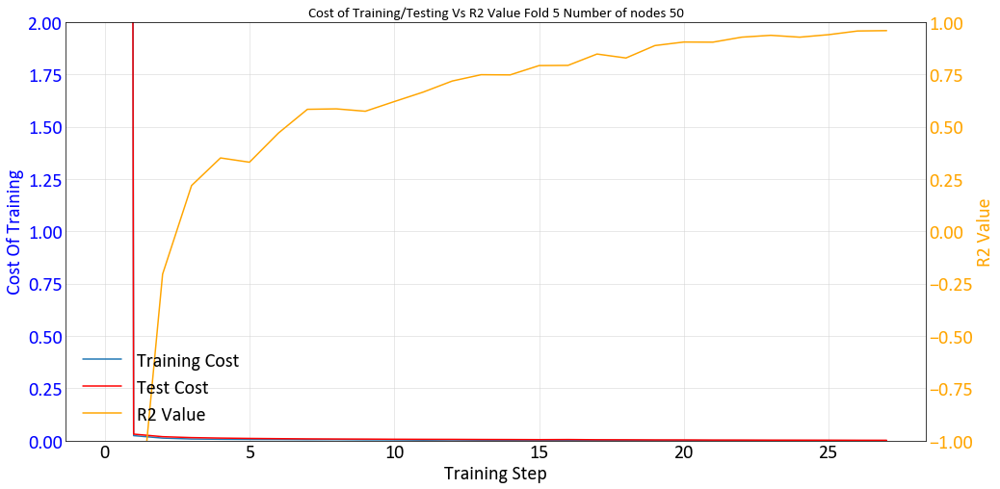

0.0859
12.078
6
Working on Node 20 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp0x1kg713', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205191F05F8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calli

Epoch: 1100/5000 err = 0.0034225457813590763
Cost_test : 0.004920147
R^2:0.6094999432563781
Epoch: 1200/5000 err = 0.00432673953473568
Cost_test : 0.0049780793
R^2:0.6299033403396607
Epoch: 1300/5000 err = 0.0030469096731394535
Cost_test : 0.0042733396
R^2:0.6785141706466675
Epoch: 1400/5000 err = 0.0033307771198451516
Cost_test : 0.004147763
R^2:0.6746269226074219
Epoch: 1500/5000 err = 0.0030213183257728816
Cost_test : 0.0037999616
R^2:0.733307158946991
Epoch: 1600/5000 err = 0.0033003586577251554
Cost_test : 0.0037256747
R^2:0.661577332019806
Epoch: 1700/5000 err = 0.0023453237488865854
Cost_test : 0.0035663904
R^2:0.7599780321121217
Epoch: 1800/5000 err = 0.0022818040102720264
Cost_test : 0.00382326
R^2:0.7825100302696228
Epoch: 1900/5000 err = 0.0019991720328107476
Cost_test : 0.003825023
R^2:0.7182575702667237
Epoch: 2000/5000 err = 0.0016569786937907338
Cost_test : 0.0030809222
R^2:0.8097887754440307
Epoch: 2100/5000 err = 0.0014159035636112094
Cost_test : 0.0030772232
R^2:0.830

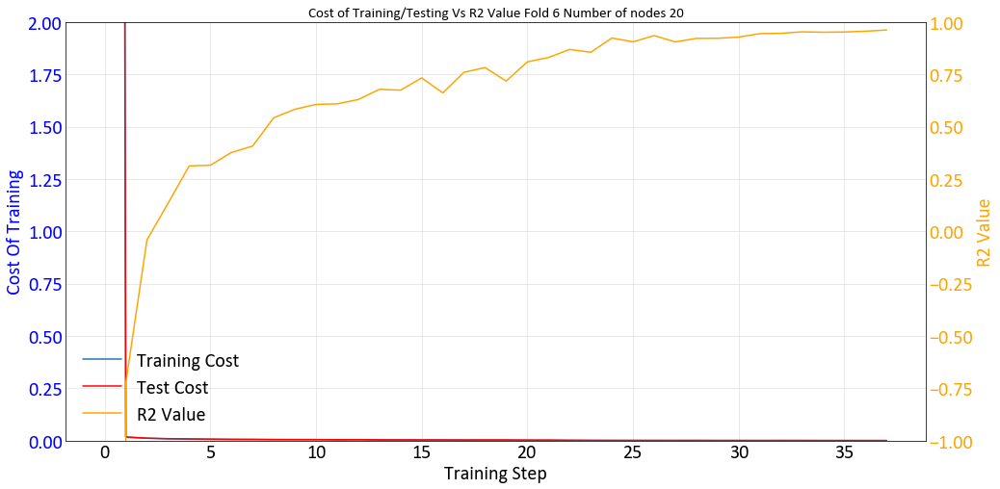

Working on Node 25 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmplmrqmqpz', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205195C9940>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004371460806578398
Cost_test : 0.004985325
R^2:0.6122443795204162
Epoch: 1200/5000 err = 0.003875307319685817
Cost_test : 0.0045110425
R^2:0.6512314438819885
Epoch: 1300/5000 err = 0.003694588644430041
Cost_test : 0.004216956
R^2:0.7134856343269349
Epoch: 1400/5000 err = 0.0027456559240818025
Cost_test : 0.003928755
R^2:0.7461238145828247
Epoch: 1500/5000 err = 0.002043048199266195
Cost_test : 0.0035411327
R^2:0.7693652868270875
Epoch: 1600/5000 err = 0.002655822550877929
Cost_test : 0.0033508604
R^2:0.7778054952621459
Epoch: 1700/5000 err = 0.002212173817679286
Cost_test : 0.0033715633
R^2:0.7971246719360352
Epoch: 1800/5000 err = 0.0020268952939659357
Cost_test : 0.0034270892
R^2:0.8299387454986572
Epoch: 1900/5000 err = 0.0014663260895758869
Cost_test : 0.0025661527
R^2:0.8155474424362182
Epoch: 2000/5000 err = 0.0015462288167327643
Cost_test : 0.0022403449
R^2:0.8451909899711608
Epoch: 2100/5000 err = 0.001184770918916911
Cost_test : 0.0020804838
R^2:0.8699

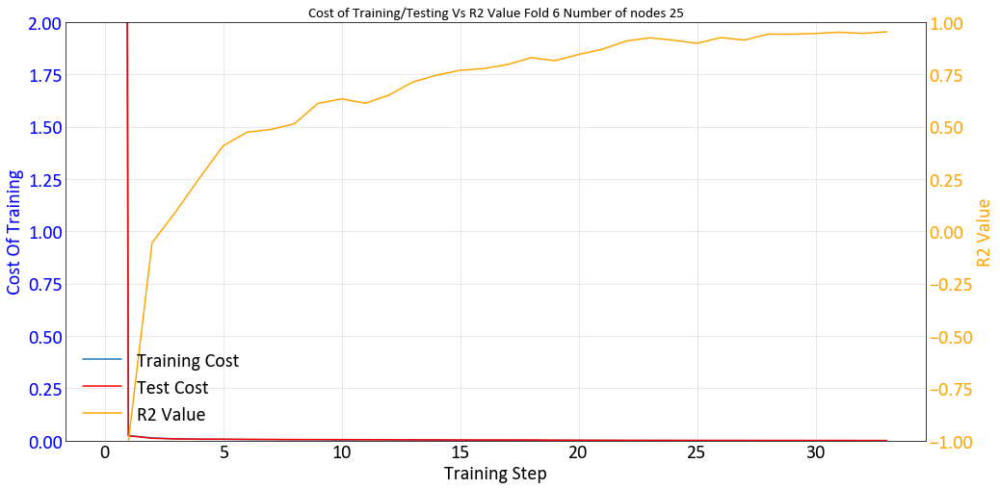

Working on Node 30 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp16ctlqfh', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205195D2940>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004138047713786364
Cost_test : 0.0051342845
R^2:0.6456777930259705
Epoch: 1200/5000 err = 0.0035120036453008645
Cost_test : 0.0046534496
R^2:0.7085043072700501
Epoch: 1300/5000 err = 0.0029460757272318006
Cost_test : 0.0046672546
R^2:0.6656866788864135
Epoch: 1400/5000 err = 0.002517843362875283
Cost_test : 0.0044885473
R^2:0.7187294125556946
Epoch: 1500/5000 err = 0.002427242393605411
Cost_test : 0.0039016553
R^2:0.778569209575653
Epoch: 1600/5000 err = 0.0024823164101690056
Cost_test : 0.0037178427
R^2:0.8081606388092041
Epoch: 1700/5000 err = 0.0013977510621771216
Cost_test : 0.0033358273
R^2:0.8382963538169862
Epoch: 1800/5000 err = 0.0016869476530700922
Cost_test : 0.0030169997
R^2:0.8416573166847229
Epoch: 1900/5000 err = 0.0012215603375807405
Cost_test : 0.0021569466
R^2:0.8760629296302795
Epoch: 2000/5000 err = 0.0009355482645332814
Cost_test : 0.0017750225
R^2:0.9082044363021851
Epoch: 2100/5000 err = 0.0009822027175687253
Cost_test : 0.0016979894
R^2:

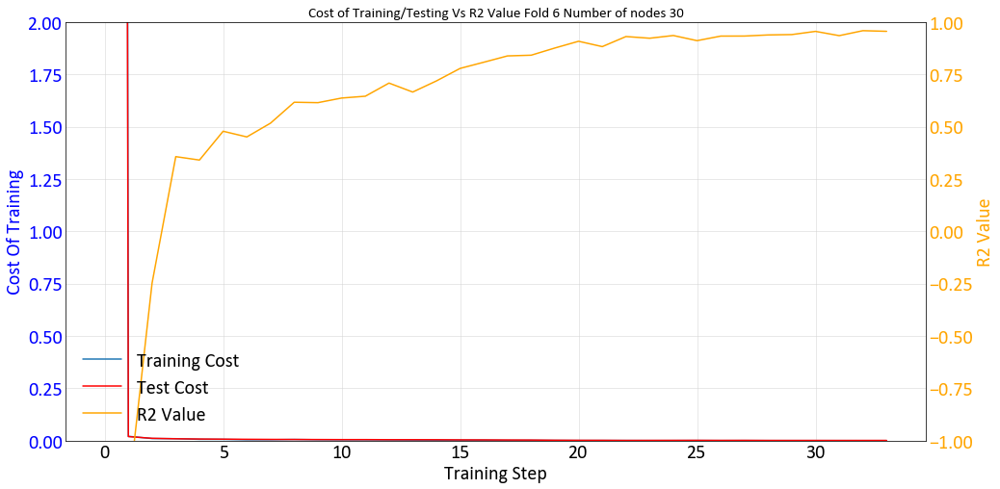

Working on Node 35 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmppxwml9pr', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049A0C45F8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004161322955042124
Cost_test : 0.0048182267
R^2:0.685024082660675
Epoch: 1200/5000 err = 0.0033901032991707322
Cost_test : 0.004811046
R^2:0.6880802154541016
Epoch: 1300/5000 err = 0.002738522132858634
Cost_test : 0.004680649
R^2:0.7587640643119813
Epoch: 1400/5000 err = 0.0024123220704495903
Cost_test : 0.004349879
R^2:0.7510452747344971
Epoch: 1500/5000 err = 0.0020983874099329116
Cost_test : 0.004357121
R^2:0.7546079158782959
Epoch: 1600/5000 err = 0.0023375843185931442
Cost_test : 0.003992362
R^2:0.76995108127594
Epoch: 1700/5000 err = 0.0018370253965258598
Cost_test : 0.0037615444
R^2:0.7981847524642944
Epoch: 1800/5000 err = 0.0021014732075855134
Cost_test : 0.004282152
R^2:0.8458636403083802
Epoch: 1900/5000 err = 0.0019269158598035573
Cost_test : 0.0031616297
R^2:0.8254988074302673
Epoch: 2000/5000 err = 0.0013404538854956626
Cost_test : 0.0027530573
R^2:0.8511033296585084
Epoch: 2100/5000 err = 0.0011514940531924369
Cost_test : 0.0024935438
R^2:0.88648

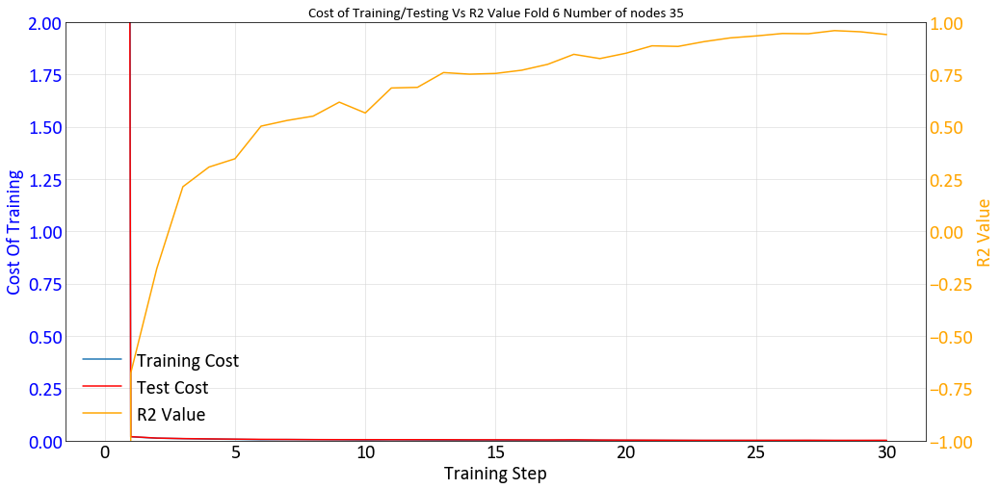

Working on Node 50 fold 6 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp4cqn9vcy', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050CE92048>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0027176154078915717
Cost_test : 0.005013763
R^2:0.728019094467163
Epoch: 1200/5000 err = 0.0024120317073538897
Cost_test : 0.0048468425
R^2:0.7843289732933045
Epoch: 1300/5000 err = 0.0024571057874709368
Cost_test : 0.004425324
R^2:0.7847685933113098
Epoch: 1400/5000 err = 0.001931553985923529
Cost_test : 0.004124521
R^2:0.7901819229125977
Epoch: 1500/5000 err = 0.0016389460768550634
Cost_test : 0.0038139762
R^2:0.8075899839401245
Epoch: 1600/5000 err = 0.0013600725797004998
Cost_test : 0.0032765737
R^2:0.8657467603683471
Epoch: 1700/5000 err = 0.001188410387840122
Cost_test : 0.0025473444
R^2:0.8821869254112243
Epoch: 1800/5000 err = 0.00098706919234246
Cost_test : 0.0021371352
R^2:0.9171066999435424
Epoch: 1900/5000 err = 0.0008661407511681319
Cost_test : 0.0018635266
R^2:0.9123546123504639
Epoch: 2000/5000 err = 0.0006390580558218062
Cost_test : 0.0014655787
R^2:0.9118044137954712
Epoch: 2100/5000 err = 0.0005671258550137281
Cost_test : 0.0013767419
R^2:0.93

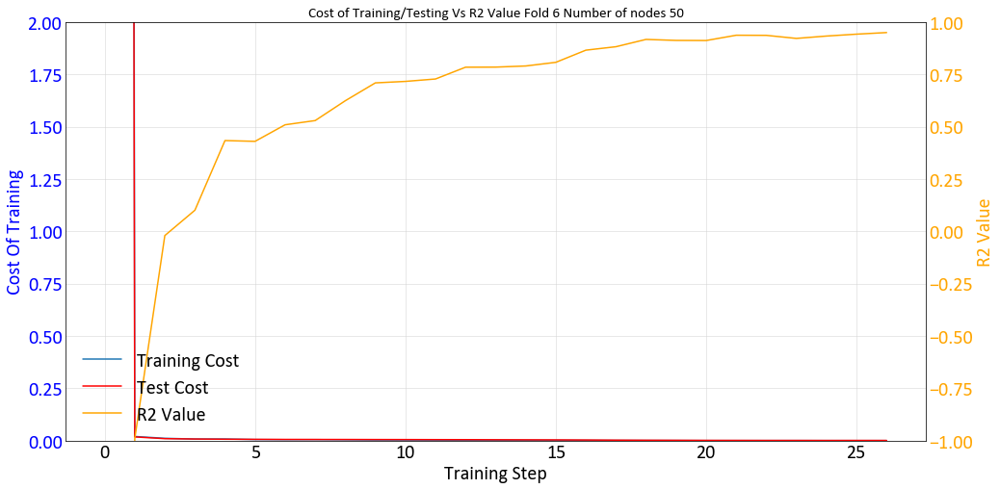

0.0634
14.8398
7
Working on Node 20 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpc3jzevys', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049B670518>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0031481122132390738
Cost_test : 0.0040421123
R^2:0.5995891809463502
Epoch: 1200/5000 err = 0.0035725480876863
Cost_test : 0.003886022
R^2:0.6773525476455688
Epoch: 1300/5000 err = 0.0027302769012749195
Cost_test : 0.003566635
R^2:0.6482893228530884
Epoch: 1400/5000 err = 0.002500527538359165
Cost_test : 0.0031670786
R^2:0.6898114204406738
Epoch: 1500/5000 err = 0.0025964260566979647
Cost_test : 0.003152934
R^2:0.7084077000617981
Epoch: 1600/5000 err = 0.0023193438770249485
Cost_test : 0.0028375413
R^2:0.7428259015083312
Epoch: 1700/5000 err = 0.0018525923136621715
Cost_test : 0.002824185
R^2:0.7739790439605712
Epoch: 1800/5000 err = 0.001512375520542264
Cost_test : 0.0024452175
R^2:0.8166261553764343
Epoch: 1900/5000 err = 0.001256268471479416
Cost_test : 0.0019669232
R^2:0.8356176614761353
Epoch: 2000/5000 err = 0.0009468667558394371
Cost_test : 0.0018280884
R^2:0.887499988079071
Epoch: 2100/5000 err = 0.0011373408837243913
Cost_test : 0.0018416053
R^2:0.85346

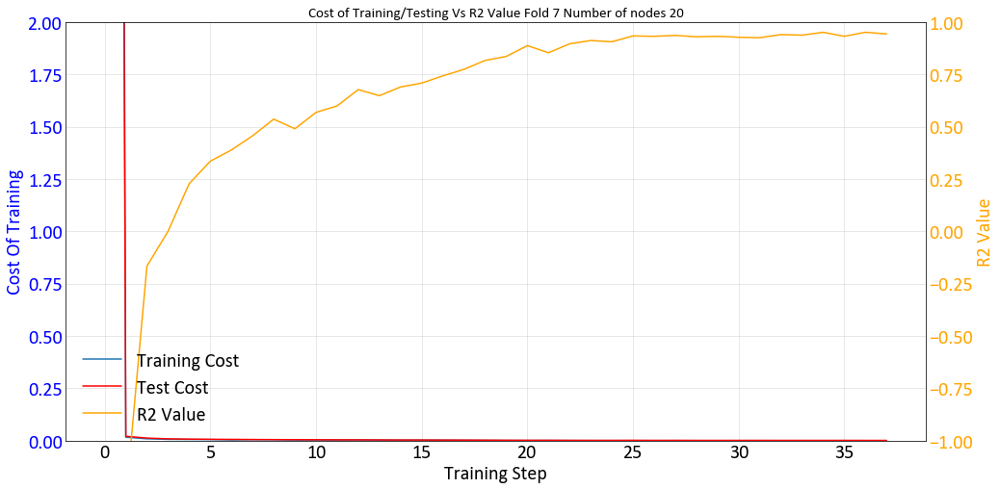

Working on Node 25 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpb1f994mq', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050D1295C0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.004014771105721592
Cost_test : 0.005941314
R^2:0.4978443503379822
Epoch: 1200/5000 err = 0.004535263171419501
Cost_test : 0.0055742012
R^2:0.4818113684654236
Epoch: 1300/5000 err = 0.003786642616614699
Cost_test : 0.0051489305
R^2:0.5536795258522034
Epoch: 1400/5000 err = 0.0036884873639792207
Cost_test : 0.0048256707
R^2:0.6076512455940247
Epoch: 1500/5000 err = 0.0031185138504952192
Cost_test : 0.0044392277
R^2:0.5922821164131165
Epoch: 1600/5000 err = 0.0029987822286784652
Cost_test : 0.004120325
R^2:0.6017503142356873
Epoch: 1700/5000 err = 0.003508092556148767
Cost_test : 0.0038865798
R^2:0.6438124299049377
Epoch: 1800/5000 err = 0.0023902569664642215
Cost_test : 0.0034684218
R^2:0.7325499653816223
Epoch: 1900/5000 err = 0.002466707304120064
Cost_test : 0.0030367994
R^2:0.7153847575187683
Epoch: 2000/5000 err = 0.0017661058111116288
Cost_test : 0.0028473495
R^2:0.7606011986732483
Epoch: 2100/5000 err = 0.0016498429235070943
Cost_test : 0.002455523
R^2:0.79

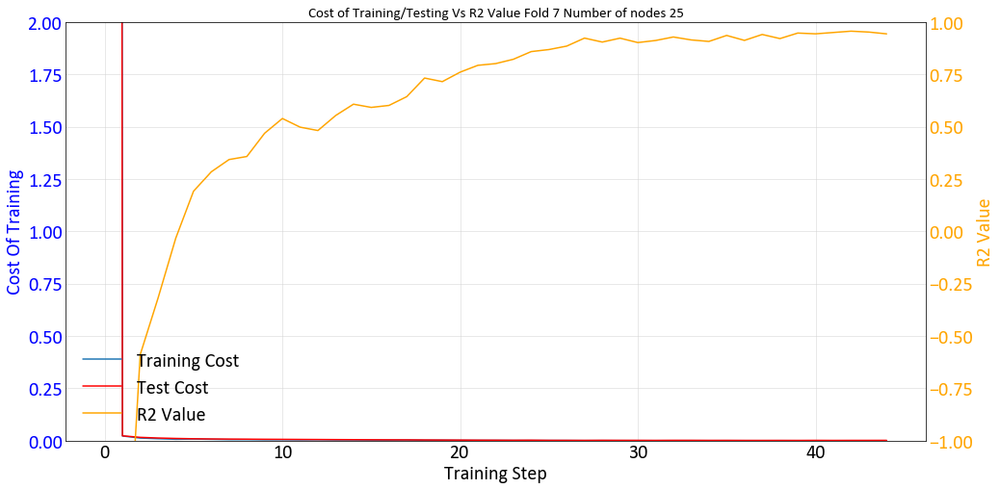

Working on Node 30 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpwmg83z61', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002051930EBA8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.003358499752357602
Cost_test : 0.004846759
R^2:0.5918177485466003
Epoch: 1200/5000 err = 0.0036851115059107547
Cost_test : 0.0046051964
R^2:0.6139673590660095
Epoch: 1300/5000 err = 0.00297906119376421
Cost_test : 0.004199908
R^2:0.6246484994888306
Epoch: 1400/5000 err = 0.0028280652826651927
Cost_test : 0.0038258065
R^2:0.6379520893096924
Epoch: 1500/5000 err = 0.0024716791696846483
Cost_test : 0.0034455298
R^2:0.6395020127296448
Epoch: 1600/5000 err = 0.0018580462085083127
Cost_test : 0.0030770127
R^2:0.7293187022209168
Epoch: 1700/5000 err = 0.002190336771309376
Cost_test : 0.0029403633
R^2:0.7312364459037781
Epoch: 1800/5000 err = 0.0017794437706470491
Cost_test : 0.0027483753
R^2:0.756195330619812
Epoch: 1900/5000 err = 0.0017201115144416688
Cost_test : 0.00312638
R^2:0.7672696828842163
Epoch: 2000/5000 err = 0.0014668932883068917
Cost_test : 0.002492032
R^2:0.8156932830810547
Epoch: 2100/5000 err = 0.001193573046475649
Cost_test : 0.002330769
R^2:0.869681

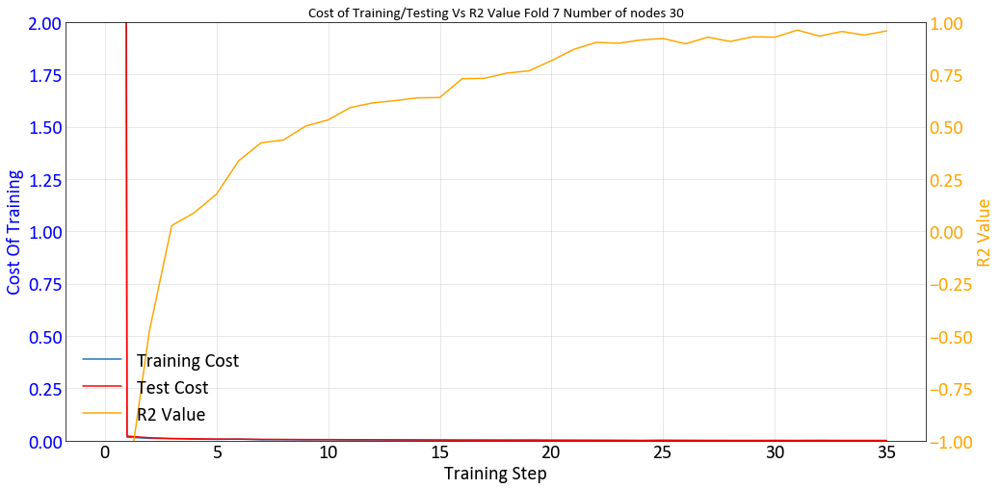

Working on Node 35 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpgbbb1fg1', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049C027898>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0024020447861403224
Cost_test : 0.0045276377
R^2:0.6271435141563415
Epoch: 1200/5000 err = 0.0027090506628155704
Cost_test : 0.004175169
R^2:0.6766809225082397
Epoch: 1300/5000 err = 0.002640084968879819
Cost_test : 0.0039176745
R^2:0.7192395687103271
Epoch: 1400/5000 err = 0.0018083165399730206
Cost_test : 0.0033927292
R^2:0.7160813450813293
Epoch: 1500/5000 err = 0.0017894759075716138
Cost_test : 0.0036505144
R^2:0.7241859674453736
Epoch: 1600/5000 err = 0.002235361374914646
Cost_test : 0.003486019
R^2:0.7727399826049806
Epoch: 1700/5000 err = 0.0017821447923779487
Cost_test : 0.0031504226
R^2:0.7939940810203552
Epoch: 1800/5000 err = 0.0015124002937227487
Cost_test : 0.0029913846
R^2:0.836302423477173
Epoch: 1900/5000 err = 0.001116298115812242
Cost_test : 0.0024690363
R^2:0.8216564536094666
Epoch: 2000/5000 err = 0.0010856916080228985
Cost_test : 0.0022761263
R^2:0.8859336853027344
Epoch: 2100/5000 err = 0.0007404235657304525
Cost_test : 0.0020454975
R^2:0.

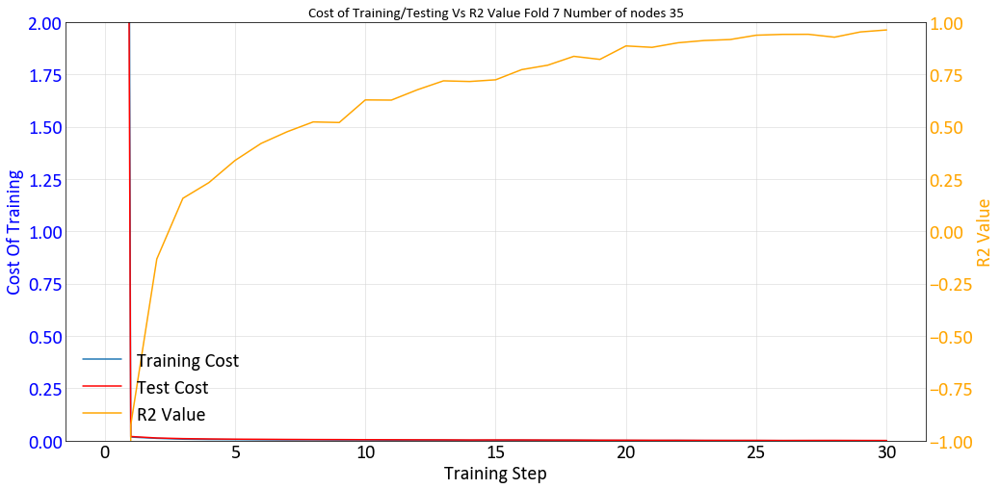

Working on Node 50 fold 7 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpkd3a2rdw', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020518CC3F98>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0019388286629691723
Cost_test : 0.0038134507
R^2:0.7378160834312439
Epoch: 1200/5000 err = 0.002141075301915407
Cost_test : 0.0033958128
R^2:0.7936159849166871
Epoch: 1300/5000 err = 0.0018183792708441615
Cost_test : 0.0035544566
R^2:0.7791860580444336
Epoch: 1400/5000 err = 0.0010583432856947183
Cost_test : 0.0032637394
R^2:0.8264836907386779
Epoch: 1500/5000 err = 0.0010297781089320778
Cost_test : 0.0032376957
R^2:0.8529626488685609
Epoch: 1600/5000 err = 0.0009734685067087412
Cost_test : 0.0031598026
R^2:0.8683053135871888
Epoch: 1700/5000 err = 0.0008529432001523673
Cost_test : 0.0028207698
R^2:0.8988526344299317
Epoch: 1800/5000 err = 0.0008920777589082719
Cost_test : 0.002139852
R^2:0.9086934447288515
Epoch: 1900/5000 err = 0.0008604387752711773
Cost_test : 0.002118018
R^2:0.8979987502098083
Epoch: 2000/5000 err = 0.0007146453368477524
Cost_test : 0.0017128316
R^2:0.9290864586830139
Epoch: 2100/5000 err = 0.0004895303689409048
Cost_test : 0.0012742841
R^2

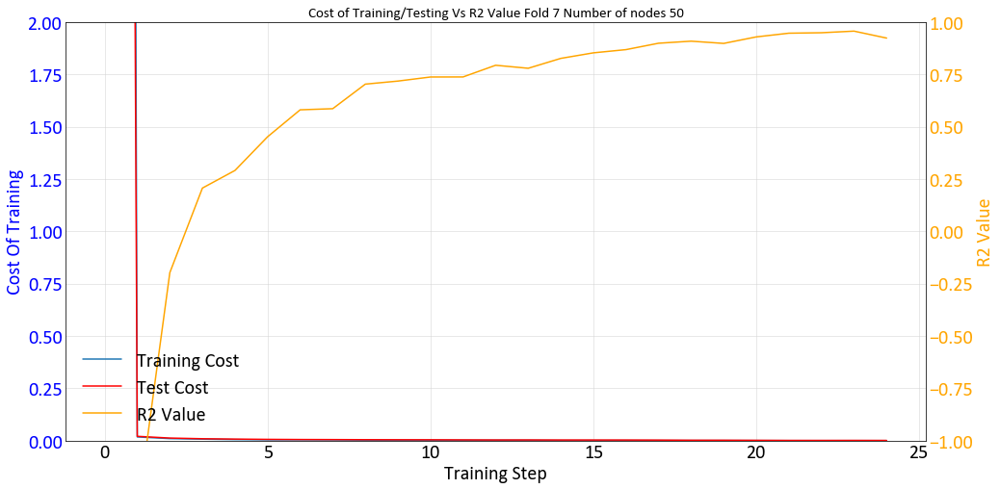

0.0483
17.6323
8
Working on Node 20 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp41waz5m4', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205149F0390>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0028182952664792538
Cost_test : 0.0063176234
R^2:0.4989662170410156
Epoch: 1200/5000 err = 0.002589355455711484
Cost_test : 0.0062223948
R^2:0.4388019919395447
Epoch: 1300/5000 err = 0.0023471256718039513
Cost_test : 0.0056793382
R^2:0.5811237335205078
Epoch: 1400/5000 err = 0.0022381593473255633
Cost_test : 0.0053497325
R^2:0.5842853307723999
Epoch: 1500/5000 err = 0.0030586551642045384
Cost_test : 0.0051666806
R^2:0.5942403554916382
Epoch: 1600/5000 err = 0.0027834384702146056
Cost_test : 0.004968857
R^2:0.6739119529724121
Epoch: 1700/5000 err = 0.0020843530539423226
Cost_test : 0.0046649347
R^2:0.6485505700111389
Epoch: 1800/5000 err = 0.0017518643522635101
Cost_test : 0.0047194855
R^2:0.6470166444778442
Epoch: 1900/5000 err = 0.0018870046362280844
Cost_test : 0.0044156373
R^2:0.7176698088645936
Epoch: 2000/5000 err = 0.0018340975977480412
Cost_test : 0.004113055
R^2:0.712613320350647
Epoch: 2100/5000 err = 0.0018891200656071306
Cost_test : 0.004165675
R^2:0

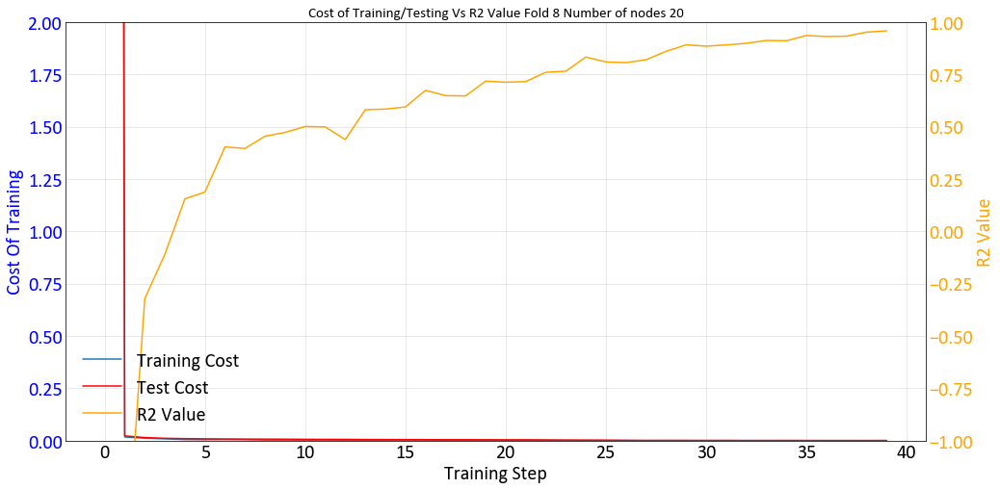

Working on Node 25 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpyuol3au9', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020512080748>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.003242255887016654
Cost_test : 0.006553305
R^2:0.41462029218673707
Epoch: 1200/5000 err = 0.004025276191532612
Cost_test : 0.0062949155
R^2:0.5194185614585877
Epoch: 1300/5000 err = 0.003384421672672033
Cost_test : 0.00614252
R^2:0.5117411971092224
Epoch: 1400/5000 err = 0.002758565545082092
Cost_test : 0.0059080776
R^2:0.5555268883705139
Epoch: 1500/5000 err = 0.0033175739459693435
Cost_test : 0.005601615
R^2:0.5734587669372558
Epoch: 1600/5000 err = 0.0034796907799318436
Cost_test : 0.0052495734
R^2:0.5717741250991821
Epoch: 1700/5000 err = 0.0026918804505839944
Cost_test : 0.004954382
R^2:0.6279417157173156
Epoch: 1800/5000 err = 0.002905670600011945
Cost_test : 0.0048303977
R^2:0.6457205772399902
Epoch: 1900/5000 err = 0.0025209466461092235
Cost_test : 0.0043253177
R^2:0.6715451121330261
Epoch: 2000/5000 err = 0.0030172636965289717
Cost_test : 0.004031291
R^2:0.6679921984672545
Epoch: 2100/5000 err = 0.002824172098189592
Cost_test : 0.003983921
R^2:0.654093

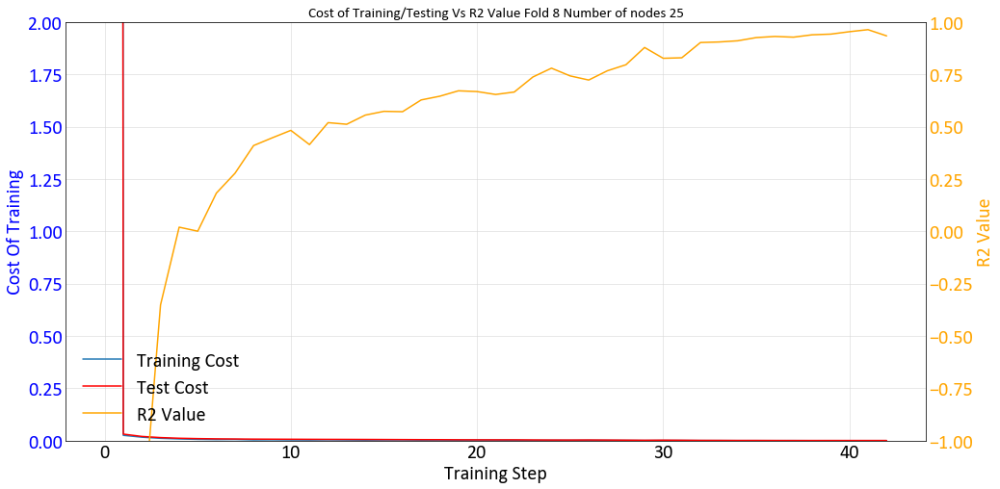

Working on Node 30 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp6qxb065u', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050C820F98>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0031619641929864885
Cost_test : 0.00590003
R^2:0.4550090670585632
Epoch: 1200/5000 err = 0.0031970443204045293
Cost_test : 0.005494937
R^2:0.5888851642608642
Epoch: 1300/5000 err = 0.0031910015037283296
Cost_test : 0.0052142013
R^2:0.5890127420425415
Epoch: 1400/5000 err = 0.0028385852463543412
Cost_test : 0.0052230945
R^2:0.5996052145957946
Epoch: 1500/5000 err = 0.0025413102237507703
Cost_test : 0.004830756
R^2:0.6112844228744507
Epoch: 1600/5000 err = 0.002690246398560703
Cost_test : 0.004747125
R^2:0.6608187079429626
Epoch: 1700/5000 err = 0.0017097004922106863
Cost_test : 0.004153736
R^2:0.6956493139266968
Epoch: 1800/5000 err = 0.0020543372258543966
Cost_test : 0.003922576
R^2:0.7163496732711793
Epoch: 1900/5000 err = 0.0013306623557582497
Cost_test : 0.0037215569
R^2:0.7577264189720153
Epoch: 2000/5000 err = 0.0013664904399774966
Cost_test : 0.0032646426
R^2:0.8027695417404174
Epoch: 2100/5000 err = 0.0014318637549877167
Cost_test : 0.0026578363
R^2:0.78

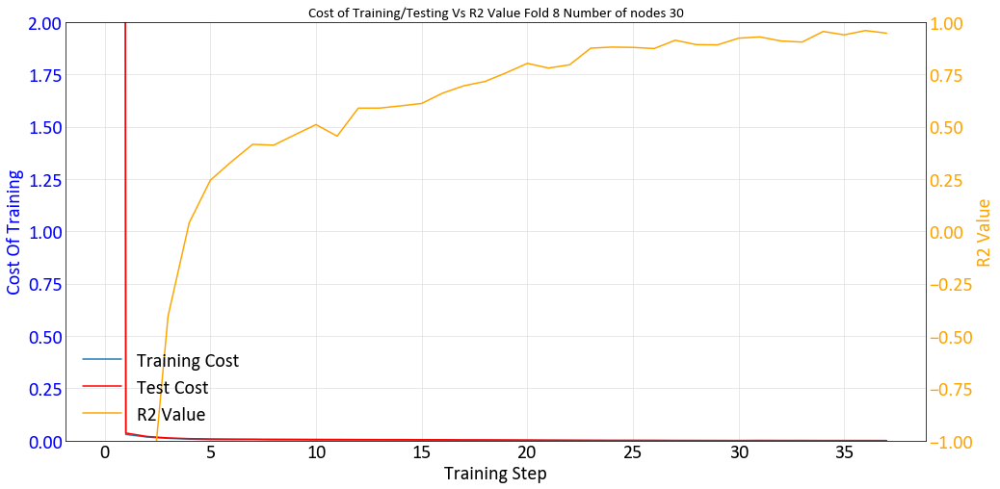

Working on Node 35 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpm88kl1pm', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049D8DE6A0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0029587368480861187
Cost_test : 0.00607568
R^2:0.5435909152030945
Epoch: 1200/5000 err = 0.002706351596862078
Cost_test : 0.005678739
R^2:0.5855968117713928
Epoch: 1300/5000 err = 0.002485777181573212
Cost_test : 0.0053920555
R^2:0.5638486504554749
Epoch: 1400/5000 err = 0.0026423362549394367
Cost_test : 0.0050490457
R^2:0.6497084498405457
Epoch: 1500/5000 err = 0.002376331272535026
Cost_test : 0.004895224
R^2:0.5605830430984496
Epoch: 1600/5000 err = 0.002499951608479023
Cost_test : 0.004640726
R^2:0.6520902752876282
Epoch: 1700/5000 err = 0.002527713682502508
Cost_test : 0.0046737124
R^2:0.6107610821723937
Epoch: 1800/5000 err = 0.0026560171972960234
Cost_test : 0.0040237326
R^2:0.6970122218132018
Epoch: 1900/5000 err = 0.002506348607130349
Cost_test : 0.0037251483
R^2:0.6309213876724242
Epoch: 2000/5000 err = 0.0015092618996277454
Cost_test : 0.0035778896
R^2:0.7720097541809082
Epoch: 2100/5000 err = 0.001661774073727429
Cost_test : 0.0034973163
R^2:0.769783

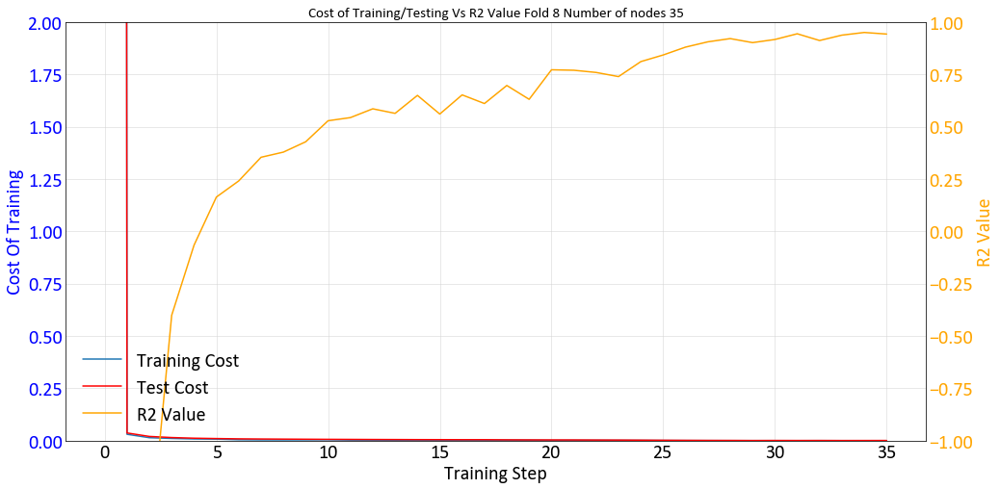

Working on Node 50 fold 8 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpsetdbunj', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002051459E278>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.001372482511214912
Cost_test : 0.003748973
R^2:0.8284955620765686
Epoch: 1200/5000 err = 0.001109052123501897
Cost_test : 0.0034870275
R^2:0.8412662744522095
Epoch: 1300/5000 err = 0.0009438614593818783
Cost_test : 0.003101181
R^2:0.8673729062080382
Epoch: 1400/5000 err = 0.0008995435317046941
Cost_test : 0.0028651801
R^2:0.8566020607948303
Epoch: 1500/5000 err = 0.0007508660084567965
Cost_test : 0.0025803058
R^2:0.8999764919281006
Epoch: 1600/5000 err = 0.0005879712698515504
Cost_test : 0.002337561
R^2:0.9154389023780823
Epoch: 1700/5000 err = 0.00048522171564400194
Cost_test : 0.0020467439
R^2:0.9408421397209168
Epoch: 1800/5000 err = 0.0004966440028510988
Cost_test : 0.0023453615
R^2:0.9263516068458557
Epoch: 1900/5000 err = 0.0004402460530400276
Cost_test : 0.00196547
R^2:0.9405606627464294
Epoch: 2000/5000 err = 0.00037410132936201986
Cost_test : 0.0018149234
R^2:0.9386489033699036
End of learning process
Final epoch = 2055/5000 
Final error = 0.0002558096

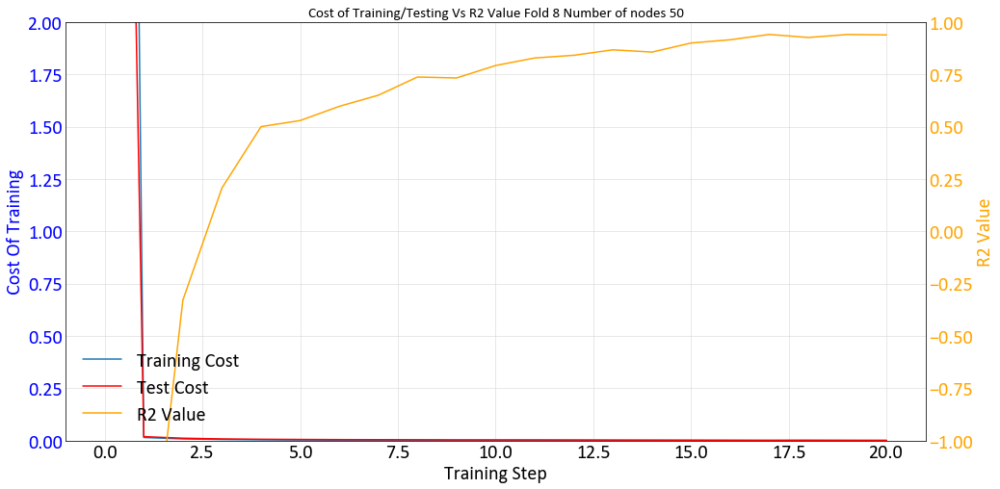

0.0377
20.4052
9
Working on Node 20 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp8wrelee9', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050C8740F0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done call

Epoch: 1100/5000 err = 0.0030311692971736193
Cost_test : 0.0051224306
R^2:0.4772425055503845
Epoch: 1200/5000 err = 0.0029328098986297845
Cost_test : 0.0049087955
R^2:0.5154156565666199
Epoch: 1300/5000 err = 0.002281242469325662
Cost_test : 0.004574789
R^2:0.6209162831306457
Epoch: 1400/5000 err = 0.002897177170962095
Cost_test : 0.0042394195
R^2:0.6225916504859924
Epoch: 1500/5000 err = 0.0031431516632437705
Cost_test : 0.0039538248
R^2:0.6152591705322266
Epoch: 1600/5000 err = 0.0026001641526818275
Cost_test : 0.0034617241
R^2:0.694296407699585
Epoch: 1700/5000 err = 0.0020250125555321572
Cost_test : 0.0032908148
R^2:0.6604811191558838
Epoch: 1800/5000 err = 0.0013675817754119635
Cost_test : 0.002988215
R^2:0.6577472329139709
Epoch: 1900/5000 err = 0.0018963626585900783
Cost_test : 0.0031877996
R^2:0.7189046025276183
Epoch: 2000/5000 err = 0.0018956946907564998
Cost_test : 0.0031354416
R^2:0.7630733013153076
Epoch: 2100/5000 err = 0.001875519845634699
Cost_test : 0.002703395
R^2:0.7

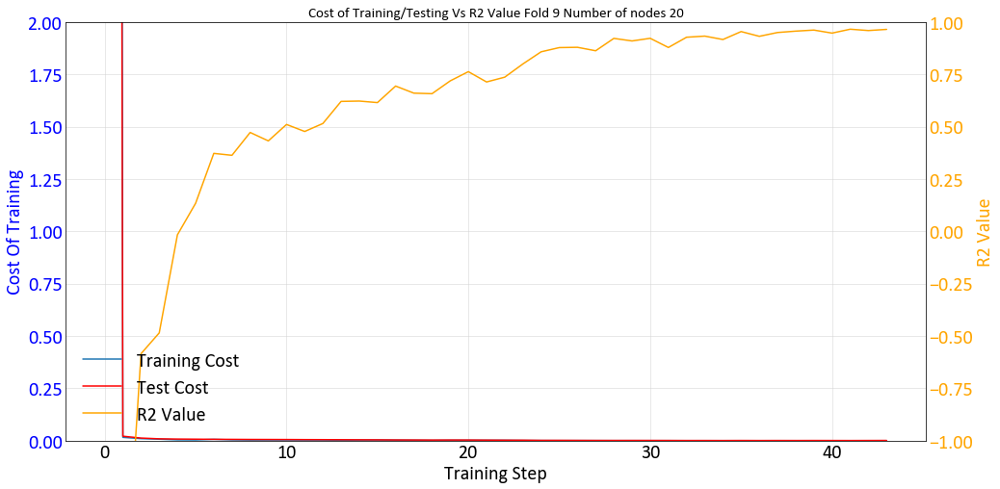

Working on Node 25 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp8nfwydg9', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205193A66A0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0027905763592571023
Cost_test : 0.005494396
R^2:0.5708767533302308
Epoch: 1200/5000 err = 0.003673647390678525
Cost_test : 0.0053272
R^2:0.5998257040977478
Epoch: 1300/5000 err = 0.0028843877138569948
Cost_test : 0.005061669
R^2:0.5156517624855042
Epoch: 1400/5000 err = 0.0035100965527817603
Cost_test : 0.0047481945
R^2:0.6544812679290771
Epoch: 1500/5000 err = 0.0025054939091205598
Cost_test : 0.0043892707
R^2:0.509379506111145
Epoch: 1600/5000 err = 0.0026417496148496864
Cost_test : 0.0039035033
R^2:0.5791322231292725
Epoch: 1700/5000 err = 0.002371601201593876
Cost_test : 0.0038067626
R^2:0.681597113609314
Epoch: 1800/5000 err = 0.0020846635568886993
Cost_test : 0.0032871547
R^2:0.7416846632957459
Epoch: 1900/5000 err = 0.002061818283982575
Cost_test : 0.0029453603
R^2:0.683263909816742
Epoch: 2000/5000 err = 0.0018310870043933391
Cost_test : 0.0026907853
R^2:0.6696225643157959
Epoch: 2100/5000 err = 0.0015356969321146609
Cost_test : 0.0027022052
R^2:0.75782

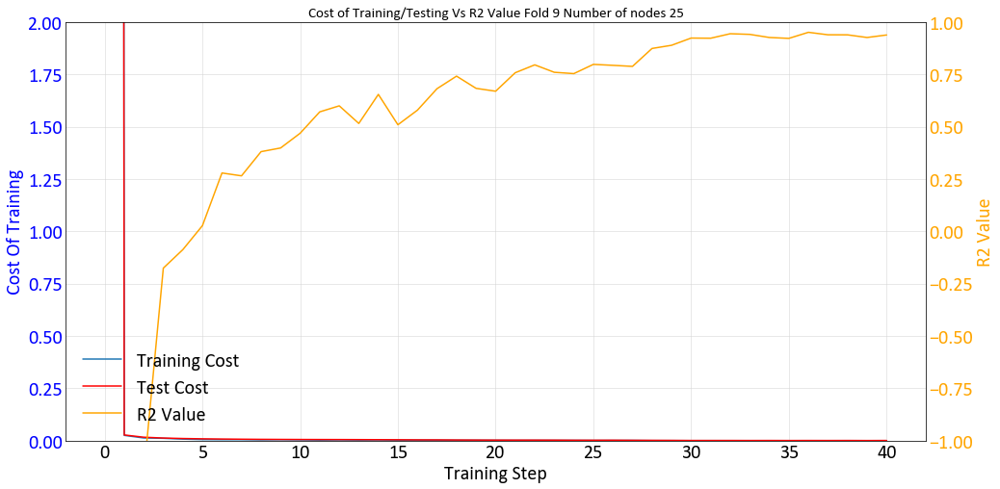

Working on Node 30 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp1m781iuu', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000204EF2AFF98>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0026534525910392407
Cost_test : 0.005328596
R^2:0.49842574596405026
Epoch: 1200/5000 err = 0.0020922694588080045
Cost_test : 0.00531947
R^2:0.6123302698135376
Epoch: 1300/5000 err = 0.0020267076790332792
Cost_test : 0.004447673
R^2:0.6411980509757996
Epoch: 1400/5000 err = 0.002540170541033149
Cost_test : 0.0040517077
R^2:0.6390354156494141
Epoch: 1500/5000 err = 0.0019364390289410948
Cost_test : 0.0038397012
R^2:0.7445216298103332
Epoch: 1600/5000 err = 0.0018969302298501133
Cost_test : 0.0032698691
R^2:0.7198549747467041
Epoch: 1700/5000 err = 0.0016800391138531267
Cost_test : 0.002867971
R^2:0.7894037723541261
Epoch: 1800/5000 err = 0.0012156409560702742
Cost_test : 0.0024914017
R^2:0.784178638458252
Epoch: 1900/5000 err = 0.0012694011209532618
Cost_test : 0.0023030855
R^2:0.8216228604316711
Epoch: 2000/5000 err = 0.0011285742162726819
Cost_test : 0.0021191295
R^2:0.8747515082359314
Epoch: 2100/5000 err = 0.0007582056801766156
Cost_test : 0.0017332301
R^2:0.

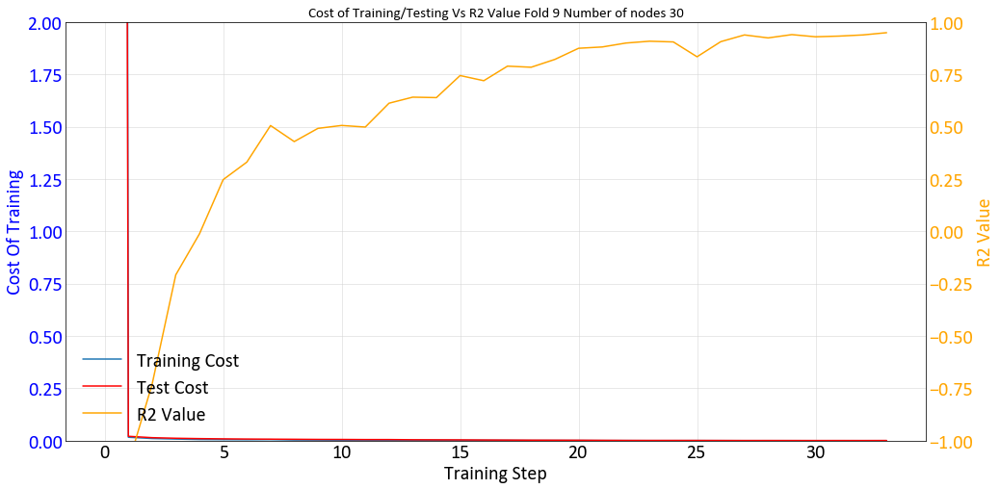

Working on Node 35 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp7ssr90eq', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002051065B6D8>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0027341918088495732
Cost_test : 0.005432231
R^2:0.4430292844772339
Epoch: 1200/5000 err = 0.0029016329906880853
Cost_test : 0.005163365
R^2:0.5533259034156799
Epoch: 1300/5000 err = 0.002842623088508844
Cost_test : 0.004541869
R^2:0.6079527378082276
Epoch: 1400/5000 err = 0.002542070997878909
Cost_test : 0.0038864582
R^2:0.6662508964538574
Epoch: 1500/5000 err = 0.0021734984358772634
Cost_test : 0.0037511007
R^2:0.695177149772644
Epoch: 1600/5000 err = 0.0015100978314876556
Cost_test : 0.0033392808
R^2:0.758062767982483
Epoch: 1700/5000 err = 0.0012061400222592056
Cost_test : 0.0032519905
R^2:0.7852944254875183
Epoch: 1800/5000 err = 0.0012466341839171946
Cost_test : 0.0027658697
R^2:0.8301468133926393
Epoch: 1900/5000 err = 0.0008504952769726516
Cost_test : 0.002580395
R^2:0.837127721309662
Epoch: 2000/5000 err = 0.0011808617971837522
Cost_test : 0.0022371362
R^2:0.7904329538345336
Epoch: 2100/5000 err = 0.0008451580186374485
Cost_test : 0.0020237723
R^2:0.887

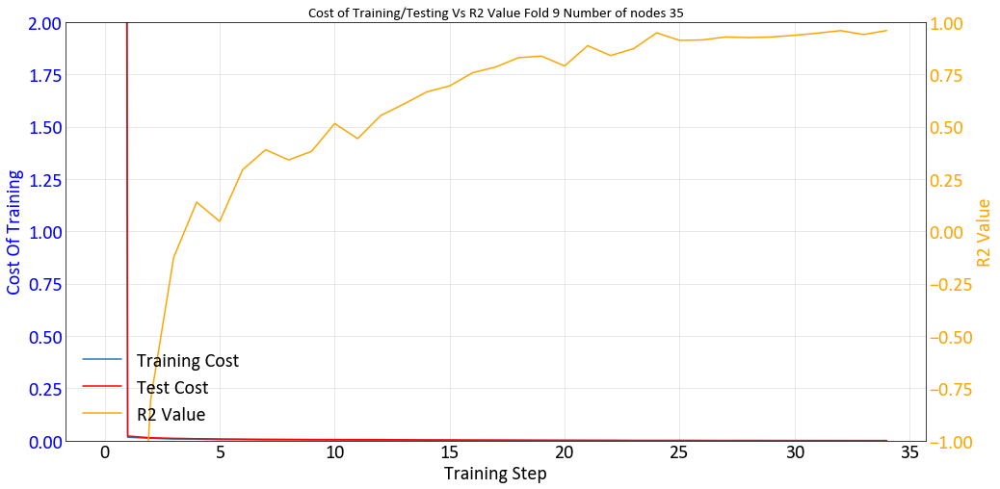

Working on Node 50 fold 9 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmptvlw17yq', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002049BEB4048>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
INF

Epoch: 1100/5000 err = 0.0009708985104225577
Cost_test : 0.0026324505
R^2:0.8511422634124756
Epoch: 1200/5000 err = 0.00073154455749318
Cost_test : 0.0020577651
R^2:0.8041767358779908
Epoch: 1300/5000 err = 0.0008715038769878446
Cost_test : 0.0020505951
R^2:0.8956798434257507
Epoch: 1400/5000 err = 0.0007428867742419244
Cost_test : 0.0017373081
R^2:0.903607976436615
Epoch: 1500/5000 err = 0.0006457307434175163
Cost_test : 0.0013960251
R^2:0.9147995114326477
Epoch: 1600/5000 err = 0.0005520455946680158
Cost_test : 0.0013556993
R^2:0.9036962747573852
Epoch: 1700/5000 err = 0.0003642233437858522
Cost_test : 0.0013313022
R^2:0.9495824337005615
Epoch: 1800/5000 err = 0.0003341283765621483
Cost_test : 0.00097613555
R^2:0.9324192762374877
Epoch: 1900/5000 err = 0.0003605850448366254
Cost_test : 0.0010463208
R^2:0.9421602487564087
Epoch: 2000/5000 err = 0.0002478400361724198
Cost_test : 0.000745379
R^2:0.96161447763443
End of learning process
Final epoch = 2045/5000 
Final error = 0.0003087949

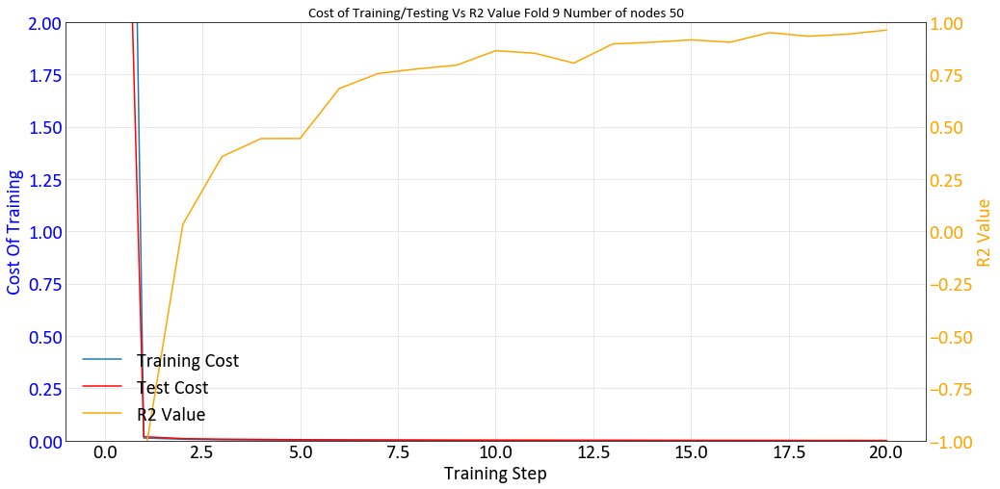

0.0301
23.125
10
Working on Node 20 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpa6kqeam6', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205144841D0>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done cal

Epoch: 1100/5000 err = 0.0028162275906652213
Cost_test : 0.0038869735
R^2:0.690911841392517
Epoch: 1200/5000 err = 0.00202918138820678
Cost_test : 0.0036834877
R^2:0.5650862455368042
Epoch: 1300/5000 err = 0.0023866005241870883
Cost_test : 0.0034891742
R^2:0.6459717869758607
Epoch: 1400/5000 err = 0.002205491135828197
Cost_test : 0.0034026874
R^2:0.6583247661590577
Epoch: 1500/5000 err = 0.002087999461218715
Cost_test : 0.0030541208
R^2:0.6768372535705567
Epoch: 1600/5000 err = 0.0012915838975459336
Cost_test : 0.0028086181
R^2:0.6697204232215881
Epoch: 1700/5000 err = 0.00138978254981339
Cost_test : 0.002697932
R^2:0.8092522263526916
Epoch: 1800/5000 err = 0.0012484892038628459
Cost_test : 0.0023448744
R^2:0.839156985282898
Epoch: 1900/5000 err = 0.0010236875154078008
Cost_test : 0.0019855818
R^2:0.8096655249595642
Epoch: 2000/5000 err = 0.0009285136940889061
Cost_test : 0.0018902859
R^2:0.807194173336029
Epoch: 2100/5000 err = 0.0007516334997490048
Cost_test : 0.0016516275
R^2:0.9068

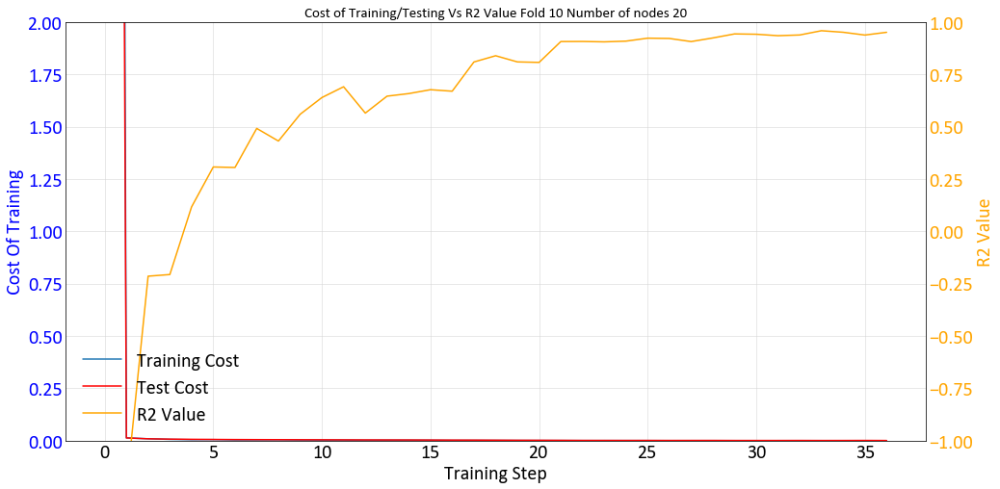

Working on Node 25 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp8bxdyfzr', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x00000205191F0B70>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.0024412185186520217
Cost_test : 0.0038535178
R^2:0.5853892087936401
Epoch: 1200/5000 err = 0.0027163326740264893
Cost_test : 0.0035605077
R^2:0.5680299639701842
Epoch: 1300/5000 err = 0.0016657371073961259
Cost_test : 0.003375651
R^2:0.6001215577125549
Epoch: 1400/5000 err = 0.0025233530439436433
Cost_test : 0.0033925308
R^2:0.69163019657135
Epoch: 1500/5000 err = 0.001813381491228938
Cost_test : 0.0031674562
R^2:0.7628172874450683
Epoch: 1600/5000 err = 0.0012355780461803078
Cost_test : 0.002685415
R^2:0.7393916845321655
Epoch: 1700/5000 err = 0.001770447927992791
Cost_test : 0.00297064
R^2:0.8422700524330139
Epoch: 1800/5000 err = 0.001260911417193711
Cost_test : 0.0026119722
R^2:0.824996817111969
Epoch: 1900/5000 err = 0.0010561553994193674
Cost_test : 0.0026549513
R^2:0.8356719613075256
Epoch: 2000/5000 err = 0.0010890863952226937
Cost_test : 0.0024683059
R^2:0.838577377796173
Epoch: 2100/5000 err = 0.0008205529709812253
Cost_test : 0.002182902
R^2:0.812175

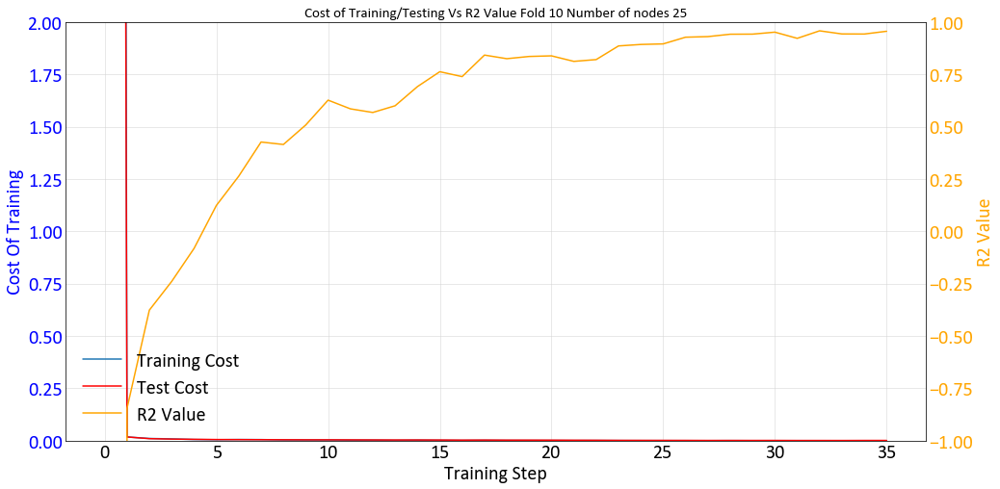

Working on Node 30 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpen8niui3', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002050DAB4F60>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.0018221414065919816
Cost_test : 0.0035057315
R^2:0.739824080467224
Epoch: 1200/5000 err = 0.0012513259891420603
Cost_test : 0.003120239
R^2:0.7635119438171387
Epoch: 1300/5000 err = 0.0017332729650661348
Cost_test : 0.003029473
R^2:0.806225311756134
Epoch: 1400/5000 err = 0.0015633208793587982
Cost_test : 0.0028391955
R^2:0.7672632932662964
Epoch: 1500/5000 err = 0.0010975184035487474
Cost_test : 0.00270307
R^2:0.7937878012657165
Epoch: 1600/5000 err = 0.0007607899489812553
Cost_test : 0.0024948586
R^2:0.7959095597267151
Epoch: 1700/5000 err = 0.0006618499173782767
Cost_test : 0.0023062506
R^2:0.9312914729118348
Epoch: 1800/5000 err = 0.0005731627868954092
Cost_test : 0.0017728102
R^2:0.8823455095291137
Epoch: 1900/5000 err = 0.000519844115478918
Cost_test : 0.0014476943
R^2:0.9171260833740235
Epoch: 2000/5000 err = 0.0004055183206219226
Cost_test : 0.0012079115
R^2:0.9225003600120544
Epoch: 2100/5000 err = 0.00037486008659470826
Cost_test : 0.0012325221
R^2:0.

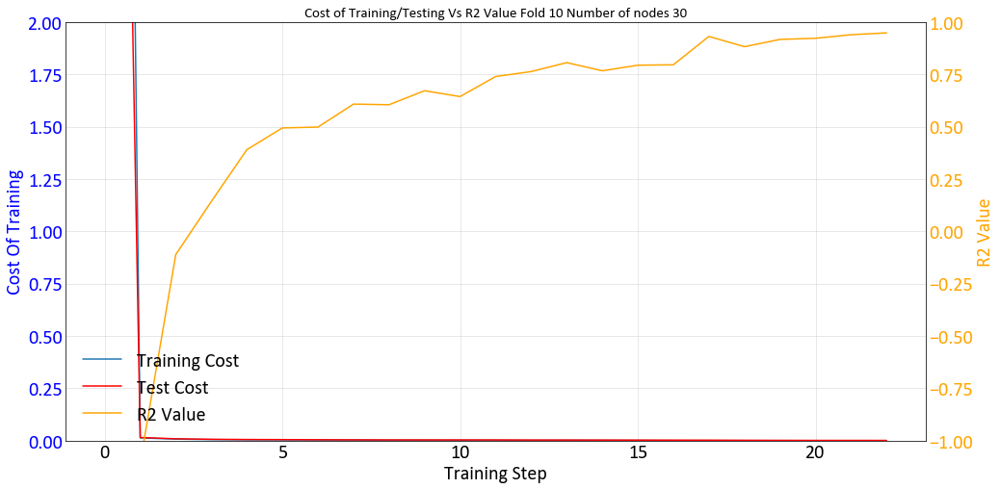

Working on Node 35 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmp5u96hcij', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x0000020514D1EF60>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.0021782176801934837
Cost_test : 0.0039470233
R^2:0.5633917689323426
Epoch: 1200/5000 err = 0.0031334370374679565
Cost_test : 0.0036933897
R^2:0.5857804656028747
Epoch: 1300/5000 err = 0.0017435653368011116
Cost_test : 0.0035677145
R^2:0.6606411218643189
Epoch: 1400/5000 err = 0.0022939747199416157
Cost_test : 0.0031853858
R^2:0.5757852554321289
Epoch: 1500/5000 err = 0.0023363654967397452
Cost_test : 0.0029566693
R^2:0.7467645287513733
Epoch: 1600/5000 err = 0.0014515851391479373
Cost_test : 0.0029732797
R^2:0.7071234583854675
Epoch: 1700/5000 err = 0.0018360415706411004
Cost_test : 0.0026680974
R^2:0.803155505657196
Epoch: 1800/5000 err = 0.0014609550358727573
Cost_test : 0.00259536
R^2:0.7170250892639161
Epoch: 1900/5000 err = 0.001229809457436204
Cost_test : 0.0026911835
R^2:0.8722022891044616
Epoch: 2000/5000 err = 0.0009893334005028009
Cost_test : 0.0025282376
R^2:0.7930974364280701
Epoch: 2100/5000 err = 0.0008982912055216729
Cost_test : 0.0023903362
R^2:

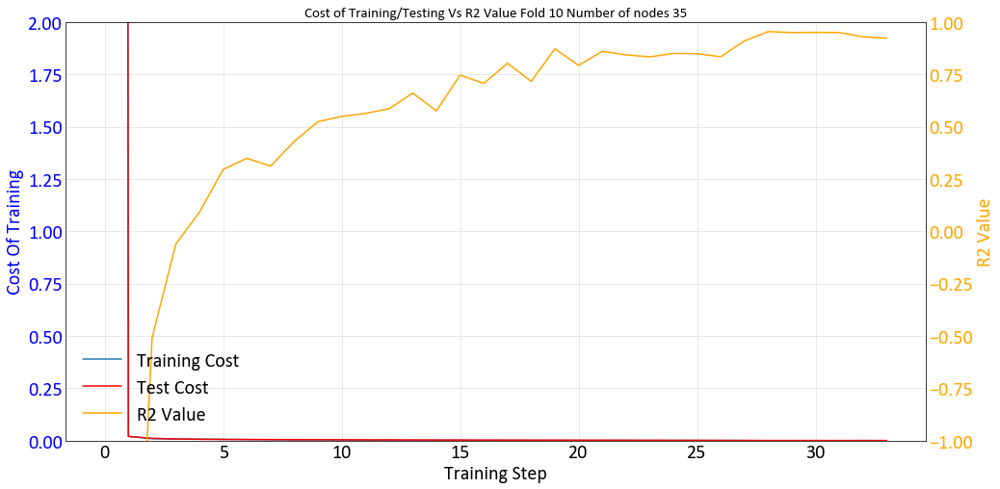

Working on Node 50 fold 10 
INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Matt\\AppData\\Local\\Temp\\tmpkntfj3r8', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_service': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x000002051077B780>, '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}
INFO:tensorflow:Calling model_fn.
INFO:tensorflow:Done calling model_fn.
IN

Epoch: 1100/5000 err = 0.0016584233380854132
Cost_test : 0.00288041
R^2:0.7341322183609009
Epoch: 1200/5000 err = 0.0019691647961735726
Cost_test : 0.0026328135
R^2:0.7610739946365357
Epoch: 1300/5000 err = 0.0015372551046311856
Cost_test : 0.0024991815
R^2:0.7563759684562683
Epoch: 1400/5000 err = 0.0012625343631953
Cost_test : 0.0023523336
R^2:0.8531985044479371
Epoch: 1500/5000 err = 0.00114315910032019
Cost_test : 0.0023990474
R^2:0.8207541346549988
Epoch: 1600/5000 err = 0.0009470309712924063
Cost_test : 0.0020016674
R^2:0.8445946931838988
Epoch: 1700/5000 err = 0.0008090183837339282
Cost_test : 0.0018916691
R^2:0.8101998329162597
Epoch: 1800/5000 err = 0.0007976811903063208
Cost_test : 0.001738745
R^2:0.8993367075920105
Epoch: 1900/5000 err = 0.00048730364651419225
Cost_test : 0.0015963783
R^2:0.9119167327880859
Epoch: 2000/5000 err = 0.000484442466404289
Cost_test : 0.0015335234
R^2:0.9274284601211548
Epoch: 2100/5000 err = 0.0003987367264926434
Cost_test : 0.0013188331
R^2:0.94

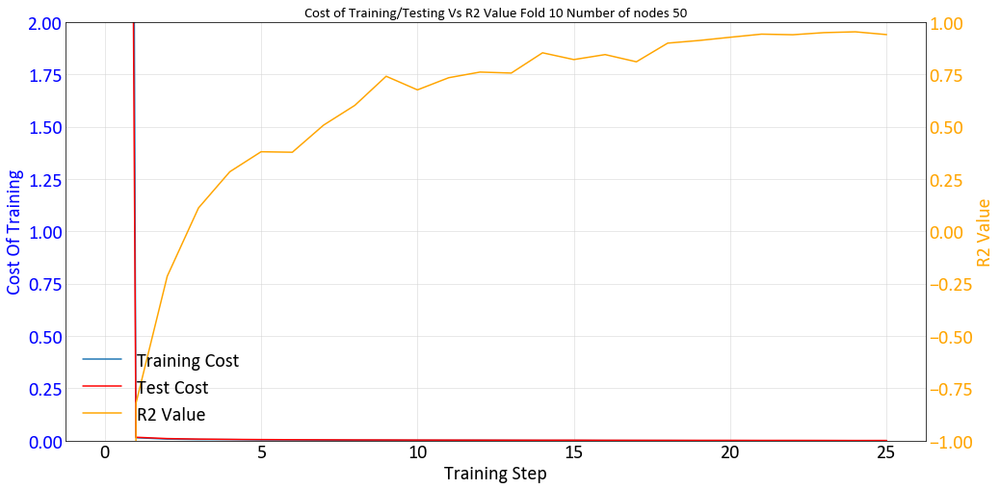

In [28]:
from sklearn.model_selection import KFold
fold_num= 0
for bs in range(1,11):
    fold_num += 1
    datasamplefl = gs.DataFile('dhs_{}.out'.format(fold_num),griddef=griddef)
    datasamplefl = pd.DataFrame(datasamplefl.data, dtype = np.float32)
    del datasamplefl['Drill ID']
    del datasamplefl['MD']
    del datasamplefl['Block ID']
    datasamplefl['Z'] = datasamplefl['Z']
    #Prediction Grid
    x,y,z = griddef.gridcoord()
    #DH Sample Data
    datatest = np.asarray(datasamplefl)
    min_val = np.min(datatest[:,3])
    max_val = np.max(datatest[:,3])
    print(min_val)
    print(max_val)
    datatest[:,3] = (datatest[:,3]-min_val)/(max_val-min_val)
    data_x = np.hstack((x.reshape(len(x),1),y.reshape(len(y),1),z.reshape(len(z),1)))/100
    columns = ['X','Y','Z','value']
    n_batch = 5
    RFB_type = 'Gaussian'
    for fold in range(1,2):
        print(fold_num)
        #print("TRAIN:", train_index, "TEST:", test_index)
        data_train, data_test,target_train, target_test = train_test_split(datatest[:,0:3]/100,datatest[:,3:4],test_size=0.20)
        gs.write_gslib(pd.DataFrame(np.hstack((data_train*100,target_train*(max_val-min_val)+min_val)),columns=columns), './data/data_train_{}.dat'.format(fold_num))
        gs.write_gslib(pd.DataFrame(np.hstack((data_test*100,target_test*(max_val-min_val)+min_val)),columns=columns), './data/data_test_{}.dat'.format(fold_num))
        row = 0
        NN = 'ERBFN' # RBFN or GRNN or 'EBFN'
        data_type = 'Continuous' # Continuous or Categorical
        test_nodes = [20,25,30,35,50]
        pred_all = np.zeros((len(test_nodes)*data_x.shape[0],target_train.shape[1]))
        pred_all_row = np.zeros((data_x.shape[0],target_train.shape[1],len(test_nodes)))
        info_matrix = np.zeros((len(test_nodes),8))
        for nodes in test_nodes:
            c_t = []
            c_test = []
            c_r2 = []
            start_time = time.time()
            print("Working on Node {} fold {} ".format(nodes,fold_num))
            k = nodes
            data_trainpd = pd.DataFrame(data_train)
            data = data_trainpd

            with tf.device('/device:CPU:0'):
                #clustering
                def input_fn():
                  return tf.train.limit_epochs(
                      tf.convert_to_tensor(data_train, dtype=tf.float32), num_epochs=1)

                kmeans = tf.contrib.factorization.KMeansClustering(
                    num_clusters=nodes, use_mini_batch=False)


                # train
                num_iterations = 10
                previous_centers = None
                for _ in range(num_iterations):
                  kmeans.train(input_fn)
                  cluster_centers = kmeans.cluster_centers()
                  #if previous_centers is not None:
                    #print('delta:', cluster_centers - previous_centers)
                  previous_centers = cluster_centers
                  #print('score:', kmeans.score(input_fn))
                #print('cluster centers:', cluster_centers)


            with tf.device('/device:GPU:0'):
                from tensorflow.python.framework import ops
                ops.reset_default_graph()


                RANDOM_SEED = 42
                tf.set_random_seed(RANDOM_SEED)

                N_INSTANCES = np.shape(data_train)[0]
                N_INPUT = data_train.shape[0]
                N_FEATURE = data_train.shape[1]
                N_CLASSES = target_train.shape[1]
                TRAIN_SIZE = int(N_INSTANCES)
                batch_size = int(np.shape(data_train)[0]/n_batch)
                training_epochs = 5000
                if nodes >= 2:
                    training_epochs = 5000
                if nodes >= 25:
                    training_epochs = 5000
                if nodes >= 100:
                    training_epochs = 5000
                if nodes >= 1000:
                    training_epochs = 5000
                learning_rate = 0.01
                epsilon = 0.001
                display_step = 100
                hidden_size = nodes

                target_ = np.zeros((N_INSTANCES, N_CLASSES))
                extra_update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

                x_data = tf.placeholder(shape=[None, N_FEATURE], dtype=tf.float32, name = 'Features')
                y_target = tf.placeholder(shape=[None, N_CLASSES], dtype=tf.float32, name = 'Known_Values')


                dist = np.zeros((k,k))
                for i in range (0,k):
                    for j in range (0,k):
                        dist[i:j] = distance.euclidean(cluster_centers[i], cluster_centers[j])
                        maxdist = dist.max()
                sigma = maxdist/np.sqrt(2*k)
                if nodes == 1 :
                    beta = 0.2
                else:        
                    beta = 1/math.pow(2*sigma,2)

                #EBFN
                if NN == 'ERBFN':
                    def rbf_network(input_layer, cluster_centers ,weights):

                        exp_list= []
                        with tf.name_scope('Cluster_Centers'):
                            yy = weights['cluster_centers']

                        with tf.name_scope('Input_Layer'):
                            input_layer

                        for i in range(nodes):
                            with tf.name_scope('Covariance_Matrix'):
                                vv = weights['cov_mat'][:,:,i]
                                symA = 0.5 * tf.math.add(vv , tf.transpose(vv))

                            with tf.name_scope('Mahalanobis_Distance'):
                                cc_i = yy[i]

                                diff = tf.subtract(input_layer, cc_i , name = 'subtract')

                                dt = tf.transpose(diff,name = 'Transpose')

                                M1 = tf.matmul(diff,symA,name = 'M1')

                                M2 = tf.matmul(M1,dt,name = 'M2')

                                sqrt = tf.math.sqrt(tf.math.abs(M2),name = 'sqrt')

                                diag = tf.linalg.tensor_diag_part(sqrt,name = 'diag') 

                            with tf.name_scope('Gaussian_Activation_Layer'):
                                gauss_f = tf.math.exp((-tf.math.pow((weights['beta'][:,i]*diag), 2)))
                                exp_list.append(gauss_f)

                        with tf.name_scope('Output_Layer'):        
                            layer2_act = tf.stack(exp_list)   
                            output = tf.add(tf.matmul(layer2_act, weights['output'],transpose_a=True,name = 'mult_layer2_by_weights'), bias['output'], 
                                        name = 'add_bias_to_output')     
                        return output


                weights = {
                    'h1': tf.Variable(tf.ones([N_FEATURE, N_FEATURE,nodes]), name = 'layer1_dims'),
                    'output': tf.Variable(tf.ones([nodes, N_CLASSES]), name = 'layer2_output_Weights'),
                    'cov_mat': tf.Variable(tf.ones(shape = [N_FEATURE,N_FEATURE,nodes]), name = 'cov'),
                    'beta' : tf.Variable(tf.constant(beta,shape = [1,nodes]) ,name = 'beta'),            
                    'cluster_centers' : tf.Variable(tf.constant(np.asarray(cluster_centers).reshape(nodes,N_FEATURE),
                                        shape = [nodes,N_FEATURE]), name = 'cluster_center')
                }

                bias = {
                    'output' : tf.Variable([0],name='output_bias',dtype=tf.float32)  
                }


                pred = rbf_network(x_data, cluster_centers ,weights)

                if data_type == 'Continuous':
                    with tf.name_scope('cost'):
                        cost = tf.reduce_mean(tf.square(pred - y_target))
                        #cost = tf.math.reduce_sum(tf.square(pred - y_target)) 
                        my_opt = tf.train.AdamOptimizer(learning_rate,beta1=0.5).minimize(cost)  
                        tf.summary.scalar('cost', cost)

                    with tf.name_scope('accuracy'):
                        total_error = tf.reduce_sum(tf.square(tf.subtract(y_target, tf.reduce_mean(y_target))))
                        unexplained_error = tf.reduce_sum(tf.square(tf.subtract(y_target, pred)))
                        accuracy = tf.subtract(1.00, tf.divide(unexplained_error, total_error))

                if data_type == 'Categorical':
                    with tf.name_scope('cost'):
                        if N_CLASSES == 1:
                            cost = tf.reduce_mean(tf.square(tf.round(pred) - y_target)) 
                        else:
                            cost = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels = y_target, logits = pred))
                        my_opt = tf.train.AdamOptimizer(learning_rate).minimize(cost) 
                        tf.summary.scalar('cost', cost)

                    with tf.name_scope('accuracy'):
                        correct_prediction = tf.equal(tf.round(pred), y_target)
                        accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))


    #             tf.summary.histogram("cov_mat", weights['cov_mat'])
    #             tf.summary.histogram("Weights_Output_Layer", weights['output'])
    #             tf.summary.histogram("Bias_Output_Layer", bias['output'])




                init = tf.global_variables_initializer()
                sess = tf.InteractiveSession(config=tf.ConfigProto(log_device_placement=True))
                merged = tf.summary.merge_all()
                saver = tf.train.Saver()
                writer = tf.summary.FileWriter('./test',sess.graph)
                sess.run(init)
                tol = 0.00001
                epoch, err, acc=0, 1, 0
                # Training loop
                #saver.restore(sess,'./spatial/test_dataset_{}.ckpt'.format(nodes))
                while epoch <= training_epochs and err >= tol and acc <= 0.97:

                    avg_cost = 0.
                    acc = 0.
                    total_batch = int(data_train.shape[0] / batch_size)
                    for i in range(total_batch):
                        randidx = np.random.randint(int(TRAIN_SIZE), size=batch_size)
                        batch_xs = data_train[randidx , :]
                        batch_ys = target_train[randidx , :]
                        sess.run(my_opt, feed_dict={x_data: batch_xs, y_target: batch_ys})
                        avg_cost += sess.run(cost, feed_dict={x_data: batch_xs, y_target: batch_ys})/total_batch
                        acc += sess.run(accuracy, feed_dict={x_data: batch_xs, y_target: batch_ys})/total_batch
                    err = avg_cost
                    if epoch % 100 == 0:
                        #summary = sess.run([merged],feed_dict={x_data: batch_xs, y_target: batch_ys})
                        #writer.add_summary(summary,epoch)
                        print("Epoch: {}/{} err = {}".format(epoch, training_epochs, avg_cost))
                        print('Cost_test :',sess.run(cost, feed_dict={x_data:data_test,y_target:target_test}))
                        c_t.append(avg_cost)
                        c_test.append(sess.run(cost, feed_dict={x_data:data_test,y_target:target_test}))
                        c_r2.append(acc)
                        if data_type == 'Categorical': 
                            print("Accuracy:{}".format(acc))
                        else:
                            print("R^2:{}".format(acc))    

                    epoch +=1

                print ("End of learning process")
                print ("Final epoch = {}/{} ".format(epoch, training_epochs))
                print ("Final error = {}".format(err) )
                print ("Final R^2 = {}".format(acc) )
                saver.save(sess,'./spatial/test_dataset_{}_{}.ckpt'.format(nodes,fold_num))
                w = np.vsplit(data_x,500)[0].shape[0]
                pred1 = np.zeros((data_x.shape[0],N_CLASSES))
                for i in range(0,500):
                    pred1[i*w:(1+i)*w,0:N_CLASSES] = (sess.run(pred, feed_dict={x_data:np.vsplit(data_x,500)[i]}))*(max_val-min_val)+min_val
                    pred_all[i*w+(row*data_x.shape[0]):(1+i)*w+(row*data_x.shape[0]),0:N_CLASSES] = pred1[i*w:(1+i)*w,0:N_CLASSES]
                    pred_all_row[i*w:(1+i)*w,0:N_CLASSES,row] = pred1[i*w:(1+i)*w,0:N_CLASSES]

                writer = tf.summary.FileWriter("sess_graph", sess.graph)
                saver.save(sess,'test/test_dataset_{}_{}.ckpt'.format(nodes,fold_num))
                sess.close() 

                gs.write_gslib(pd.DataFrame(pred1), './predictions/real_{}_{}.dat'.format(nodes,fold_num))

                info_matrix[row,0] = k
                info_matrix[row,1] = beta
                info_matrix[row,2] = 0 #r2_score(sgsimfl['value'],pred1)
                info_matrix[row,3] = np.mean(pred1)
                info_matrix[row,4] = np.var(pred1)
                info_matrix[row,5] = 0 #mean_squared_error(sgsimfl['value'],pred1)
                info_matrix[row,6] = err
                info_matrix[row,7] = (time.time() - start_time) 
                row +=1
                tf.InteractiveSession.close(sess)
            print(info_matrix)
            SMALL_SIZE = 15
            plt.rc('font', size=SMALL_SIZE)
            plt.rc('axes', titlesize=SMALL_SIZE)
            f, (ax1) = plt.subplots(1, 1,figsize=(16, 8))
            ax1.set_ylim([0,2])
            ax1.plot(range(len(c_t)), c_t, label ='Training Cost')
            ax1.plot(range(len(c_t)), c_test, color="red",label ='Test Cost')
            ax1.set_xlabel('Training Step')
            ax1.grid(True)
            ax1.set_title('Cost of Training/Testing Vs R2 Value Fold {} Number of nodes {}'.format(fold_num,nodes))
            ax1.set_ylabel('Cost Of Training', color='blue')
            ax1.tick_params(axis='y', labelcolor='blue')
            ax2 = ax1.twinx()
            ax2.plot(range(len(c_t)), c_r2,'-',color="orange",label ='R2 Value')
            ax2.set_ylim([-1,1])
            ax2.set_ylabel('R2 Value', color='orange')
            ax2.tick_params(axis='y', labelcolor='orange')
            lines, labels = ax1.get_legend_handles_labels()
            lines2, labels2 = ax2.get_legend_handles_labels()
            ax2.legend(lines + lines2, labels + labels2, loc=3)
            plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Training_R2_ERBFN_{}_{}_{}.png'.format(nodes,fold_num,plt_extent))
            plt.show()


        ensemble = numpy.nanmean(pred_all_row, axis = 2)
        gs.write_gslib(pd.DataFrame(ensemble), './predictions/ensemble_{}.dat'.format(fold_num))
        gs.write_gslib(pd.DataFrame(pred_all), './predictions/all_real_{}.dat'.format(fold_num))

In [29]:
declusstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}         -file with data
{xyzcol}   {varcol}               -  columns for X, Y, Z, and variable
-1.0e21     1.0e21          -  trimming limits
declus/declus_{fold}.sum                  -file for summary output
declus/declus_{fold}.out                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
50  25  110.0               -number of cell sizes, min size, max size
100                           -number of origin offsets
"""
varcparstr = """                  Parameters for VARCALC
                  **********************
 
START OF PARAMETERS:
{datafl}                 -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1   {varcol}                            -   number of variables,column numbers (position used for tail,head variables below)
-99.0    1.0e21                  -   trimming limits
3                                 -number of directions
135 15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
45 15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0. 22.5 200 90.0 22.5 200 0.0   -Dir 03: azm,azmtol,bandhorz,dip,
 20  10  5                 -        number of lags,lag distanc
./vargs/varcalc_{fold}.out                       -file for experimental variogram points output.
0                                 -legacy output (0=no, 1=write out gamv2004 format)
1                                 -run checks for common errors
1                                 -standardize sills? (0=no, 1=yes)
1                                 -number of variogram types
1   1   1   ?                     -tail variable, head variable, variogram type (and cutoff/category), sill



NOTES ON VARIOGRAM CALCULATION:
1) By default, varcalc runs checks for common errors in parameter choices. This can be
   disabled if desired. 
2) Varcalc can standardize using a provided sill (such as a declustered variance).
   For example, if variable 1 has a declustered variance of 8.6, the traditional
   semivariogram could be standardized by setting the variogram type to:
      1  1  1  8.6
   Alternatively, varcalc can attempt to infer a sill for standardizing by setting
   the variogram type to:
      1  1  1  ?
   The calculated sills will be written to the console. 
3) Variogram types are the same as in GSLIB:
      1 = traditional semivariogram
      2 = traditional cross semivariogram
      3 = covariance   (-3 calculates variance (provided sill) -covariance)
      4 = correlogram  (-4 calculates 1-correlation)
      5 = general relative semivariogram
      6 = pairwise relative semivariogram
      7 = semivariogram of logarithms
      8 = semimadogram
      9 = indicator semivariogram - continuous  - requires a cutoff
      10= indicator semivariogram - categorical - requires a category
4) For indicator variograms, the variogram cutoff/categories are specified immediately after the variogram type
    1   1   9   1.0   ?               -tail variable, head variable, variogram type (and cutoff/category), sill
5) If desired, the program can write out the variogram points in the gamv2004 style
   for compatibility with older versions. Tilt was not supported in pre-varcalc experimental variogram
   programs so use carefully. 
"""
varmparstr = """                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
./vargs/varmodel_{fold}.out                 -file for modeled variogram points output
3                            -number of directions to model points along
    135.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    45.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.001:0.01                   -nst, nugget effect
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        200:300  100:300  50:300    -a_hmax, a_hmin, a_vert (ranges)
1   100000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
{varcalc}                  -    experimental output file 1
3   1  2  3                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
./vargs/varmodel_{fold}.var              -  file to save fit variogram model
"""
kt3dnparstr = """                 Parameters for KT3DN
                 ********************
START OF PARAMETERS:
{datafl}             -file with data
0  {xyzcol} {varcol}  0                 -  columns for DH,X,Y,Z,var,sec var
-998.0    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
kt3dn.dbg-nkt3dn.sum             -file for debugging output (see note)
./predictions/kt3dn_{fold}.out                        -file for kriged output (see GSB note)
{griddef}
1    1      1                    -x,y and z block discretization
25    50    12    1               -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
500.0  500.0  250.0              -maximum search radii
135.0  0.0   0.0                 -angles for search ellipsoid
0                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
{mean} 0.6  0.8                  -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
extdrift.out                     -gridded file with drift/mean
4                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varg}
"""

In [30]:
varcalc = gs.Program('varcalc')
varmodel = gs.Program('varmodel')
kt3dn = gs.Program('kt3dn')
declus = gs.Program('declus') 
for fold in range(1,11):
    Traindat = gs.DataFile('dhs_{}.out'.format(fold),griddef=griddef)

    declus.run(declusstr.format(datafl = Traindat.flname,
                         xyzcol = Traindat.gscol(Traindat.xyz),
                         varcol = Traindat.gscol('value'),
                         fold = fold))
    
    declus_mean = np.min(np.asarray(gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Declustered Mean'][gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Cell Size']>0.0]))

    
    
    varcalc.run(varcparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             fold = fold,
                             ldist =(50 + (fold-1)*10),
                             ltol =(50 + (fold-1)*10)/2))

    varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))

   
    varmodel.run(varmparstr.format(varcalc = varcalcfl.flname,
                                 fold = fold))

    varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))

    f = open("./vargs/varmodel_{}.var".format(fold), "r")
    varg = f.readlines()
    f.close()
    varg = ''.join(varg)
    
    kt3dn.run(kt3dnparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             griddef = griddef,
                             varg = varg,
                             fold = fold,
                             mean = declus_mean))

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_1.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_1.sum                     
 output file = declus/declus_1.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are     1176 data with:
  mean value            =      1.04668
  minimum and maximum   =      0.64360     1.81540
  size of data vol in X =    450.00000
  size of data vol in Y =    450.00000
  size of data vol in Z =    230.00000

  declustered mean      =      1.04656
  min and max weight    =      0.93066     1.58489
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.
Calling:  ['varcalc', 'temp']

varcalc version:  1.400

  data file: dhs_1.out
  x,

 Final objective value =   5.055866542882435E-004
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.100

  data file = dhs_2.out                               
  columns =            0           2           3           4           7
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./predictions/kt3dn_2.out               
  nx, xmn, xsiz =           50   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

 Working on the kriging 
   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_4.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_4.sum                     
 output file = declus/declus_4.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are     1176 data with:
  mean value            =      1.13412
  minimum and maximum   =      

Calling:  ['varmodel', 'temp']

varmodel version: 1.1.1

  output points file: ./vargs/varmodel_5.out
  number of directions to model points along:            3
  azm, dip, npoints, pointsep:    135.000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:    45.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-003  1.000000000000000E-002
  fit model?            1      100000
  number of variogram files:            1
  variogram file: ./vargs/varcalc_5.out
  using variograms            1           2           3
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output fil

 Final objective value =   4.988281017525595E-003
  Modeling points

varmodel completed successfully

Calling:  ['kt3dn', 'temp']

 KT3DN Version: 7.100

  data file = dhs_6.out                               
  columns =            0           2           3           4           7
           0
  trimming limits =   -998.000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./predictions/kt3dn_6.out               
  nx, xmn, xsiz =           50   5.00000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = dhs_8.out                               
 columns =            2           3           4           7
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = declus/declus_8.sum                     
 output file = declus/declus_8.out                     
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           50       25.000000      110.000000
 offsets =          100


There are     1176 data with:
  mean value            =      1.17523
  minimum and maximum   =      0.04830    17.63230
  siz

  output points file: ./vargs/varmodel_9.out
  number of directions to model points along:            3
  azm, dip, npoints, pointsep:    135.000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:    45.0000000000000       0.000000000000000E+000
        1000  0.500000000000000     
  azm, dip, npoints, pointsep:   0.000000000000000E+000   90.0000000000000     
        1000  0.500000000000000     
  nst =           1
 c0 constrained to  1.000000000000000E-003  1.000000000000000E-002
  fit model?            1      100000
  number of variogram files:            1
  variogram file: ./vargs/varcalc_9.out
  using variograms            1           2           3
  # pairs wt, inv dist wt, min pairs:            1           1          10
  fixhmaxvert,hmaxvert:            0   10.0000000000000     
  fixhminhmax,hminhmax:            0   1.00000000000000     
  variogram model output file: ./vargs/varmodel_9.var
 Reading experimental variogram

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.100 Finished



FileNotFoundError: dhs_11.out does not exist!

In [4]:
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
import warnings
warnings.simplefilter('ignore')
from scipy.ndimage import gaussian_filter

In [23]:
declusstr = """                  Parameters for DECLUS
                  *********************

START OF PARAMETERS:
{datafl}         -file with data
{xyzcol}   {varcol}               -  columns for X, Y, Z, and variable
-1.0e21     1.0e21          -  trimming limits
./declus/declus_{fold}.sum                  -file for summary output
./declus/declus_{fold}.out                  -file for output with data & weights
1.0   1.0                   -Y and Z cell anisotropy (Ysize=size*Yanis)
0                           -0=look for minimum declustered mean (1=max)
99  10.0  110.0               -number of cell sizes, min size, max size
100                           -number of origin offsets
"""

varcparstr = """                  Parameters for VARCALC
                  **********************
 
START OF PARAMETERS:
{datafl}                 -file with data
{xyzcol}                         -   columns for X, Y, Z coordinates
1   {varcol}                            -   number of variables,column numbers (position used for tail,head variables below)
-99.0    1.0e21                  -   trimming limits
3                                 -number of directions
135 15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
45 15 200 0.0 22.5 200 0.0   -Dir 01: azm,azmtol,bandhorz,dip,dipt
 20  {ldist}  {ltol}                 -        number of lags,lag distanc
0. 22.5 200 90.0 22.5 200 0.0   -Dir 03: azm,azmtol,bandhorz,dip,
 20  10  5                 -        number of lags,lag distanc
./vargs/varcalc_{fold}.out                       -file for experimental variogram points output.
0                                 -legacy output (0=no, 1=write out gamv2004 format)
1                                 -run checks for common errors
1                                 -standardize sills? (0=no, 1=yes)
1                                 -number of variogram types
1   1   1   ?                     -tail variable, head variable, variogram type (and cutoff/category), sill
"""
varmparstr = """                  Parameters for VARMODEL
                  ***********************
 
START OF PARAMETERS:
./vargs/varmodel_{fold}.out                 -file for modeled variogram points output
3                            -number of directions to model points along
    135.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    45.0  00.0  1000   0.5      -  azm, dip, npoints, point separation
    0.0  90.0  1000   0.5      -  azm, dip, npoints, point separation
1    0.001:0.01                   -nst, nugget effect
3    0.99    135   0.0   0.0    -it,cc,azm,dip,tilt (ang1,ang2,ang3)
        200:300  100:300  50:300    -a_hmax, a_hmin, a_vert (ranges)
0   100000                   -fit model (0=no, 1=yes), maximum iterations
1.0                          -  variogram sill (can be fit, but not recommended in most cases)
1                            -  number of experimental files to use
{varcalc}                  -    experimental output file 1
0                    -      # of variograms (<=0 for all), variogram #s
1   1   10                   -  # pairs weighting, inverse distance weighting, min pairs
0     10.0                   -  fix Hmax/Vert anis. (0=no, 1=yes)
0      1.0                   -  fix Hmin/Hmax anis. (0=no, 1=yes)
./vargs/varmodel_{fold}.var              -  file to save fit variogram model
"""
kt3dnparstr = """                 Parameters for KT3DN
                 ********************
START OF PARAMETERS:
{datafl}              -file with data
0  {xyzcol}  {varcol}  {seisnscol}                 -  columns for DH,X,Y,Z,var,sec var
-99    1.0e21                 -  trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100   0                     -debugging level: 0,3,5,10; max data for GSKV;output total weight of each data?(0=no,1=yes)
kt3dn.dbg-nkt3dn.sum             -file for debugging output (see note)
./ML+ICCK/kt3dn_{fold}.out                        -file for kriged output (see GSB note)
{griddef}
1    1      1                    -x,y and z block discretization
10    50    12    1               -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
500  500  500              -maximum search radii
 135   0   0.0                 -angles for search ellipsoid
7                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift,6=ICCK
0  {corr}  0.8                  -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
{seisfl}                     -gridded file with drift/mean
{seiscol}                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
{varg}
"""

In [24]:
varcalc = gs.Program('varcalc')
varmodel = gs.Program('varmodel')
kt3dn = gs.Program('kt3dn')
declus = gs.Program('declus')   

griddef2 = gs.GridDef(gridfl='griddef2.txt')

for fold in range(1,11):
    
    sesi_data = gs.DataFile('predictions\ensemble_{}.dat'.format(fold))
    
    sesi_data = gaussian_filter((sesi_data.data['0']),sigma = 0)
    
    gs.write_gslib(pd.DataFrame(sesi_data),'predictions\smooth_ensemble_{}.dat'.format(fold))
    
    sesi_data = gs.DataFile('predictions\smooth_ensemble_{}.dat'.format(fold))
    
    Traindat = gs.DataFile('./data/data_train_{}.dat'.format(fold))
    
    declus.run(declusstr.format(datafl = Traindat.flname,
                         xyzcol = Traindat.gscol(Traindat.xyz),
                         varcol = Traindat.gscol('value'),
                         fold = fold))
    
    Testdat = gs.DataFile('declus/declus_{}.out'.format(fold),griddef=griddef)
    
    idx,ingrid = griddef.coord_to_index1d(x=Testdat.data['X'],y=Testdat.data['Y'],z=Testdat.data['Z'])
    
    Testdat['sesi_data'] = sesi_data.data['0'][idx].values
    
    gs.write_gslib(Testdat,'./data/data_test_NS_{}.dat'.format(fold))
    
    Testdat = gs.DataFile('./data/data_test_NS_{}.dat'.format(fold))   
    
    
    idx,ingrid = griddef.coord_to_index1d(x=Traindat.data['X'],y=Traindat.data['Y'],z=Traindat.data['Z']) 
    
    Traindat['sesi_data'] = sesi_data.data['0'][idx].values
    
    gs.write_gslib(Traindat,'./data/data_train_NS_{}.dat'.format(fold))
    
    Traindat = gs.DataFile('./data/data_train_NS_{}.dat'.format(fold))
    

    
#     Traindat = gs.DataFile('declus.out',griddef=griddef)  
        
#     for i in range(len(Traindat['value'])):
#         if Traindat['sesi_data'].isna()[i] == True:
#             Traindat['sesi_data'][i] = Traindat['value'][i]
            
    gs.write_gslib(Traindat,'./nscore/runfl_{}.out'.format(fold))      

    Traindat = gs.DataFile('nscore/runfl_{}.out'.format(fold),griddef=griddef)
    
    varcalc.run(varcparstr.format(datafl = Traindat.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             fold = fold,
                             ldist =(50 + (fold-1)*10),
                             ltol =(50 + (fold-1)*10)/2))

    varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))

   
    varmodel.run(varmparstr.format(varcalc = varcalcfl.flname,
                                 fold = fold))


    varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))

    f = open('./vargs/varmodel_{}.var'.format(fold), "r")
    varg = f.readlines()
    f.close()
    varg = ''.join(varg)
    
    declus_mean = np.min(np.asarray(gs.DataFile('./declus/declus_{}.sum'.format(fold)).data['Declustered Mean'][gs.DataFile('declus/declus_{}.sum'.format(fold)).data['Cell Size']>0.0]))
    
    kt3dn.run(kt3dnparstr.format(datafl = Traindat.flname,
                                 seisfl = sesi_data.flname,
                             xyzcol = Traindat.gscol(Traindat.xyz),
                             varcol = Traindat.gscol('value'),
                             seiscol = sesi_data.gscol('0'),
                             griddef = griddef2,
                             varg = varg,
                             mean = declus_mean,
                             seisnscol = Traindat.gscol('sesi_data'),
                             corr = np.corrcoef(Traindat.data.dropna()['value'],Traindat.data.dropna()['sesi_data'])[0,1],
                             fold = fold))
    
    
    kt3dnfl = gs.DataFile('./ML+ICCK/kt3dn_{}.out'.format(fold))
    
    kt3dnfl.data['Back Transform'] = kt3dnfl.data['Estimate']
    
    gs.write_gslib(kt3dnfl,'./backtr/backtr_UDDH_{}.out'.format(fold))
    

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_1.dat                 
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_1.sum                   
 output file = ./declus/declus_1.out                   
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      940 data with:
  mean value            =      1.04791
  minimum and maximum   =      0.64360     1.81540
  size of data vol in X =    450.00003
  size of data vol in Y =    450.00003
  size of data vol in Z =    230.00000

  declustered mean      =      1.04783
  min and max weight    =      0.88064     1.34650
  equal weighting       =      1.00000


DECLUS Version: 3.000 Finished

Stop - Program terminated.
Calling:  ['varcalc', 'temp']

varcalc version:  1.400

  data file: nscore/runfl_1

  data file = nscore/runfl_2.out                      
  columns =            0           1           2           3           4
           5
  trimming limits =   -99.0000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./ML+ICCK/kt3dn_2.out                   
  nx, xmn, xsiz =           50   5.01000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz, zmn, zsiz =           25   5.00000000000000        10.0000000000000     
  block discretization:           1           1           1
  ndmin,ndmax =    

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.4.7 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_4.dat                 
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_4.sum                   
 output file = ./declus/declus_4.out                   
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      940 data with:
  mean value            =      1.15393
  minimum and maximum   =      0.17500     6.95980
  siz


 KT3DN Version: 7.4.7

  data file = nscore/runfl_5.out                      
  columns =            0           1           2           3           4
           5
  trimming limits =   -99.0000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./ML+ICCK/kt3dn_5.out                   
  nx, xmn, xsiz =           50   5.01000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz, zmn, zsiz =           25   5.00000000000000        10.0000000000000     
  block discretization:           1           1        

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.4.7 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_7.dat                 
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_7.sum                   
 output file = ./declus/declus_7.out                   
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      940 data with:
  mean value            =      1.16796
  minimum and maximum   =      0.06340    14.83980
  siz

  data file = nscore/runfl_8.out                      
  columns =            0           1           2           3           4
           5
  trimming limits =   -99.0000000000000       1.000000000000000E+021
  kriging option =            0
  jackknife data file = xvk.dat                                 
  columns =            1           2           0           3           0
  data spacing analysis output file = kt3dn_dataspacing.out                   
  debugging level =            0
  summary only file = kt3dn.sum                               
  debugging file = kt3dn.dbg                               
  GSLIB-style output file = ./ML+ICCK/kt3dn_8.out                   
  nx, xmn, xsiz =           50   5.01000000000000        10.0000000000000     
  ny, ymn, ysiz =           50   5.00000000000000        10.0000000000000     
  nz, zmn, zsiz =           25   5.00000000000000        10.0000000000000     
  block discretization:           1           1           1
  ndmin,ndmax =    

   currently on estimate      6250
   currently on estimate     12500
   currently on estimate     18750
   currently on estimate     25000
   currently on estimate     31250
   currently on estimate     37500
   currently on estimate     43750
   currently on estimate     50000
   currently on estimate     56250
   currently on estimate     62500

 KT3DN Version:    7.4.7 Finished

Calling:  ['declus', 'temp']

DECLUS Version: 3.000

 data file = ./data/data_train_10.dat                
 columns =            1           2           3           4
 tmin,tmax =    -1.000000E+21    1.000000E+21
 summary file = ./declus/declus_10.sum                  
 output file = ./declus/declus_10.out                  
 anisotropy =         1.000000        1.000000
 minmax flag =            0
 ncell min max =           99       10.000000      110.000000
 offsets =          100


There are      940 data with:
  mean value            =      1.18026
  minimum and maximum   =      0.03010    23.12500
  siz

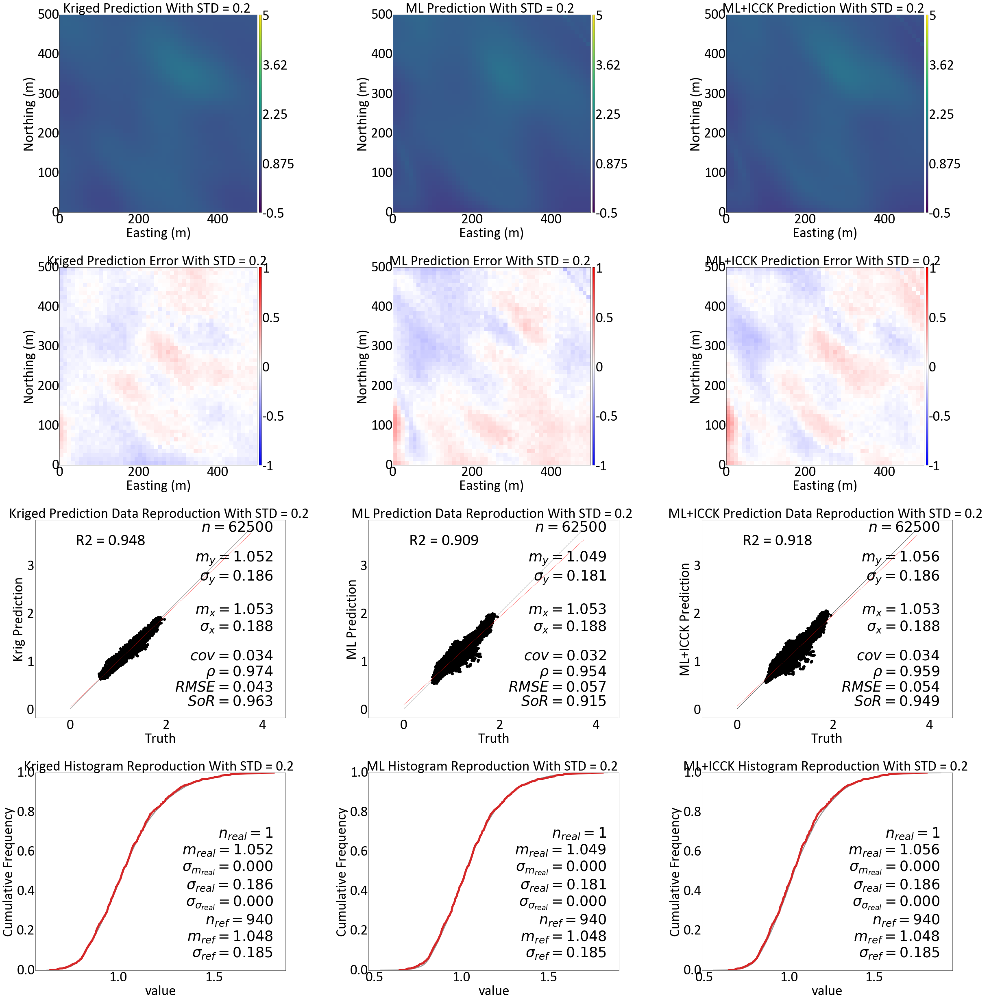

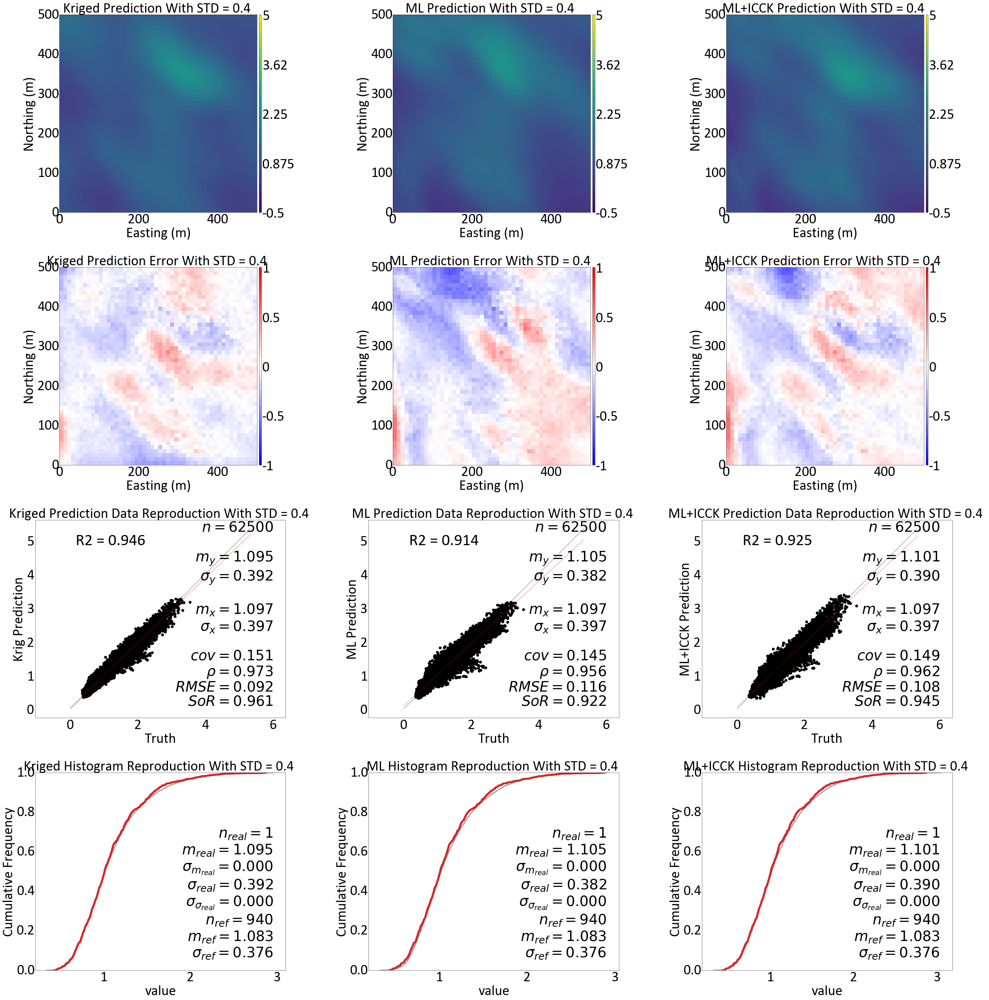

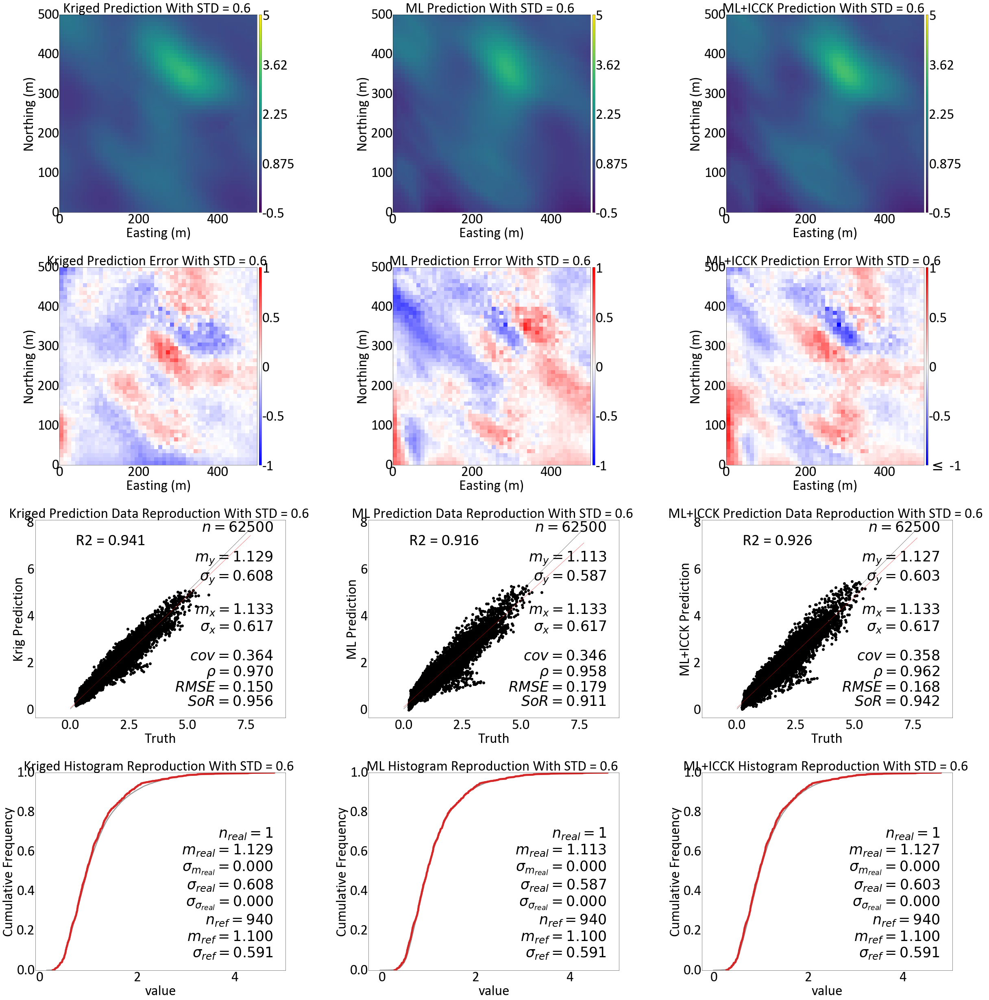

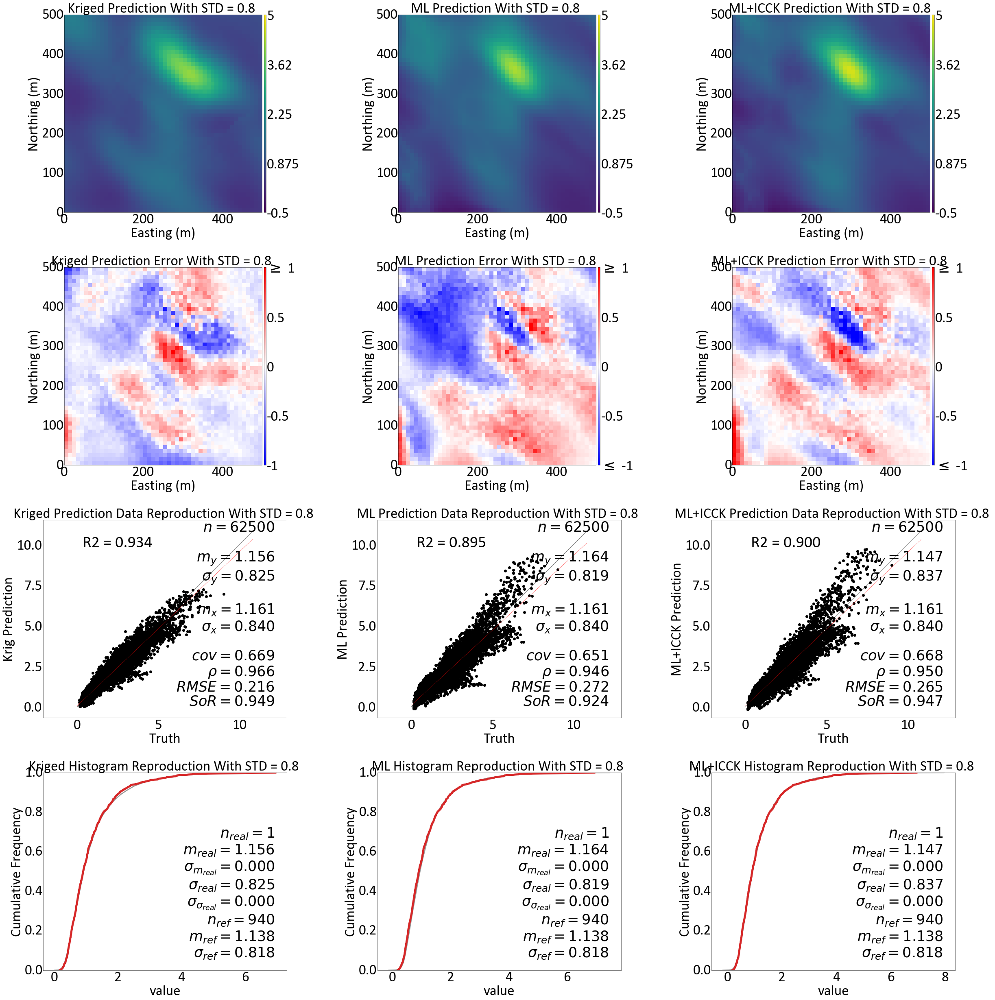

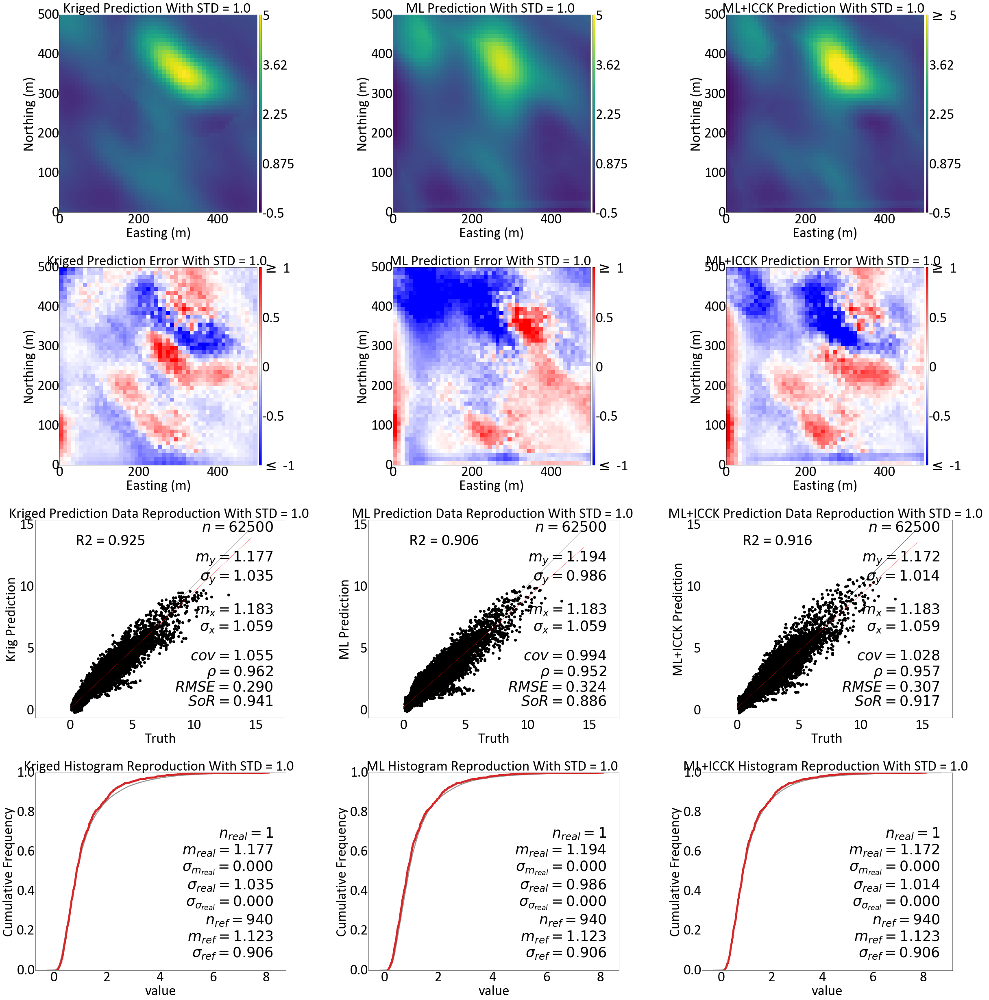

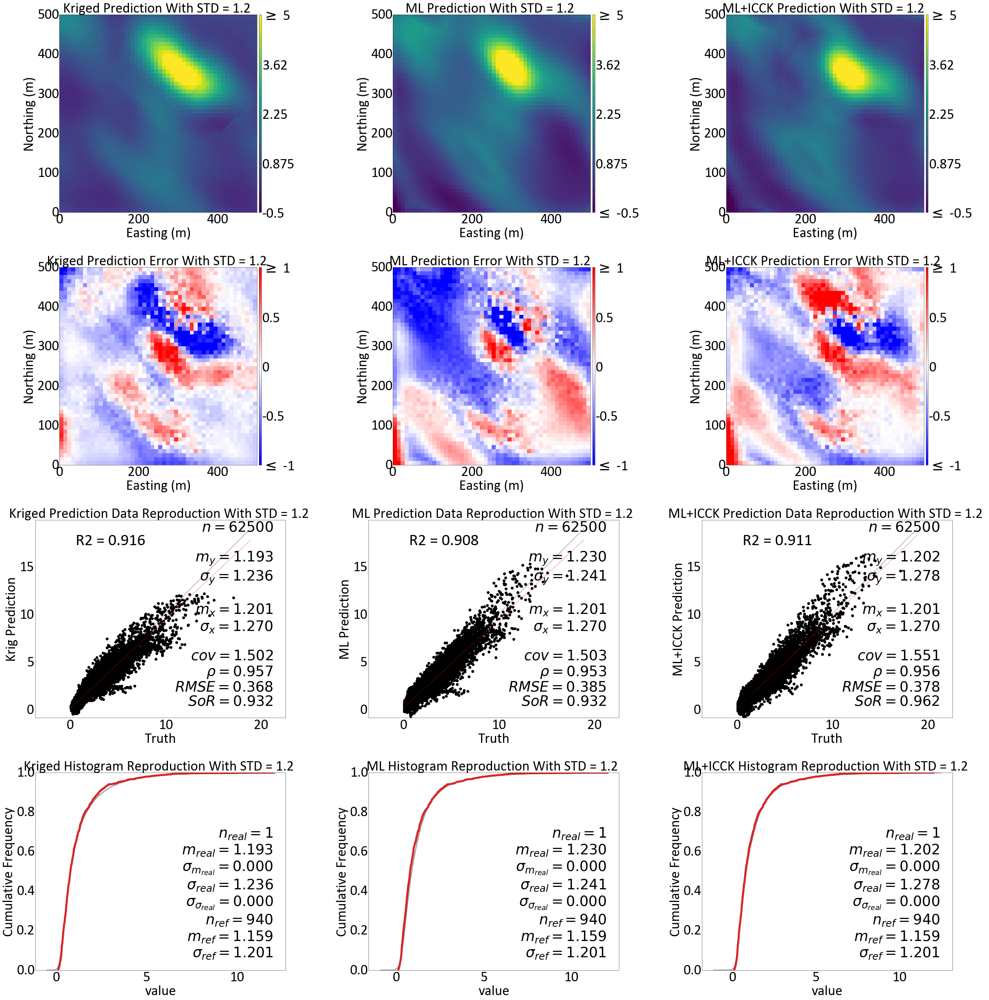

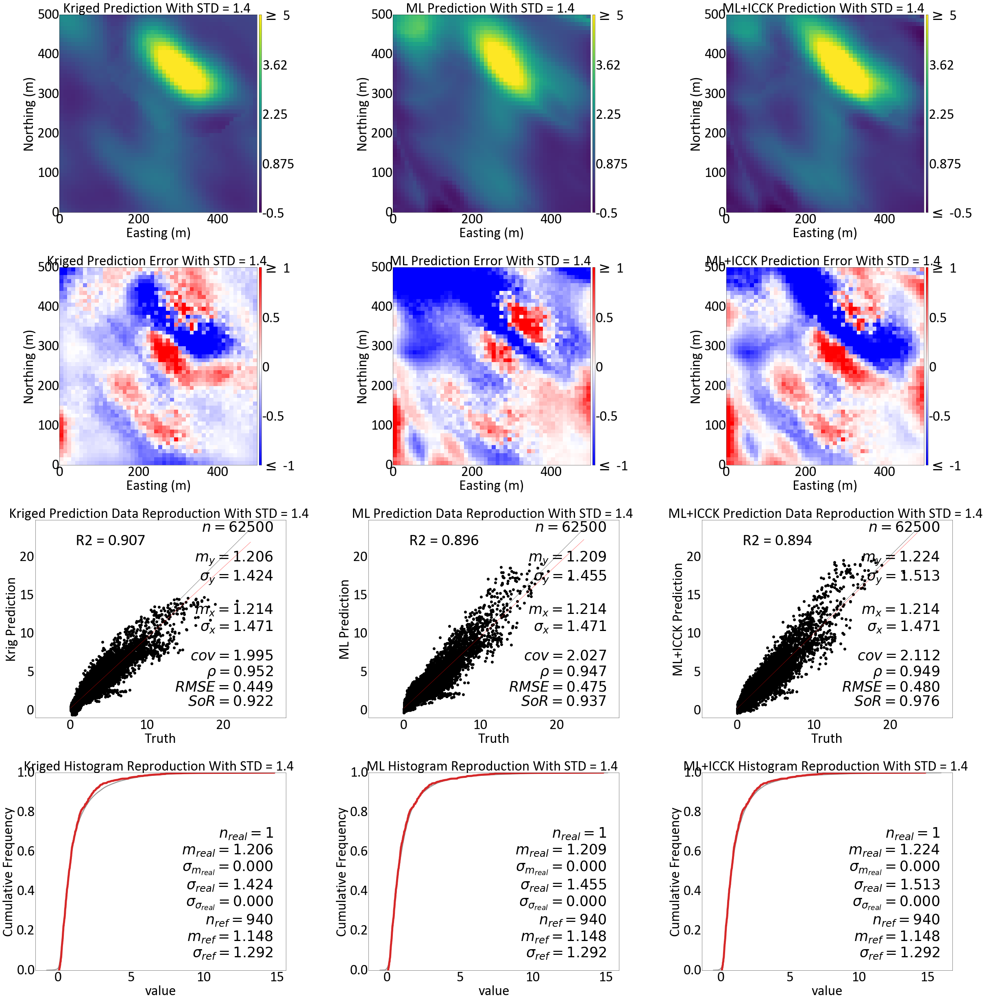

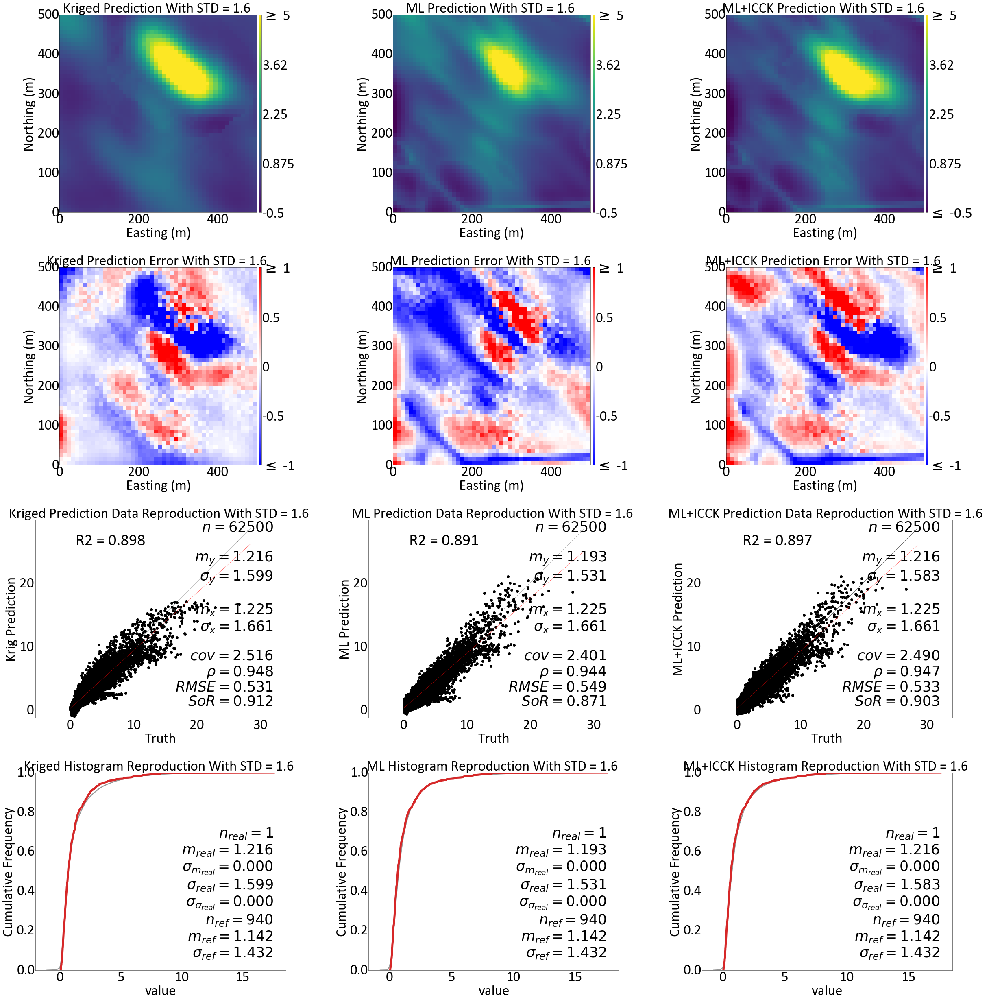

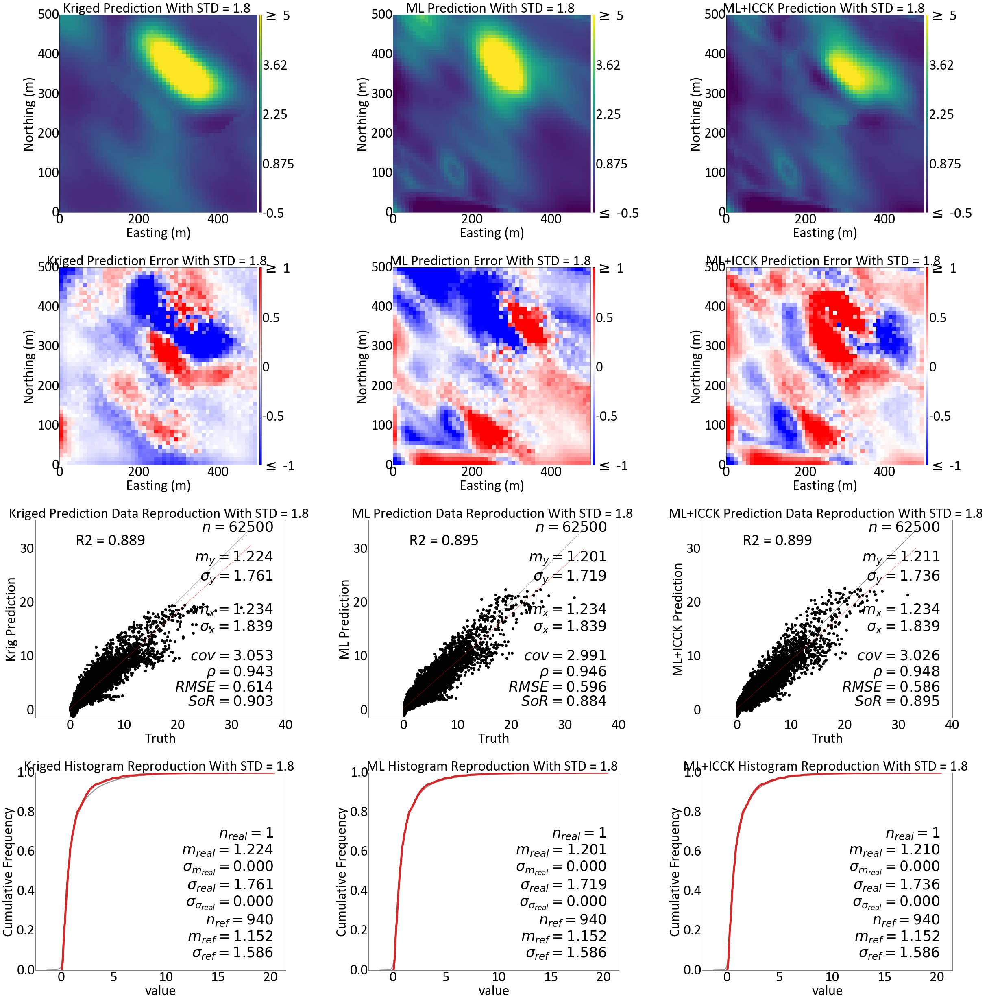

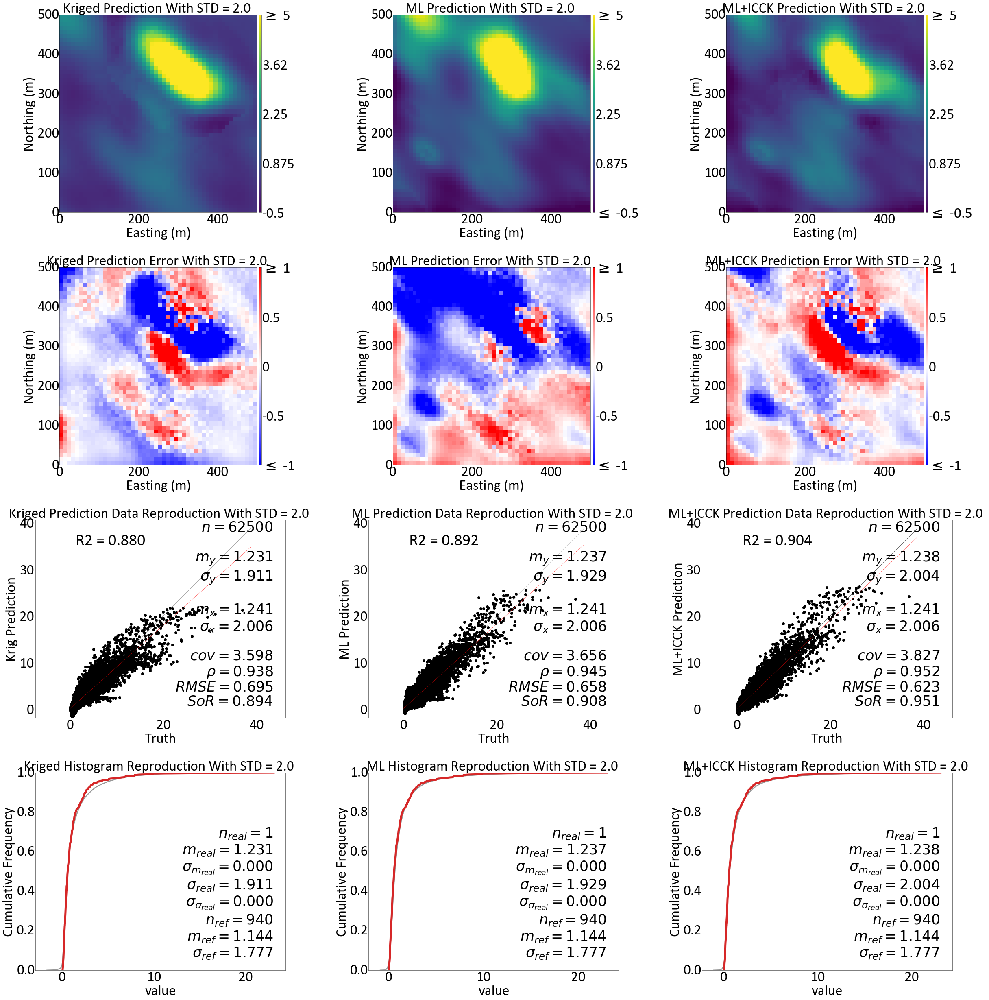

In [25]:
r2_krg_full = []
r2_ML_full = []
r2_ML_icck_full = []
rmse_krg_full = []
rmse_ML_full = []
rmse_ML_icck_full = []
mean_krig = [] 
mean_ML = []
mean_ML_icck = []
sigma_krig= []
sigma_ML= []
sigma_ML_icck= []
mean_real = []

vlim = (-0.5,5)
elim = (-1,1)

gs.set_style('pt35')
for fold in range(1,11):
    sim_krig = gs.DataFile('./predictions/kt3dn_{}.out'.format(fold))
    sim_ml = gs.DataFile('./predictions/ensemble_{}.dat'.format(fold))
    sim_ml_icck = gs.DataFile('./backtr/backtr_UDDH_{}.out'.format(fold))
    truth = gs.DataFile('logn/logn_{}.out'.format(fold),griddef=griddef)
    f, axes = plt.subplots(4, 3, figsize=(35, 35)) 
    t_max_val = np.max(truth.data['value'].values)
    t_max_val = t_max_val+1.8
    dataflpoints = gs.DataFile(flname='./declus/declus_{}.out'.format(fold), x='X',y='Y',z='Z', griddef = griddef,
                           readfl=True)  
    std = (0.2 + (fold-1)*0.2)
    std = float("{0:.1f}".format(std))
    gs.pixelplt(sim_krig.data['Estimate'],griddef=griddef,ax=axes[0,0] ,
                title = 'Kriged Prediction With STD = {} '.format(std),vlim=vlim)
    gs.pixelplt(sim_ml.data['0'],griddef=griddef,ax=axes[0,1] ,
                title = 'ML Prediction With STD = {} '.format(std),vlim=vlim)
    gs.pixelplt(sim_ml_icck.data['Back Transform'],griddef=griddef,ax=axes[0,2] ,
                title = 'ML+ICCK Prediction With STD = {} '.format(std),vlim=vlim)
    gs.pixelplt((truth.data['value']-sim_krig.data['Estimate']),griddef=griddef,ax=axes[1,0] ,
                title = 'Kriged Prediction Error With STD = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.pixelplt((truth.data['value']-sim_ml.data['0']),griddef=griddef,ax=axes[1,1] ,
                title = 'ML Prediction Error With STD = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.pixelplt((truth.data['value']-sim_ml_icck.data['Back Transform']),griddef=griddef,ax=axes[1,2] ,
                title = 'ML+ICCK Prediction Error With STD = {} '.format(std),vlim=elim,cmap = 'bwr')
    gs.scatxval(truth.data['value'],sim_krig.data['Estimate'],griddef=griddef,ax=axes[2,0] ,
                title = 'Kriged Prediction Data Reproduction With STD = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='Krig Prediction')
    axes[2,0].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_krig.data['Estimate'].fillna(value = 2.7))),size=40)
    gs.scatxval(truth.data['value'],sim_ml.data['0'],griddef=griddef,ax=axes[2,1] ,
                title = 'ML Prediction Data Reproduction With STD = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='ML Prediction')
    axes[2,1].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_ml.data['0'])),size=40)
    gs.scatxval(truth.data['value'],sim_ml_icck.data['Back Transform'],griddef=griddef,ax=axes[2,2] ,
                title = 'ML+ICCK Prediction Data Reproduction With STD = {} '.format(std),vlim=(0,t_max_val),
               xlabel = 'Truth', ylabel='ML+ICCK Prediction')
    axes[2,2].text(t_max_val-t_max_val*.97,t_max_val-t_max_val*0.09,'R2 = {0:.3f}'.format(r2_score(truth.data['value'],sim_ml_icck.data['Back Transform'])),size=40)
    gs.histpltsim(sim_krig.data['Estimate'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,0] ,lw=5,
                title = 'Kriged Histogram Reproduction With STD = {} '.format(std), nreal = 1 , )
    gs.histpltsim(sim_ml.data['0'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,1] ,lw=5,
                title = 'ML Histogram Reproduction With STD = {} '.format(std), nreal = 1)
    gs.histpltsim(sim_ml_icck.data['Back Transform'],dataflpoints.data['value'],refwt = dataflpoints.data['Declustering Weight']
                  ,griddef=griddef,ax=axes[3,2] ,lw=5,
                title = 'ML+ICCK Histogram Reproduction With STD = {} '.format(std), nreal = 1)
    
    r2_krg_full.append(r2_score(truth.data['value'],sim_krig.data['Estimate']))
    r2_ML_full.append(r2_score(truth.data['value'],sim_ml.data['0']))
    r2_ML_icck_full.append(r2_score(truth.data['value'],sim_ml_icck.data['Back Transform']))
    rmse_krg_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_krig.data['Estimate'])))
    rmse_ML_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_ml.data['0'])))
    rmse_ML_icck_full.append(np.sqrt(mean_squared_error(truth.data['value'],sim_ml_icck.data['Back Transform'])))
    mean_krig.append(np.mean(sim_krig.data['Estimate']))
    mean_ML.append(np.mean(sim_ml.data['0']))
    mean_ML_icck.append(np.mean(sim_ml_icck.data['Back Transform']))
    sigma_krig.append(np.std(sim_krig.data['Estimate']))
    sigma_ML.append(np.std(sim_ml.data['0']))
    sigma_ML_icck.append(np.std(sim_ml_icck.data['Back Transform']))
    mean_real.append(np.mean(dataflpoints.data['value']))
    
    plt.tight_layout()  
    plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Data_Number_{}_{}.png'.format(fold,plt_extent))

In [26]:
num_dhs = np.zeros(shape=(10))
k = 0
for i in range(1,11):
    num_dhs[k] = 0.2 + (i-1)*0.2
    k += 1
ML_Stats = np.vstack((num_dhs,mean_real,rmse_ML_full,r2_ML_full,sigma_ML,mean_ML)).T
ML_icck_Stats = np.vstack((num_dhs,mean_real,rmse_ML_icck_full,r2_ML_icck_full,sigma_ML_icck,mean_ML_icck)).T
Krig_Stats = np.vstack((num_dhs,mean_real,rmse_krg_full,r2_krg_full,sigma_krig,mean_krig)).T


In [27]:
num_dhs

array([0.2, 0.4, 0.6, 0.8, 1. , 1.2, 1.4, 1.6, 1.8, 2. ])

In [28]:
print(r2_ML_icck_full)
print(rmse_ML_icck_full)

[0.9177130993391435, 0.9253113778508122, 0.9260607951126896, 0.9002999430299323, 0.9157867066123886, 0.9113591830548501, 0.8935880749729285, 0.8969504505760882, 0.8985959724703185, 0.9035364824310053]
[0.05398490705331393, 0.10843280588989322, 0.1677035105695241, 0.2651003295136827, 0.3072373917508665, 0.37809492389027544, 0.47982183586013233, 0.5330846180016137, 0.5856019789809094, 0.6231170193633847]


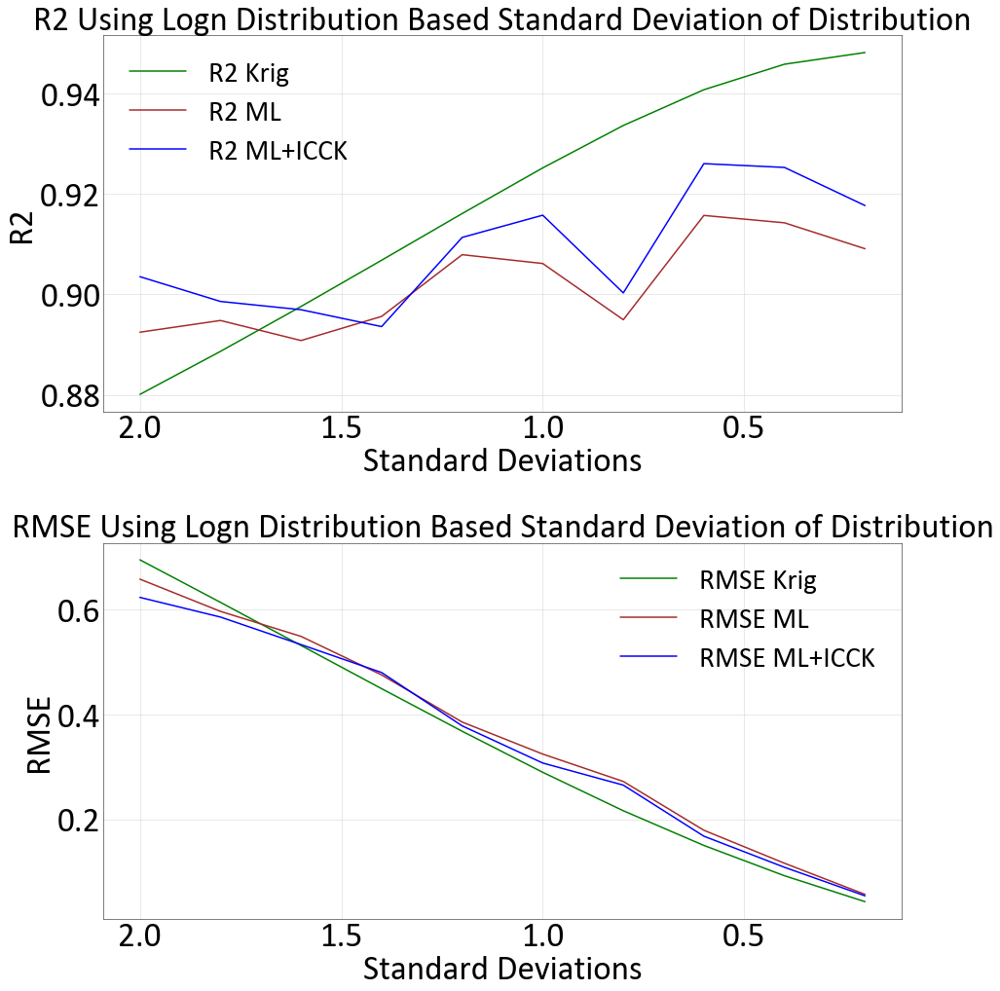

In [29]:
f, (ax1,ax2) = plt.subplots(2, 1,figsize=(15, 15))
ax1.plot(num_dhs, np.asarray(r2_krg_full),color="green", label ='R2 Krig')
ax1.plot(num_dhs, np.asarray(r2_ML_full),color="brown", label ='R2 ML')
ax1.plot(num_dhs, np.asarray(r2_ML_icck_full),color="blue", label ='R2 ML+ICCK')
ax1.set_xlabel('Standard Deviations')
ax1.grid(True)
ax1.set_title('R2 Using Logn Distribution Based Standard Deviation of Distribution')
ax1.set_ylabel('R2', color='Black')
ax1.tick_params(axis='y', labelcolor='Black')
ax1.legend(loc='best',fontsize = 'small')
ax1.invert_xaxis()
#ax1.set_ylim([0.4,1])

ax2.plot(num_dhs, np.asarray(rmse_krg_full),'-',color="green",label ='RMSE Krig')
ax2.plot(num_dhs, np.asarray(rmse_ML_full),'-',color="brown",label ='RMSE ML')
ax2.plot(num_dhs, np.asarray(rmse_ML_icck_full),'-',color="blue",label ='RMSE ML+ICCK')
ax2.set_title('RMSE Using Logn Distribution Based Standard Deviation of Distribution')
ax2.grid(True)
ax2.set_xlabel('Standard Deviations')
ax2.set_ylabel('RMSE', color='Black')
ax2.tick_params(axis='y', labelcolor='Black')
ax2.legend(loc='best',fontsize = 'small')
ax2.invert_xaxis()
#ax2.set_ylim([0,0.8])
plt.tight_layout()  
plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Sum_graph_{}.png'.format(plt_extent))

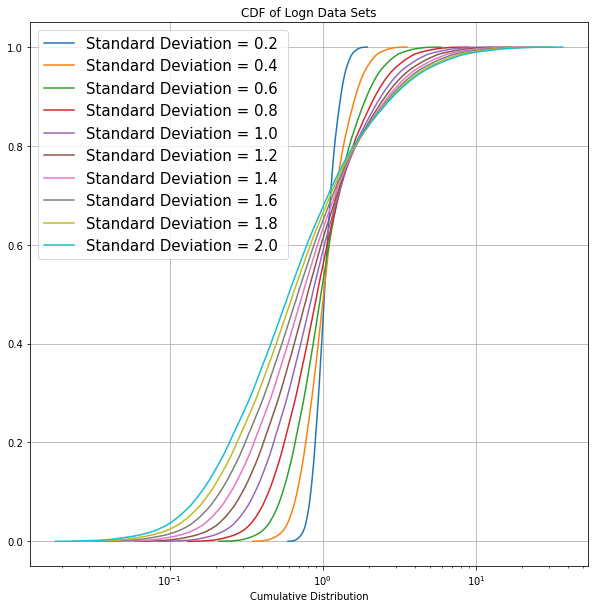

In [4]:
plt.figure(figsize=(10,10))
gs.set_style('pt35')
plt.xscale('log',basex=10)
for fold in range(1,11): 
    std = 0.2 + (fold-1)*0.2
    std = float("{0:.1f}".format(std))
    data_req = gs.DataFile("logn/logn_{}.out".format(fold))
    sorted_values = pd.DataFrame(data_req.data['value']).apply(lambda x: x.sort_values())
    y = np.linspace(0.,1., len(sorted_values))
    plt.plot(sorted_values, y,label="Standard Deviation = {} ".format(std))
    plt.legend(loc=2, prop={'size': 15})
plt.xlabel('Value')
plt.xlabel('Cumulative Distribution')
plt.title('CDF of Logn Data Sets')
plt.grid(True)
plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/CDF_dist_logn_{}.png'.format(plt_extent))
plt.show()

In [31]:
ml_sim = np.asarray(ML_Stats).flatten().reshape(len(np.asarray(ML_Stats).flatten()),1)
icck_ml_sim = np.asarray(ML_icck_Stats).flatten().reshape(len(np.asarray(ML_icck_Stats).flatten()),1)
krig_sim = np.asarray(Krig_Stats).flatten().reshape(len(np.asarray(Krig_Stats).flatten()),1)

In [32]:
np.savetxt('ML_stats.csv', ML_Stats, delimiter = ',')
np.savetxt('Krig_stats.csv', Krig_Stats, delimiter = ',')
np.savetxt('ML_icck_stats.csv', ML_icck_Stats, delimiter = ',')

In [33]:
# samplefl = gs.DataFile('datasamplefl.out')
# gs.set_style('pt25')
# xlim=(-0.05,2)
# f, axes = plt.subplots(3, 1, figsize=(25, 20))
# gs.histpltsim(krig_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[0],
#               title = 'CDF Sensitivity Study Krig ', xlim=xlim)
# gs.histpltsim(ml_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[1],
#               title = 'CDF Sensitivity Study ML ', xlim=xlim)
# gs.histpltsim(icck_ml_sim,samplefl.data['value'],griddef=griddef,nreal=20,ax = axes[2],
#               title = 'CDF Sensitivity Study ML+OICCK ', xlim=xlim)
# plt.tight_layout()    
# plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/Dist_study_{}.png'.format(plt_extent))

In [ ]:
# varsim = gs.Program('varsim')
# varsimparstr = """                 Parameters for VarSim
#                  *********************

# START OF PARAMETERS:
# ../data/lithology.dat        -file with lithology information
# 0   7                        -   lithology column (0=not used), code
# {datafl}             -file with data
# 1   {col}                -   number of variables, column numbers
# -1.0e21     1.0e21    -   trimming limits
# ./vargs/varsim_reals_{p_type}_{fold}.out      -output file for variograms of realizations
# ./vargs/varsim_avg_{p_type}_{fold}.out        -output file for average variogram
# {griddef}
# 1                  -number of realizations
# 3  100                 -number of directions, number of lags
# 1  0  0              -ixd(1),iyd(1),izd(1)
# 0  1  0              -ixd(2),iyd(2),izd(2)
# 0  0  1              -ixd(2),iyd(2),izd(2)
# 0                     -standardize sill? (0=no, 1=yes)
# 1                     -number of variograms
# 1   1   1             -tail variable, head variable, variogram type
# """

In [ ]:
# gs.set_style('pt25')
# ylim = (-.2,1.2)
# f, axes = plt.subplots(3, 2, figsize=(25, 20))
# for fold in range(1,2):
#     varmodelfl = gs.DataFile('./vargs/varmodel_{}.out'.format(fold))
#     varcalcfl = gs.DataFile('./vargs/varcalc_{}.out'.format(fold))
#     for p_type in list(['Krig','ML','OICCK+ML']):
#         if p_type == 'Krig':
#             predfile = gs.DataFile('./predictions/kt3dn_{}.out'.format(fold),griddef=griddef)
#             col = 1
#         if p_type == 'OICCK+ML':
#             predfile = gs.DataFile('./backtr/backtr_UDDH_{}.out'.format(fold),griddef=griddef)
#             col = 3
#         else:
#             predfile = gs.DataFile('./predictions/ensemble_{}.dat'.format(fold),griddef=griddef)
#             col = 1
            
#         varsim.run(varsimparstr.format(datafl = predfile,
#                                        p_type = p_type,
#                                        fold = fold,
#                                        col = col,
#                                        griddef = griddef),quiet=True,liveoutput=False)
#         varsimfl =  gs.DataFile('./vargs/varsim_reals_{}_{}.out'.format(p_type,fold))
    

#         if p_type == 'Krig':
#             ax = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax =axes[0,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax = gs.varplt(varcalcfl.data,index = 1,ax =ax,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Experimental',ylim=ylim)
#             ax = gs.varplt(varmodelfl,experimental=False,color ='C1' ,index = 1,ax =ax, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Model',ylim=ylim)
#             ax.legend(loc=7,prop={'size': 20})
#             ax.set_xlim(0, 400)
            
#             ax2 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax =axes[0,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax2 = gs.varplt(varcalcfl.data,index = 2,ax =ax2,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Experimental',ylim=ylim)
#             ax2 = gs.varplt(varmodelfl,experimental=False,color ='C1' ,ms = 10,index = 2,ax =ax2, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Model',ylim=ylim)
#             ax2.legend(loc=7,prop={'size': 20})
#             ax2.set_xlim(0, 400)
            
#         if p_type == 'ML':
#             ax4 = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax = axes[1,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax4.legend(loc=7,prop={'size': 20})
#             ax4.set_xlim(0, 400)
#             ax5 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax = axes[1,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             ax5.set_xlim(0, 400)

#         if p_type == 'OICCK+ML':
#             ax6 = gs.varplt(varsimfl,experimental=False,color ='C0' ,index = 1,ax = axes[2,0],ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             #ax = gs.varplt(varcalcfl.data,index = 1,ax =ax,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Experimental')
#             #ax = gs.varplt(varmodelfl,experimental=False,color ='C1' ,index = 1,ax =ax, title = 'Varsim est type {} fold {} Major Direction'.format(p_type,fold),label= 'Model')
#             ax6.legend(loc=7,prop={'size': 20})
#             ax6.set_xlim(0, 400)
#             ax7 = gs.varplt(varsimfl,experimental=False,color ='C0' ,ms = 10,index = 2,ax = axes[2,1], title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold), label= 'Varg Rep',ylim=ylim)
#             #ax2 = gs.varplt(varcalcfl.data,index = 2,ax =ax2,color ='C1' ,ms = 10, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Experimental')
#             #ax2 = gs.varplt(varmodelfl,experimental=False,color ='C1' ,ms = 10,index = 2,ax =ax2, title = 'Varsim est type {} fold {} Minor Direction'.format(p_type,fold),label= 'Model')
#             ax7.legend(loc=7,prop={'size': 20})
#             ax7.set_xlim(0, 400)


#     plt.tight_layout()    
#     plt.savefig('C:/Users/Matt/Desktop/Thesis Work/Thesis/0-Figures/3-Chapter/varg_rep_ERBFN_{}_{}.png'.format(plt_extent,fold))
#     plt.show()
